# Supervised Learning

## Overview
In this chapter, the following supervised machine learning (ML) algorithms will be discussed:
1. Multilinear Regression
2. Logistic Regression
3. K-Nearest Neighbor (KNN)
4. Support Vector Machine (SVM)
5. Decision Tree
6. Random Forest
7. Extra Trees
8. Gradient Boosting
9. Extreme Gradient Boosting
10. Adaptive Gradient Boosting

---

# Linear Regression

There are different types of regression algorithms such as linear regression, ridge regression, polynomial regression, lasso regression, etc., each suitable for different purposes.

In linear regression, the **least square method** is used to find the slope and y-intercept. The least square method minimizes the squared distance from each data point to the line being fitted. 

For **multilinear regression models** with multiple input features, the equation can be written as:

$$
y = m_1 x_1 + m_2 x_2 + \dots + m_n x_n + b
$$

Where:
- \( y \) is the predicted output
- \( x_1, x_2, \dots, x_n \) are input features
- \( m_1, m_2, \dots, m_n \) are the corresponding coefficients
- \( b \) is the intercept term

Note that the multilinear regression model assumes a linear relationship between input and output features. It also assumes that independent variables (input features) are continuous, rather than discrete. 

While some petroleum engineering problems may exhibit nonlinear relationships, care should be taken when applying this algorithm to nonlinear scenarios.

---

# Regression Evaluation Metrics

### 1. **Mean Absolute Error (MAE)**:
MAE is the mean of the absolute values of the errors. It represents the average absolute difference between actual and predicted values. MAE is also referred to as a loss function, as the objective is to minimize it. It is defined as:

$$
\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|
$$

Where:
- \( y_i \) is the actual value for the \(i\)-th data point
- \( \hat{y}_i \) is the predicted value from the model
- \( n \) is the number of data points

### 2. **Mean Squared Error (MSE)**:
MSE is the mean of the squared errors and is another common loss function that should be minimized. MSE penalizes larger errors more significantly compared to MAE. It is given by:

$$
\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2
$$

### 3. **Root Mean Squared Error (RMSE)**:
RMSE is simply the square root of the MSE. It is popular for its interpretive capability and is calculated as:

$$
\text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
$$
{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
\]
sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2} \tag{5.5}
\]
sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2} \tag{5.5}
\]


# Application of multilinear regression model in scikit-learn

# Step 1 - Data Importation

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("darkgrid")
df = pd.read_csv('Chapter5_Geologic_DataSet.csv')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Porosity (%),200.0,10.493805,2.079824,4.585000,9.03875,10.549000,12.181750,16.485000
Matrix Perm (nd),200.0,433.075000,173.101415,113.000000,312.25000,403.500000,528.750000,987.000000
Acoustic impedance (kg/m2s*10^6),200.0,3.265735,0.623574,1.408000,2.80225,3.250500,3.679500,5.093000
Brittleness Ratio,200.0,57.794340,16.955346,13.128000,45.30600,59.412000,69.915000,101.196000
TOC (%),200.0,3.970700,1.907119,0.100000,2.47000,4.120000,5.400000,8.720000
Vitrinite Reflectance (%),200.0,1.571440,0.240662,0.744000,1.41600,1.568000,1.714000,2.296000
Aroot(K),200.0,50.000000,11.505310,24.437856,41.96103,49.692285,58.986667,77.270733


# Step 2 - Data Visualization
* Let’s visualize the distribution of each parameter using subplots as follows.

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

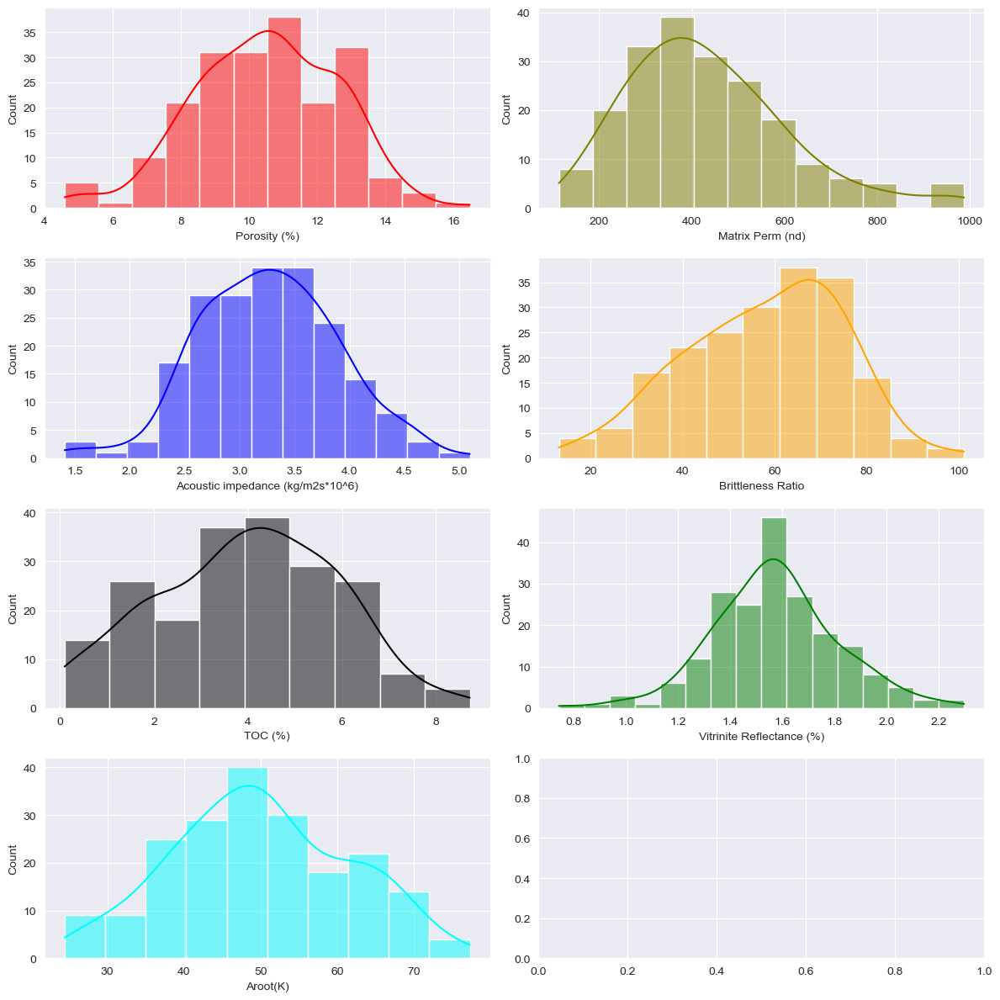

In [4]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Porosity (%)'], color = "red", ax = axes[0, 0], kde = True)
sns.histplot(df['Matrix Perm (nd)'], color = "olive", ax = axes[0, 1], kde = True)
sns.histplot(df['Acoustic impedance (kg/m2s*10^6)'], color = "blue", ax = axes[1, 0], kde = True)
sns.histplot(df['Brittleness Ratio'], color = "orange", ax = axes[1, 1], kde = True)
sns.histplot(df['TOC (%)'], color = "black", ax = axes[2, 0], kde = True)
sns.histplot(df['Vitrinite Reflectance (%)'], color = "green", ax = axes[2, 1], kde = True)
sns.histplot(df['Aroot(K)'], color = "cyan", ax = axes[3, 0], kde = True)

plt.tight_layout()

### In addition to distribution plots, let’s also visualize the box plots for each parameter as follows:

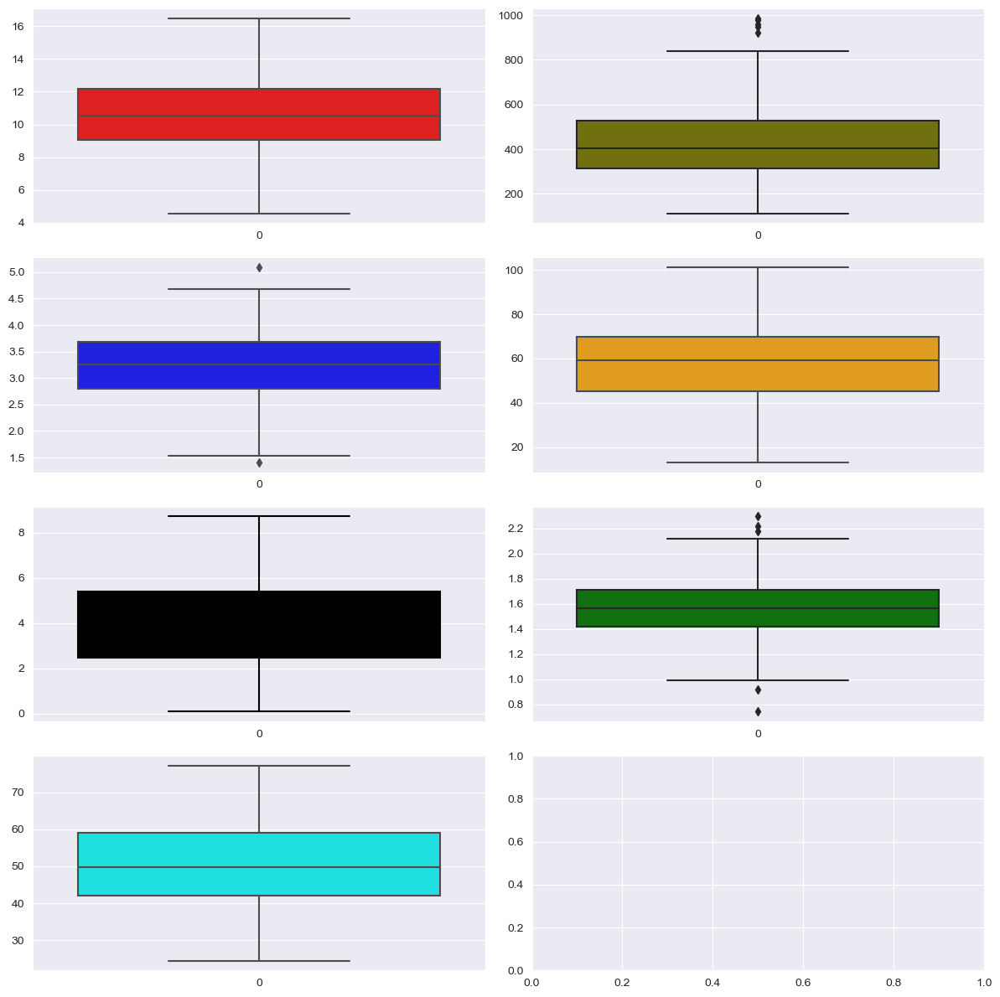

In [5]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.boxplot(df['Porosity (%)'], color = "red", ax = axes[0, 0])
sns.boxplot(df['Matrix Perm (nd)'], color = "olive", ax = axes[0, 1])
sns.boxplot(df['Acoustic impedance (kg/m2s*10^6)'], color = "blue", ax = axes[1, 0])
sns.boxplot(df['Brittleness Ratio'], color = "orange", ax = axes[1, 1])
sns.boxplot(df['TOC (%)'], color = "black", ax = axes[2, 0])
sns.boxplot(df['Vitrinite Reflectance (%)'], color = "green", ax = axes[2, 1])
sns.boxplot(df['Aroot(K)'], color = "cyan", ax = axes[3, 0])

plt.tight_layout()

It is also important to get an understanding of the relationship between
**input features (x)** and **Aroot(K) (output feature, y)** in scatter plots as follows:

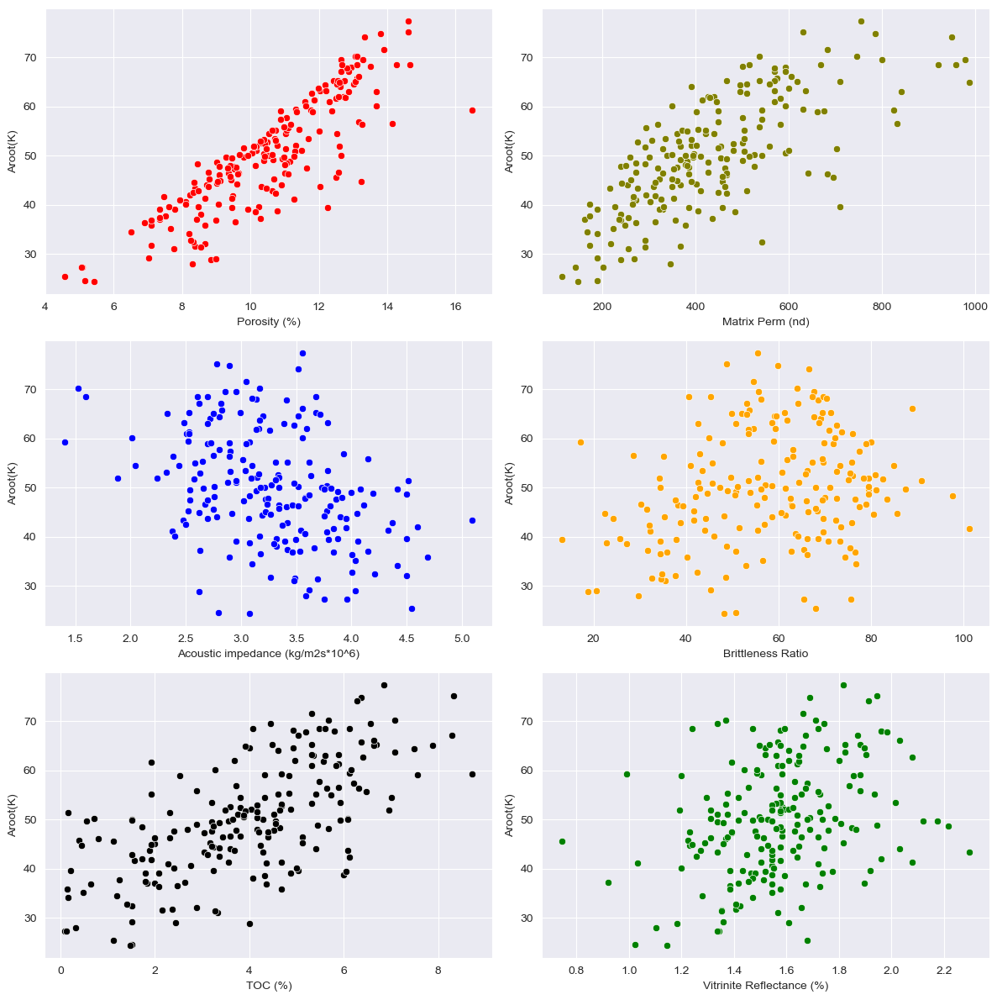

In [7]:
f, axes = plt.subplots(3, 2, figsize = (12, 12))
sns.scatterplot(x = df['Porosity (%)'], y = df['Aroot(K)'], color = "red",
                ax = axes[0, 0])

sns.scatterplot(x = df['Matrix Perm (nd)'], y = df['Aroot(K)'],
                color = "olive", ax = axes[0, 1])

sns.scatterplot(x = df['Acoustic impedance (kg/m2s*10^6)'], y = df['Aroot(K)'],
                color = "blue", ax = axes[1, 0])

sns.scatterplot(x = df['Brittleness Ratio'], y = df['Aroot(K)'],
                color = "orange", ax = axes[1, 1])

sns.scatterplot(x = df['TOC (%)'], y = df['Aroot(K)'], color = "black",
                ax = axes[2, 0])

sns.scatterplot(x = df['Vitrinite Reflectance (%)'], y = df['Aroot(K)'],
                color = "green", ax = axes[2, 1])

plt.tight_layout()

To find whether there are **collinear input features**, let’s use the seaborn
library to **draw a heat map** with **Pearson correlation coefficient** inside of each
square.

<Axes: >

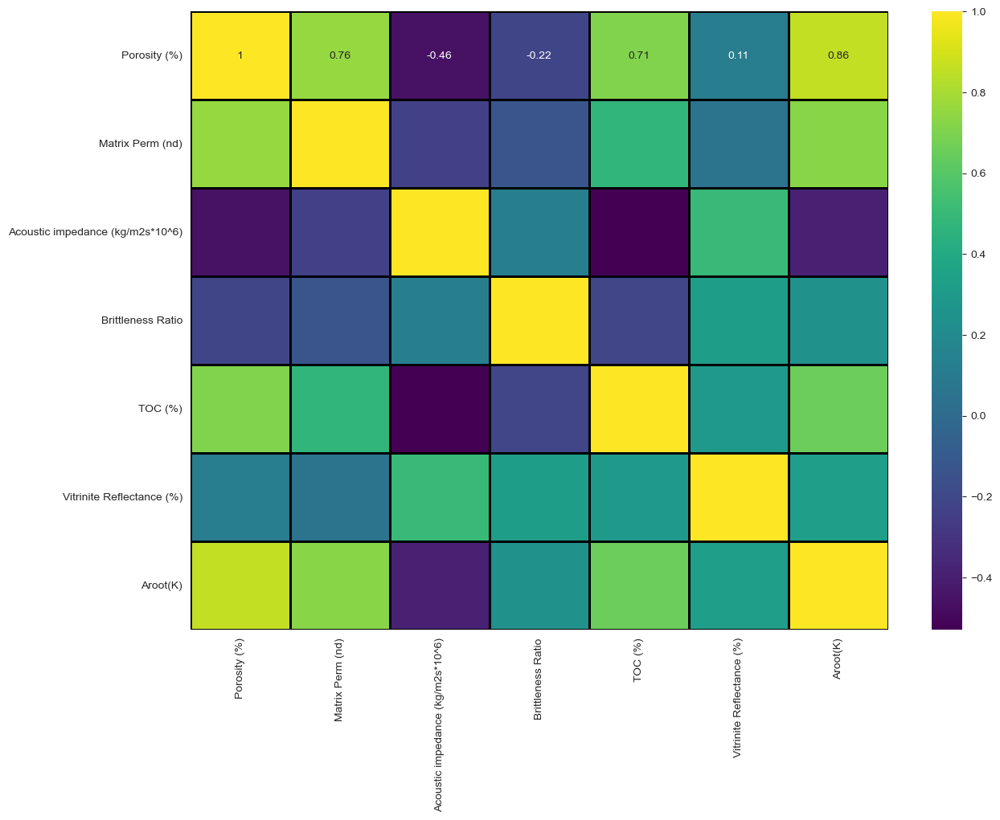

In [8]:
plt.figure(figsize = (14,10))

sns.heatmap(df.corr(),linewidths = 2, linecolor = 'black',
            cmap = 'viridis', annot = True)

# Important notes in step 2
* As illustrated, **porosity and matrix perm are highly correlated with a
Pearson correlation coefficient of 0.76**.

* In addition, **porosity and TOC have a
strong Pearson correlation coefficient of 0.71**.

* Since **matrix perm and TOC**
provide similar information as **porosity**, it is recommended to drop these two
features prior to proceeding with the next step.

* To drop **matrix perm and TOC**, pandas’ drop syntax can be used as follows.

* Please make sure **"inplace = True"** to make sure these two columns are
dropped permanently.

In [9]:
# axis = 1, is for dropping columns

df.drop(['TOC (%)', 'Matrix Perm (nd)'], axis = 1, inplace = True)

# Step 3 - Data Normalization
* Let’s normalize the input features prior to applying multilinear
regression.

* Scikit-learn library has a preprocessing portion where the interested features can be normalized to have a range between **0 and 1** as illustrated below:

* First, **"from sklearn import preprocessing"**, then define the range for
MinMax scaler to be between 0 and 1 and assign it to variable **"scaler"**.

* Afterward, apply the **"scaler.fit"** function to the **"df"** data frame (which includes both inputs and output features) to create the scaler model based on the
data (df).

* Next, transform the df data frame using **"scaler.transform(df)"** to
have a range between **0 and 1 ([0,1])** and call this **"df_scaled"**.

* Finally, **print "df_scaled"** to see the scaled data frame which will be in an array format
between 0 and 1 for each feature.

* Note that **scaler.transform** method will return
a numpy array.

* Therefore, in the next step, **"pd.DataFrame"** is used to convert
the data (df_scaled) back to pandas data frame.

In [10]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler(feature_range = (0,1))

scaler.fit(df)

df_scaled = scaler.transform(df)
print(df_scaled)

[[0.32529412 0.45373134 0.9600763  0.71134021 0.45177576]
 [0.34294118 0.57910448 0.48003815 0.48969072 0.31917731]
 [0.43941176 0.81492537 0.84289413 0.92268041 0.47793158]
 [0.65411765 0.40298507 0.39337784 0.48969072 0.65669029]
 [0.64529412 0.56716418 0.         0.5        0.28514944]
 [0.46941176 0.42089552 0.5812781  0.3814433  0.50238885]
 [0.40823529 0.49253731 0.71903529 0.4742268  0.43843026]
 [0.29588235 0.5880597  0.5731026  0.51546392 0.30503973]
 [0.35117647 0.34328358 0.74710451 0.54123711 0.42118734]
 [0.39411765 0.72537313 0.75296362 0.88659794 0.47808031]
 [0.49941176 0.28059701 0.68360812 0.43298969 0.56731787]
 [0.56705882 0.30149254 0.51996185 0.47938144 0.66317086]
 [0.60411765 0.45373134 0.75909524 0.54123711 0.66004008]
 [0.63764706 0.37910448 0.61983922 0.64948454 0.75497868]
 [0.42823529 0.36716418 0.75323614 0.36597938 0.48654097]
 [0.28176471 0.64179104 0.64164055 0.62886598 0.31453193]
 [0.76470588 0.53731343 0.33451424 0.5257732  0.72852016]
 [0.53117647 0

# Step 4 - Converting Normarlized Data from array to DataFrame
* Next, let’s convert the numpy array to a data frame as follows:

In [11]:
df_scaled = pd.DataFrame(df_scaled, columns = ['Porosity (%)',
                        'Acoustic impedance (kg/m2s*10^6)', 'Brittleness Ratio',
                        'Vitrinite Reflectance (%)', 'Aroot(K)'])

# Step 5 - Training the Model
* Since the data have now been converted to a data frame, to train a supervised ML model, let’s define x features (input features) which are porosity,
acoustic impedance, brittleness ratio, and vitrinite reflectance in this example.

* The only **y feature is Aroot(K)**.

* "x_scaled" represents the normalized input
features.

* "y_scaled" represents the normalized Aroot(K) feature.

In [12]:
y_scaled = df_scaled['Aroot(K)']

x_scaled = df_scaled.drop(['Aroot(K)'], axis = 1)

### Data Splitting for Training and Testing

The next step in training a model is to split the data between training and testing. The `model_selection` library in scikit-learn can be used to randomly split the data between the training and testing set, as illustrated below.

First, import `train_test_split` from `sklearn.model_selection`. Next, to obtain the same result, let’s fix the seed number (in this example, `1000` was chosen, but any number can be used as the seed to replicate the process). 

- `X_train` and `y_train` represent the input and output data points assigned to the training portion, which consists of 70% of the data.
- `X_test` and `y_test` represent the input and output data points assigned to the testing portion, consisting of 30% of the data (`test_size=0.3`).

To see which rows were selected as training versus testing data, simply print `X_train` or `X_test`, and the resulting output will show the input features' rows that were chosen as training versus testing, based on the seed number of `1000`.

Below is the code to split the data:

```python
from sklearn.model_selection import train_test_split

# Assuming X and y are predefined as your feature matrix and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1000)

# To see the selected rows, simply type:
print(X_train)
print(X_test)


In [13]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(x_scaled, y_scaled,
                                                test_size=0.3, random_state=1000)

# To see the selected rows, simply type:
X_train

,Porosity (%),Acoustic impedance (kg/m2s*10^6),Brittleness Ratio,Vitrinite Reflectance (%)
44,0.695294,0.382090,0.453468,0.726804
101,0.401176,0.525373,0.562611,0.407216
25,0.042353,0.635821,0.594359,0.386598
3,0.654118,0.402985,0.393378,0.489691
68,0.487647,0.641791,0.515874,0.608247
...,...,...,...,...
94,0.541176,0.459701,0.814007,0.572165
192,0.812941,0.325373,0.365445,0.546392
71,0.448235,0.489552,0.658945,0.505155
87,0.490000,0.602985,0.713585,0.567010


# Continuation
* Next, let’s import linear regression model
from the scikit-learn.

* Afterward, place the **"lm = LinearRegression()"** to
initialize an instance of the linear model called "lm".

In [14]:
from sklearn.linear_model import LinearRegression

seed = 1000

np.random.seed(seed)
lm = LinearRegression()

# Continuation
* Next, let’s fit the lm model to "(X_train, y_train)" which will fit the linear
regression model to the training rows.

In [15]:
lm.fit(X_train, y_train)

LinearRegression()

# Continuation
* Next, let’s get the intercept of the model by calling "lm.intercept_"

In [16]:
lm.intercept_

-0.2956531626291044

# Continuation

To get the coefficients of the linear regression model, we call the `lm.coef_` attribute from the trained linear regression model object (`lm`).

As shown below, **porosity** has a coefficient of `1.070`, **acoustic impedance** has a coefficient of `-0.178`, and so on.

These coefficients, along with the intercept value obtained earlier, can be used to formulate the multilinear regression model equation. 

The equation can then be used to predict the output feature **Aroot(K)**.

### Important:
Before using these coefficients and intercept values, make sure to normalize the data prior to feeding it into the formulated multilinear regression equation. This is necessary because we normalized the data before feeding it into the linear regression model.

Here’s how to access the coefficients:

```python
# Assuming `lm` is the trained linear regression model
coefficients = lm.coef_

# Print the coefficients
print("Coefficients:", coefficients)


In [17]:
coeff_df = pd.DataFrame(lm.coef_, x_scaled.columns,
                        columns=['Coefficient'])

coeff_df

,Coefficient
Porosity (%),1.069765
Acoustic impedance (kg/m2s*10^6),-0.178141
Brittleness Ratio,0.426330
Vitrinite Reflectance (%),0.231669


# Continuation
### Applying the Trained Model to the Test Data

* Next, we’ll apply the trained `lm` model to `X_test` in order to obtain the predicted \( y \) values associated with the testing portion of the data. To do so, we use:

* As shown below, the predicted versus actual values seem to lie on the `45 degree line` which means
the `testing accuracy must be high`.

* Next, we will obtain the `R2` value by
importing the metrics library within sklearn.

Text(0.5, 1.0, 'Actual Vs. Predicted, Testing Data Set (30% of the data)')

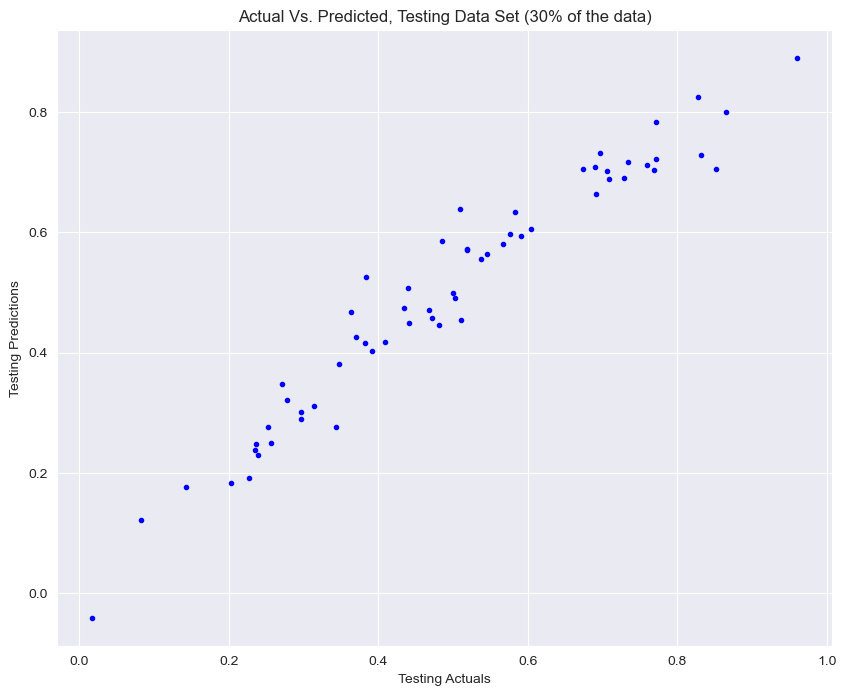

In [18]:
plt.figure(figsize = (10,8))

y_pred = lm.predict(X_test)

plt.plot(y_test, y_pred, 'b.')
plt.xlabel('Testing Actuals')
plt.ylabel('Testing Predictions')
plt.title('Actual Vs. Predicted, Testing Data Set (30% of the data)')

In [20]:
# Let’s import the R2 score library from sklearn.metrics and obtain the R2
# value for the testing set as follows:

from sklearn.metrics import r2_score

test_set_r2 = r2_score(y_test, y_pred)

print('Testing r^2:', round(test_set_r2, 2))

Testing r^2: 0.94


In [21]:
# Let’s also obtain MAE, MSE, and RMSE from the metrics library as follows:

from sklearn import metrics

print('MAE:', round(metrics.mean_absolute_error(y_test, y_pred), 5))
print('MSE:', round(metrics.mean_squared_error(y_test, y_pred), 5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)), 5))

MAE: 0.03793
MSE: 0.00266
RMSE: 0.05159


# Step 6 - Confirmation and Summary
* Now, let’s create a histogram of the distribution of residuals indicating the
difference between predicted y values and actual y values as follows:

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='Aroot(K)', ylabel='Count'>

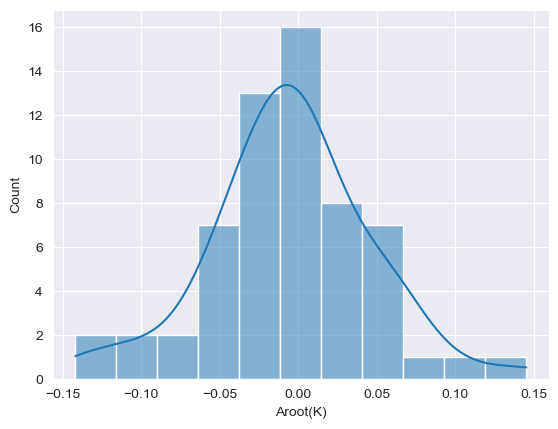

In [22]:
sns.histplot((y_test-y_pred), kde = True)

# Important Notice
When the residual is `normally distributed`, it is one sign that **the model was
the correct choice** for the data set.

* Next, let’s use the statsmodel which is a Python package that provides a
complement to scipy for statistical computations (Statsmodels, 2020) to get the
summary stats of the multilinear regression model.

In [23]:
import statsmodels.api as sm

X = sm.add_constant(X_train)

model = sm.OLS(y_train, X).fit()

predictions = model.predict(X)
model_stats = model.summary()
print(model_stats)

                            OLS Regression Results                            
Dep. Variable:               Aroot(K)   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     589.0
Date:                Fri, 04 Oct 2024   Prob (F-statistic):           2.26e-84
Time:                        00:30:54   Log-Likelihood:                 218.23
No. Observations:                 140   AIC:                            -426.5
Df Residuals:                     135   BIC:                            -411.7
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const   

# One-Variable-at-a-Time (OVAT) Sensitivity Analysis

**One-variable-at-a-time (OVAT)** is a commonly used sensitivity analysis tool where one variable is altered at a time to observe the impact of the change on the model output. All other input variables are held constant while the variable of interest is varied. 

For instance, the average or median value of each parameter within the training dataset can be used as the constant value for all parameters except the one being tested.

In this example, an Excel sheet titled **"Sensitivity Analysis"** was created, and each input feature was sensitized as follows:

- **Porosity** was increased from **4.5% to 16.5%** in increments of 1%, while other parameters were held at approximately the average of the training set to obtain predicted values of **Aroot(K)** from the trained model.
  
- **Acoustic Impedance** was increased from **1.4 to 5** in increments of 0.1, while other parameters were kept at their average values from the training set to obtain the predicted values of **Aroot(K)**.

- **Brittleness Ratio** was increased from **13 to 103** in increments of 10, while other parameters remained constant at the training set average, to obtain predicted values of **Aroot(K)**.

- **Vitrinite Reflectance** was increased from **0.74 to 2.34** in increments of 0.2, keeping other parameters at their average values, to predict **Aroot(K)** values.

#### Output Feature Placeholder
Since the output feature (i.e., **Aroot(K)**) cannot be left blank (which would result in a Python error), an arbitrary value of 50 was selected for the entire **Aroot(K)** column. Note that **Aroot(K)** is the target column being predicted, and as long as the output cells are filled with a value, the code will run without errors. If the cells are left empty, Python will raise an error.

---

### Important Considerations:
- The sensitivity range selected for each input feature should lie between the **minimum and maximum** values of that feature in the training dataset.
- **Avoid extrapolating** beyond the range of the training data as ML models are designed for interpolation, not extrapolation. Using values outside the training range can lead to inaccurate or unreliable predictions.


# Step 1 - File Importation

In [24]:
df_sensitivity = pd.read_excel('Chapter5_Geologic_Sensitivity_DataSet.xlsx')

df_sensitivity.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Porosity (%),69.0,10.500000,1.635992,4.50,10.5,10.50,10.5,16.50
Acoustic impedance (kg/m2s*10^6),69.0,3.223188,0.787988,1.40,3.1,3.25,3.3,5.00
Brittleness Ratio,69.0,58.855072,11.020403,13.00,59.0,59.00,59.0,103.00
Vitrinite Reflectance (%),69.0,1.505217,0.188357,0.74,1.5,1.50,1.5,2.34
Aroot(K),69.0,50.000000,0.000000,50.00,50.0,50.00,50.0,50.00


# Step 2 - Data Normalization
* Since the training data set was normalized prior to applying the multilinear
regression model, let’s first normalize the sensitivity data set prior to asking for
prediction as follows:

In [25]:
scaled_sensitivity = scaler.transform(df_sensitivity)

# Step 3 - Converting Normalized Data from array to a DataFrame
* Let’s also convert the resulting numpy array (scaled sensitivity) to a data
frame and define the input and output features for this sensitivity data set.

In [26]:
scaled_sensitivity = pd.DataFrame(scaled_sensitivity,
                                  columns = ['Porosity (%)',
                                             'Acoustic impedance (kg/m2s*10^6)',
                                             'Brittleness Ratio',
                                             'Vitrinite Reflectance (%)',
                                             'Aroot(K)'])


y_scaled_sensitivity = scaled_sensitivity['Aroot(K)']

x_scaled_sensitivity = scaled_sensitivity.drop(['Aroot(K)'], axis = 1)

# Cotinuation
* Thus far, the sensitivity data set has been imported and x and y features
have been defined.

* Now, let’s apply the `"lm"` model that was trained to `"x_scaled_sensitivity"` to predict the y values for each of the sensitivity rows
in the sensitivity data frame.

In [27]:
y_pred_sensitivity = lm.predict(x_scaled_sensitivity)

# Continuation
`"y_pred_sensitivity"` is an array.

* Therefore, let’s convert it to a data frame and give it a column name.

* Afterward, since the resulting predicted values are
normalized, transform the predicted sensitivity y values back to its original
form as illustrated below.

In [28]:
y_pred_sensitivity = pd.DataFrame(y_pred_sensitivity,
                                columns = ['Predicted Aroot(K)'])

y_pred_sensitivity = y_pred_sensitivity['Predicted Aroot(K)']*\
            (df['Aroot(K)'].max()-df['Aroot(K)'].min())+\
                                    df['Aroot(K)'].min()

# Continuation
### Examining the Impact of Each Variable on Aroot(K)

Next, we’ll examine the impact of each variable on **Aroot(K)** by plotting each variable against `y_pred_sensitivity`.

1. First, we use `np.linspace` to create an array of porosity values between **4.5 and 16.5** with 13 values, which results in porosity values with a 1% increment as defined earlier.
2. Then, we plot **porosity** versus `y_pred_sensitivity.iloc[0:13]`. 

As discussed in Chapter 1, `.iloc[0:13]` selects the predicted **Aroot(K)** values from index 0 through 12, corresponding to the porosity values. 

This plot will help visualize how **Aroot(K)** responds as porosity changes. As shown below, as porosity increases, **Aroot(K)** significantly increases as well. This allows us to qualitatively and quantitatively observe the impact of each independent variable on the target feature, which in this case is **Aroot(K)**.

Here’s the code to perform this analysis:

```python
import numpy as np
import matplotlib.pyplot as plt

# Creating an array for porosity values between 4.5 and 16.5 with 1% increments
por = np.linspace(4.5, 16.5, 13)

# Plot porosity vs predicted Aroot(K) values
plt.figure(figsize=(8, 6))
plt.plot(por, y_pred_sensitivity.iloc[0:13], marker='o', color='b')
plt.xlabel('Porosity (%)')
plt.ylabel('Predicted Aroot(K)')
plt.title('Impact of Porosity on Aroot(K)')
plt.grid(True)
plt.show()


Text(0, 0.5, 'Aroot(K)')

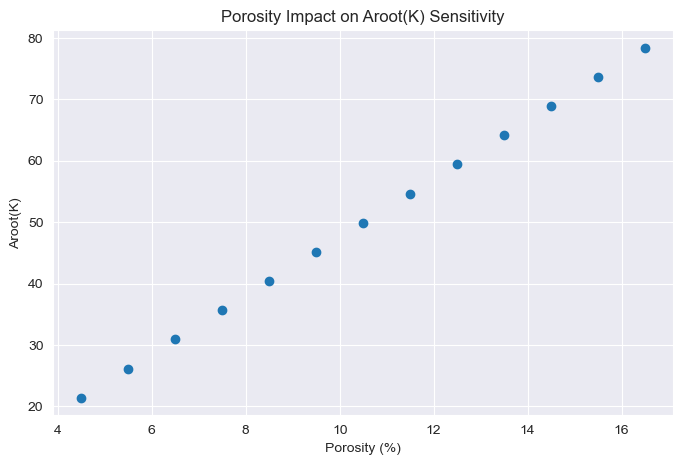

In [29]:
plt.figure(figsize = (8,5))

por = np.linspace(4.5, 16.5, 13)

plt.scatter(por, y_pred_sensitivity.iloc[0:13])
plt.title('Porosity Impact on Aroot(K) Sensitivity')
plt.xlabel('Porosity (%)')
plt.ylabel('Aroot(K)')

Text(0, 0.5, 'Aroot(K)')

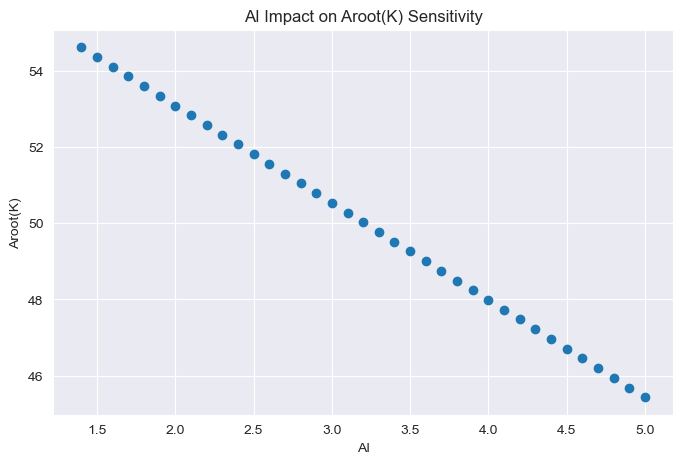

In [30]:
# Let’s also understand the independent and quantitative impacts of other
# three variables on Aroot(K) as follows:

plt.figure(figsize = (8,5))

AI = np.linspace(1.4, 5, 37)

plt.scatter(AI, y_pred_sensitivity.iloc[13:50])
plt.title('AI Impact on Aroot(K) Sensitivity')
plt.xlabel('AI')
plt.ylabel('Aroot(K)')

Text(0, 0.5, 'Aroot(K)')

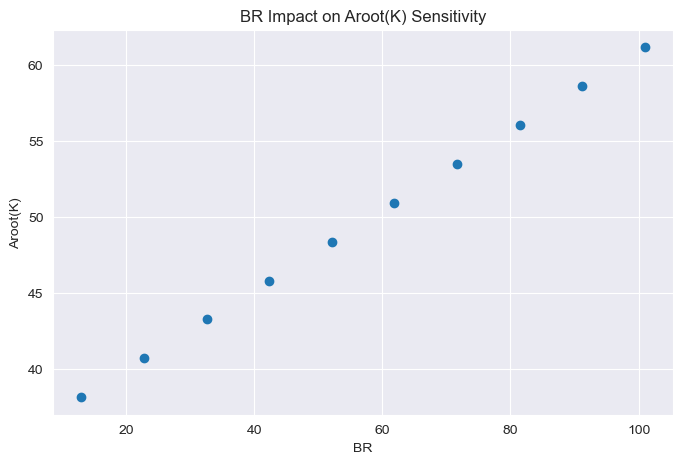

In [31]:
plt.figure(figsize = (8,5))

BR = np.linspace(13, 101, 10)
plt.scatter(BR, y_pred_sensitivity.iloc[50:60])
plt.title('BR Impact on Aroot(K) Sensitivity')
plt.xlabel('BR')
plt.ylabel('Aroot(K)')

Text(0, 0.5, 'Aroot(K)')

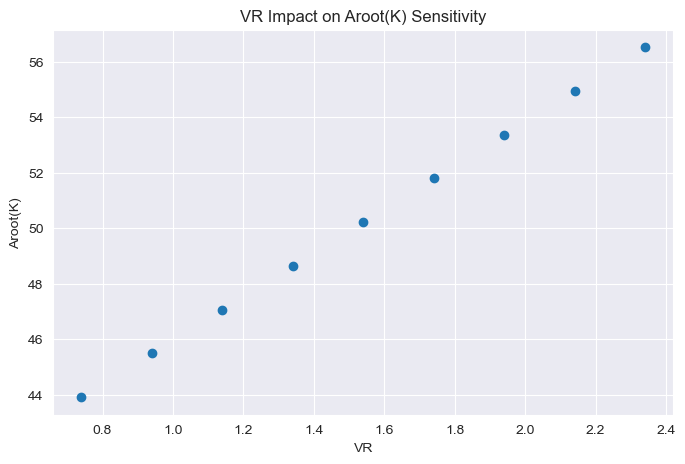

In [32]:
plt.figure(figsize = (8,5))

VR = np.linspace(0.74, 2.34, 9)

plt.scatter(VR, y_pred_sensitivity.iloc[60:69])
plt.title('VR Impact on Aroot(K) Sensitivity')
plt.xlabel('VR')
plt.ylabel('Aroot(K)')

# Metrics for Classification Model Evaluation

#### Accuracy
Classification accuracy is defined as follows:

$$
\text{Accuracy} = \frac{\text{Number of correct predictions}}{\text{Number of all predictions}}
$$

While accuracy gives a general idea of how well the model predicts the correct classes, it may not be the best metric when there is an **unbalanced class distribution** in the dataset. For example, if a dataset contains 1 million rows, with 100,000 rows in class 0 and 900,000 rows in class 1, this distribution is unbalanced. In such cases, a **confusion matrix** is recommended for a more comprehensive evaluation of the model's performance.

#### Confusion Matrix
A confusion matrix presents the correct and incorrect predictions for each class. For binary classification, the confusion matrix is a **2x2 matrix**, while for **N-class problems**, it becomes an **NxN matrix**.

Let’s define the terms in a **2x2 confusion matrix** (Classes A and B):
- **True Positive (TP)**: Number of correct predictions for class A.
- **False Negative (FN)**: Number of incorrect predictions where class A is misclassified.
- **False Positive (FP)**: Number of incorrect predictions where class B is misclassified.
- **True Negative (TN)**: Number of correct predictions for class B.

The goal is to **maximize** True Positive and True Negative while **minimizing** False Positive and False Negative. Figure 5.18 shows a confusion matrix for a binary classification problem.

#### Precision and Recall
Precision and recall are additional metrics used to evaluate classification models. They provide more insight than accuracy alone.

$$
\text{Precision} = \frac{\text{True Positive}}{\text{True Positive} + \text{False Positive}}
$$

$$
\text{Recall} = \frac{\text{True Positive}}{\text{True Positive} + \text{False Negative}}
$$

- **Precision**: Measures how accurate the model is when predicting positive classes. Out of all the predicted positives, how many are actually positive? Precision is crucial when the cost of **false positives** is high. For example, in spam email detection, a false positive means that a legitimate email is incorrectly marked as spam.
  
- **Recall**: Measures how many actual positive cases the model correctly identified. It is important when there is a high cost associated with **false negatives**. For instance, in fraud detection, missing a fraudulent transaction (false negative) could have severe consequences.

#### Trade-off Between Precision and Recall
- High cost of **false positives**: Maximize **precision**.
- High cost of **false negatives**: Maximize **recall**.

In the oil and gas industry, when the objective is to classify a potential **screen-out stage** in advance, the goal is to minimize false negatives, thereby maximizing **recall**. This ensures that every potential screen-out alert is properly investigated.

#### F1 Score
When dealing with imbalanced classes or when a balance between precision and recall is needed, the **F1 score** is used. The F1 score considers both false positives and false negatives. It is calculated as follows:

$$
\text{F1\ Score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}
$$

The F1 score is beneficial when you need to balance precision and recall, making it suitable for problems with uneven class distribution.


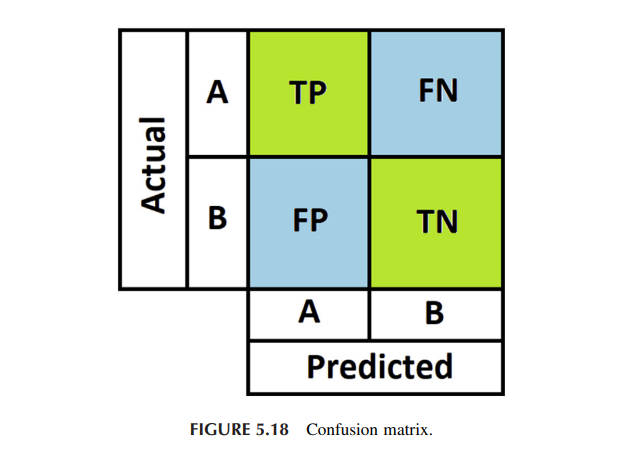

# Logistic regression using scikit-learn
* In this exercise, an HR data set which
consists of 10 input and 1 output features are used to determine whether an
employee will quit or not.

# Step 1 - Data Importation

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


df = pd.read_excel('Chapter5_HR_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Late show up percentage,1000.0,0.501025,0.187179,0.0,0.367040,0.495075,0.639074,1.0
Project initiative percentage,1000.0,0.483284,0.184640,0.0,0.359586,0.486289,0.622330,1.0
Percentage of project delivery on time,1000.0,0.427376,0.187881,0.0,0.286459,0.413932,0.552530,1.0
Percentage of emails exchanged,1000.0,0.400711,0.144444,0.0,0.295613,0.397399,0.496453,1.0
Percentage of responsiveness,1000.0,0.537204,0.182367,0.0,0.416221,0.539818,0.661523,1.0
Percentage of professional email response,1000.0,0.484969,0.182355,0.0,0.355052,0.483522,0.612790,1.0
Percentage of sharing ideas,1000.0,0.471185,0.179900,0.0,0.344950,0.458429,0.592071,1.0
Percentage of helping colleagues,1000.0,0.519861,0.194477,0.0,0.381461,0.515514,0.661990,1.0
Percentage of entrepreneurial posts on LinkedIn,1000.0,0.521589,0.193181,0.0,0.374331,0.526394,0.669513,1.0
Percentage of Facebook comments,1000.0,0.576462,0.162826,0.0,0.464761,0.586543,0.689762,1.0


# Step 2 - Data Visualization
* Let’s plot the distribution and violin plots as follows:

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

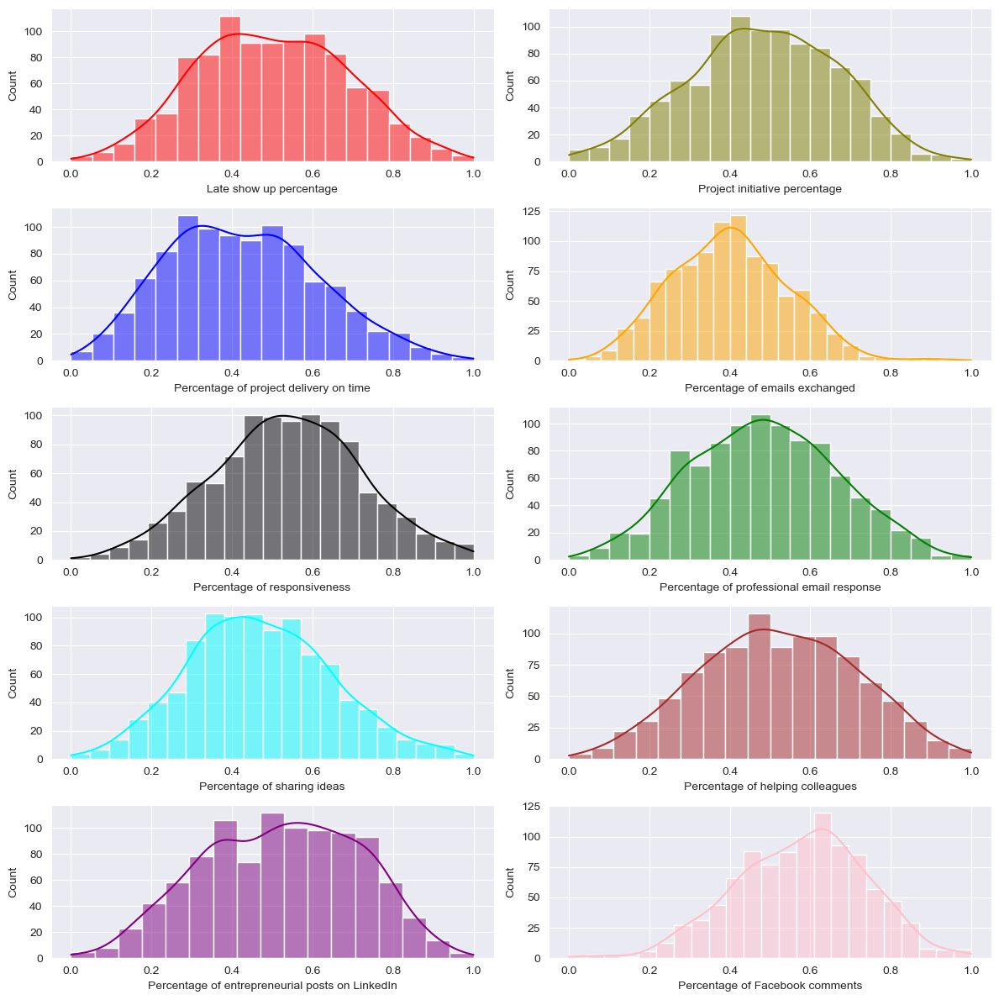

In [35]:
f, axes = plt.subplots(5, 2, figsize = (12, 12))

sns.histplot(df['Late show up percentage'], color = "red",
             ax = axes[0, 0], kde = True)

sns.histplot(df['Project initiative percentage'], color = "olive",
             ax = axes[0, 1], kde = True)

sns.histplot(df['Percentage of project delivery on time'], color = "blue",
             ax = axes[1, 0], kde = True)

sns.histplot(df['Percentage of emails exchanged'], color = "orange",
             ax = axes[1, 1], kde = True)

sns.histplot(df['Percentage of responsiveness'], color = "black",
             ax = axes[2, 0], kde = True)

sns.histplot(df['Percentage of professional email response'], color = "green",
             ax = axes[2, 1], kde = True)

sns.histplot(df['Percentage of sharing ideas'], color = "cyan",
             ax = axes[3, 0], kde = True)

sns.histplot(df['Percentage of helping colleagues'], color = "brown",
             ax = axes[3, 1], kde = True)

sns.histplot(df['Percentage of entrepreneurial posts on LinkedIn'],
             color = "purple", ax = axes[4, 0], kde = True)

sns.histplot(df['Percentage of Facebook comments'], color = "pink",
             ax = axes[4, 1], kde = True)

plt.tight_layout()

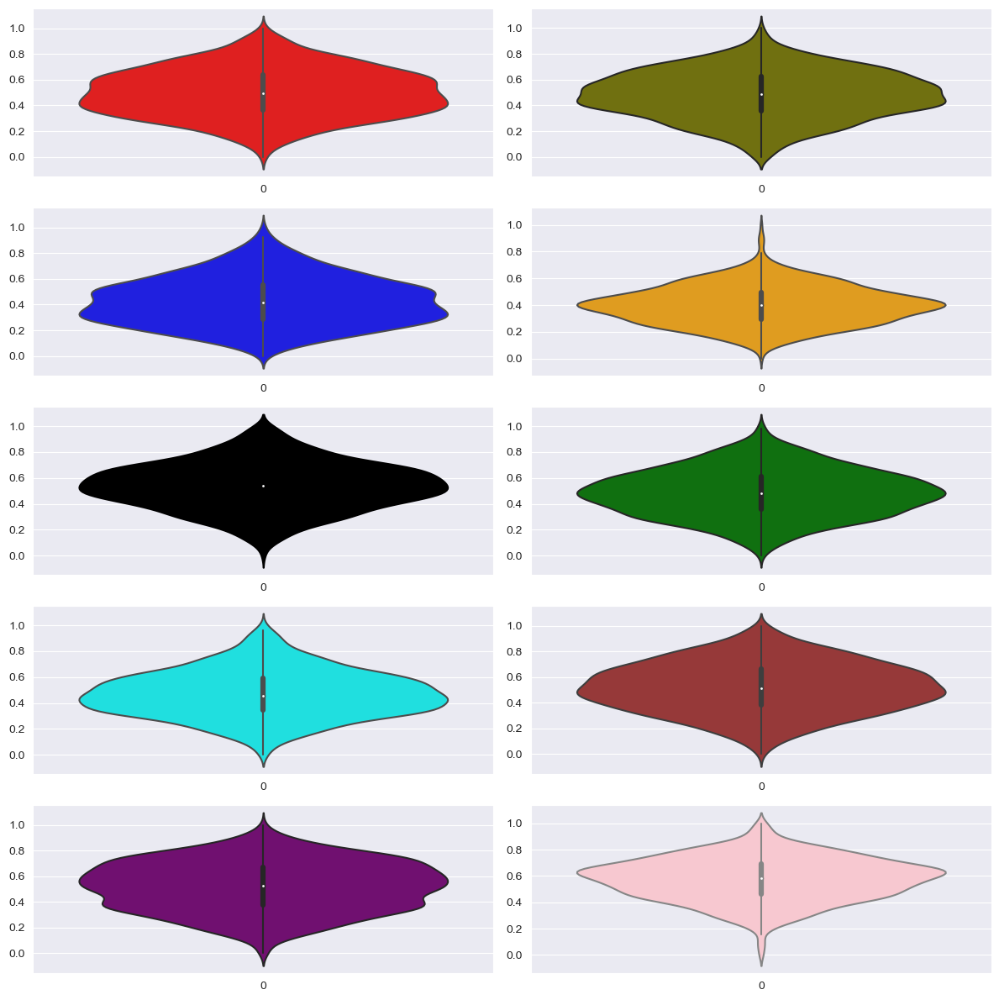

In [37]:
f, axes = plt.subplots(5, 2, figsize = (12, 12))

sns.violinplot(df['Late show up percentage'], color = "red", ax = axes[0, 0])

sns.violinplot(df['Project initiative percentage'], color = "olive",
               ax = axes[0, 1])

sns.violinplot(df['Percentage of project delivery on time'], color = "blue",
               ax = axes[1, 0])

sns.violinplot(df['Percentage of emails exchanged'], color = "orange",
               ax = axes[1, 1])

sns.violinplot(df['Percentage of responsiveness'], color = "black",
               ax = axes[2, 0])

sns.violinplot(df['Percentage of professional email response'], color = "green",
               ax = axes[2, 1])

sns.violinplot(df['Percentage of sharing ideas'], color = "cyan",
               ax = axes[3, 0])

sns.violinplot(df['Percentage of helping colleagues'], color = "brown",
               ax = axes[3, 1])

sns.violinplot(df['Percentage of entrepreneurial posts on LinkedIn'],
               color = "purple", ax = axes[4, 0])

sns.violinplot(df['Percentage of Facebook comments'], color = "pink",
               ax = axes[4, 1])

plt.tight_layout()

# Continuation
* As shown in distribution plots, all the input features appear to have normal
distributions and do not show any outliers.

* Next, let’s plot the Pearson correlation coefficient heat map as follows.

* There appears to be no collinear input
features in this data set. For this exercise, all the 10 features shown below will
be used in the model.

* However, when discussing some other algorithms such
as **random forest, extra trees, gradient boosting, etc.**, `feature ranking` can be
used to remove unimportant features that have a negligible impact on a
model’s output.

<Axes: >

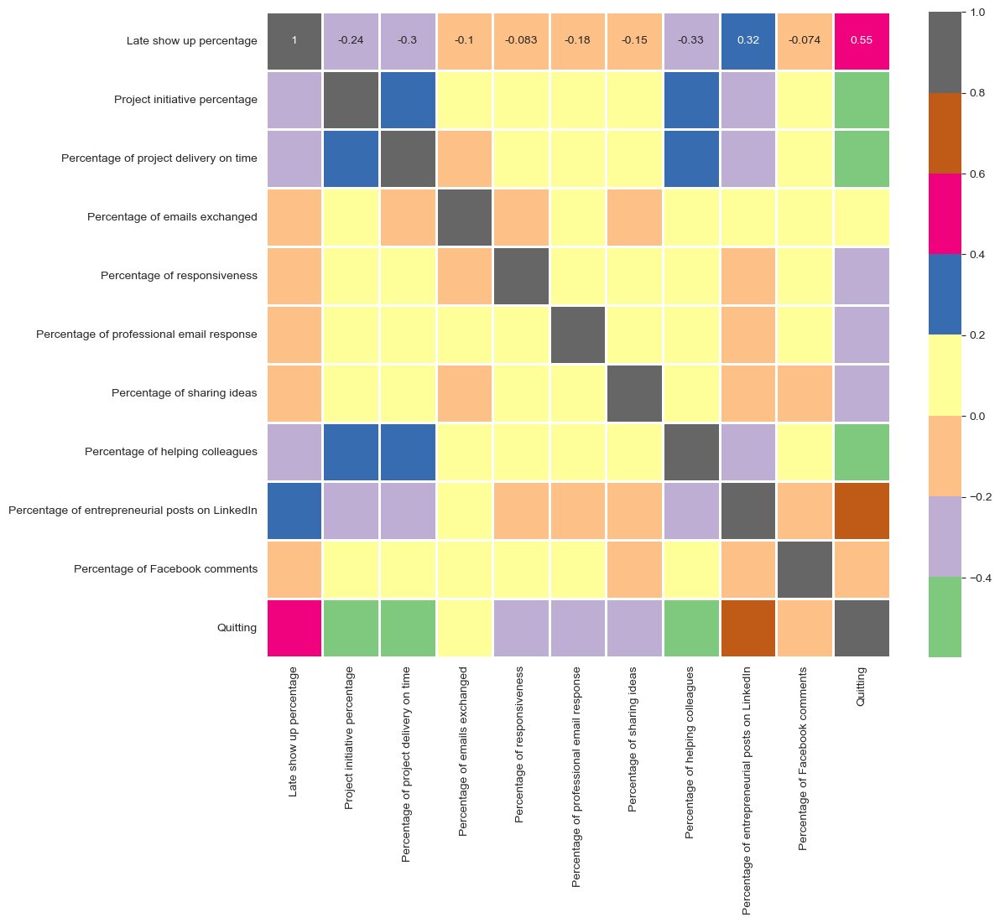

In [38]:
plt.figure(figsize = (12,10))

sns.heatmap(df.corr(), annot = True, linecolor = 'white',
            linewidths = 2, cmap = 'Accent')

Please note that various "cmap" or color maps can be chosen as shown in below:
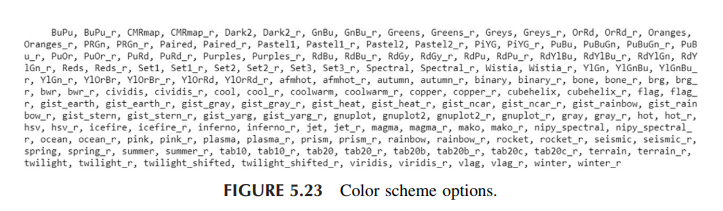

# Step 3 - Training
* Now, let’s define x and y variables.

* As indicated, all parameters are already
`between a scale of 0 and 1` and therefore, **no normalization is necessary**.

* As
shown below, all the features except the `"Quitting"` column are used as features and the "Quitting" column is used as the output feature.

In [39]:
x_features = df.drop('Quitting', axis = 1)

y = df['Quitting']

# Continuation
* Next, import `"train_test_split"`, define a `seed number of 50`, and use a `70/
30` split randomly (70% is used for training and 30% will be used for testing
randomly).

In [40]:
from sklearn.model_selection import train_test_split

seed = 50

np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(x_features, y,
                                                    test_size = 0.30)

# Continuation
### Logistic Regression and Regularization Summary

To implement **logistic regression** in scikit-learn, we can import the necessary library and call it `"lr"`. Some hyperparameters that can be optimized include:

- **Solver options**: These determine the algorithm used for optimization:
  - `"newton-cg"`: Utilizes a Hessian matrix (second-order partial derivatives).
  - `"lbfgs"`: A memory-efficient iterative solver for large datasets.
  - `"liblinear"`: A coordinate descent algorithm, useful for high-dimensional data.
  - `"sag"` and `"saga"`: Stochastic average gradient methods, with `"saga"` supporting L1 regularization.

### Regularization to Avoid Overfitting
Regularization helps prevent overfitting, which occurs when a model performs well on training data but poorly on test data. Regularization is introduced by adding a penalty to the **loss function**, defined as the sum of squared differences between actual and predicted values:

$$
\sum_{i=1}^{n} (y_i - \hat{y}_i)^2
$$

### Adding a Regularization Term
A regularization term is added to the loss function to control model complexity. The parameter $\lambda$ controls the regularization strength, with larger values potentially leading to underfitting and smaller values possibly leading to overfitting:

$$
\sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{i=1}^{n} q_i^2
$$

Where $q_i$ represents the feature weights.

### L1 and L2 Regularization
- **L1 Regularization (Lasso)**: Penalizes the absolute value of feature weights. It produces sparse solutions, which may be useful for simple models:

$$
\sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{i=1}^{n} |q_i|
$$

- **L2 Regularization (Ridge)**: Penalizes the sum of squared feature weights. It is better suited for complex models:

$$
\sum_{i=1}^{n} (y_i - \hat{y}_i)^2 + \lambda \sum_{i=1}^{n} q_i^2
$$

### Relationship between $\lambda$ and $C$
The parameter $C$ is the inverse of $\lambda$, and is commonly used in models like Support Vector Machines (SVM):

$$
C = \frac{1}{\lambda}
$$

By adjusting the regularization strength with $\lambda$ (or $C$), we can fine-tune the model’s complexity and performance.


In [41]:
from sklearn.linear_model import LogisticRegression

np.random.seed(seed)

lr = LogisticRegression(penalty = 'l2', C = 1.0, solver = 'lbfgs')

# Continuation
* Let’s apply the lr model to fit (X_train,y_train) as follows:

In [42]:
lr.fit(X_train, y_train)

LogisticRegression()

# Continuation
* Next, let’s apply the `"lr"` trained model to predict the `"X_test"` and call
the resultant array as the `"y_pred"` as shown below:

In [43]:
y_pred = lr.predict(X_test)

# Continuation
* To generate the confusion matrix and classification metrics discussed
earlier, import `"classification_report"` and `"confusion_matrix"` from
`"sklearn.metrics"` and print the resultant confusion matrix of **y_test (actual
testing output values)** and **y_pred (predicted testing output values)**.

* In addition,
generate a heat map of the resulting confusion matrix:

[[143   9]
 [  4 144]]


<Axes: >

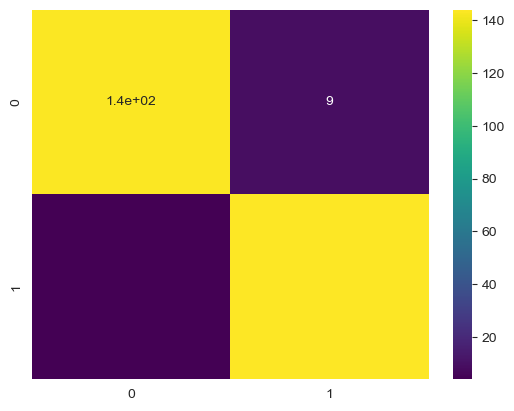

In [44]:
from sklearn.metrics import classification_report,confusion_matrix

print(confusion_matrix(y_test, y_pred))

sns.heatmap(confusion_matrix(y_test,y_pred), annot = True,
            cmap = 'viridis')

# Finally
Next, let’s also get the classification report as follows:

```Python
print(classification_report(y_test,y_pred))

In [45]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.94      0.96       152
           1       0.94      0.97      0.96       148

    accuracy                           0.96       300
   macro avg       0.96      0.96      0.96       300
weighted avg       0.96      0.96      0.96       300



# Conclusion
* The overall `accuracy of the model is 96%`.

* In addition, the precision and
recall percentage for each class are high and range from `94% to 97%` with a
balanced class instances in each group.

* `It is possible to improve the accuracy`
of this model `by changing some of the fine-tuning parameters` discussed either
manually or using a grid search optimization (recommended approach) which
will be discussed in chapter 7.

# K-Nearest Neighbors (KNN)

**K-Nearest Neighbors (KNN)** is a simple supervised machine learning algorithm used for both classification and regression tasks. It is nonparametric, meaning it makes no assumptions about the underlying data distribution. The algorithm classifies new data points based on proximity to existing points by calculating distances between them. Below are the steps to implement a KNN model:

1. **Determine the number of neighbors (K)**:
   - If $( K = 2 )$, the 2 closest points (neighbors) based on distance calculations will determine the classification of a new point.
   - A small $( K )$ results in high sensitivity, while a large $( K )$ produces smoother decision boundaries but increases bias. Cross-validation helps in selecting the optimal $\( K \)$.

2. **Calculate the distance** between each instance and all training samples using a distance metric such as Euclidean distance.

3. **Rank the distances** from lowest to highest.

4. **Select the nearest neighbors**: Choose the $( K )$ neighbors with the lowest distances.

5. **Predict the class or value** based on the average (for regression) or majority vote (for classification) of the nearest neighbors.

#### Example of KNN for Classification
We have a dataset with oil price and natural gas prices, where the task is to classify new data points based on proximity using Euclidean distance. The formula for Euclidean distance between two points $\( (x_1, y_1) \)$ and $\( (x_2, y_2) \)$ is:

$$
\text{Euclidean distance} = \sqrt{(x_2 - x_1)^2 + (y_2 - y_1)^2}
$$

#### Example Calculation:

For a new point $\( (20, 2.2) \)$, the Euclidean distance between $\( (90, 4) \)$ and $\( (20, 2.2) \)$ is:

$$
\text{Distance} = \sqrt{(90 - 20)^2 + (4 - 2.2)^2} = 70.02
$$


# KNN implementation using scikit-learn
# Step 1 - Data Import

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

df = pd.read_excel('Chapter5_HR_DataSet.xlsx')

# Step 2 - Data Standardization
* Since various visualization plots were illustrated when logistic regression
was covered for the same database, let’s proceed to standardizing the data.

* As
previously discussed, KNN uses a distance-based calculation when determining the nearest neighbor(s); therefore, it is recommended to standardize the
data prior to applying KNN.

* In addition, define x_standardized features as
input variables into the model by dropping the last column of the data set.

* y is
simply the last column and the output of the model.

In [47]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(df.drop('Quitting', axis = 1))

y = df['Quitting']

x_standardized_features = scaler.transform(df.drop('Quitting', axis = 1))

x_standardized_features = pd.DataFrame(x_standardized_features,
                                       columns = df.columns[:-1])

x_standardized_features.head()

,Late show up percentage,Project initiative percentage,Percentage of project delivery on time,Percentage of emails exchanged,Percentage of responsiveness,Percentage of professional email response,Percentage of sharing ideas,Percentage of helping colleagues,Percentage of entrepreneurial posts on LinkedIn,Percentage of Facebook comments
0,-0.123542,0.185907,-0.913431,0.319629,-1.033637,-2.308375,-0.798951,-1.482368,-0.949719,-0.643314
1,-1.084836,-0.430348,-1.025313,0.625388,-0.444847,-1.152706,-1.129797,-0.202240,-1.828051,0.636759
2,-0.788702,0.339318,0.301511,0.755873,2.031693,-0.870156,2.599818,0.285707,-0.682494,-0.377850
3,0.982841,1.060193,-0.621399,0.625299,0.452820,-0.267220,1.750208,1.066491,1.241325,-1.026987
4,1.139275,-0.640392,-0.709819,-0.057175,0.822886,-0.936773,0.596782,-1.472352,1.040772,0.276510


# Step 3 - Training the model
* Next, import the model selection library and use the train_test_split to
divide the data into a 70/30 split.

* Make sure to pass in "x_standardized_features" and "y" as shown below.

* Since 70% of the data will be used as training, 700 rows will be randomly selected as the training data and the
remaining 300 rows will be selected for testing the model.

In [48]:
from sklearn.model_selection import train_test_split
seed = 1000
np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x_standardized_features, y,
                                                  test_size = 0.30)

# Continuation
* Next, let’s import `"KNeighborsClassifier"` from `"sklearn.neighbors"` and
define the KNN parameters to have one neighbor and to use the euclidean distance calculation.

* Afterward, apply the defined `"KNN"` model to
`"(X_train, y_train)"` for training the model.

In [49]:
from sklearn.neighbors import KNeighborsClassifier

np.random.seed(seed)

KNN = KNeighborsClassifier(n_neighbors = 1, metric = 'euclidean')

KNN.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=1)

# Continuation
* Before applying the model, let’s create a for loop to test various number
of neighbors from 1 to 50 and evaluate the outcome on the model’s testing
accuracy.

* First, import the metrics so accuracy can be obtained at the end of
the loop.

* Next, create an empty list called `"Score."`

* Afterward, write a for
loop for K in range of 1 through 50 (including 50), fit `"(X_train,y_train)"`,
predict `"X_test"` (30% testing data set), place the predicted values under
`"y_pred"`, append the accuracy score between `"y_test"` (actual output
values) and `"y_pred"` (predicted output values) to `"Scores"` which is the
empty list that was created initially.

In [50]:
from sklearn import metrics

Scores = []

for k in range(1, 51):
    KNN = KNeighborsClassifier(n_neighbors = k, metric = 'euclidean')
    KNN.fit(X_train, y_train)
    y_pred = KNN.predict(X_test)
    Scores.append(metrics.accuracy_score(y_test, y_pred))

Since the testing score values have been appended to `"Score"`, it is
important to visualize the resulting accuracy score at different trialed Ks as
follows:

Text(0.5, 1.0, 'K Determination Using KNN')

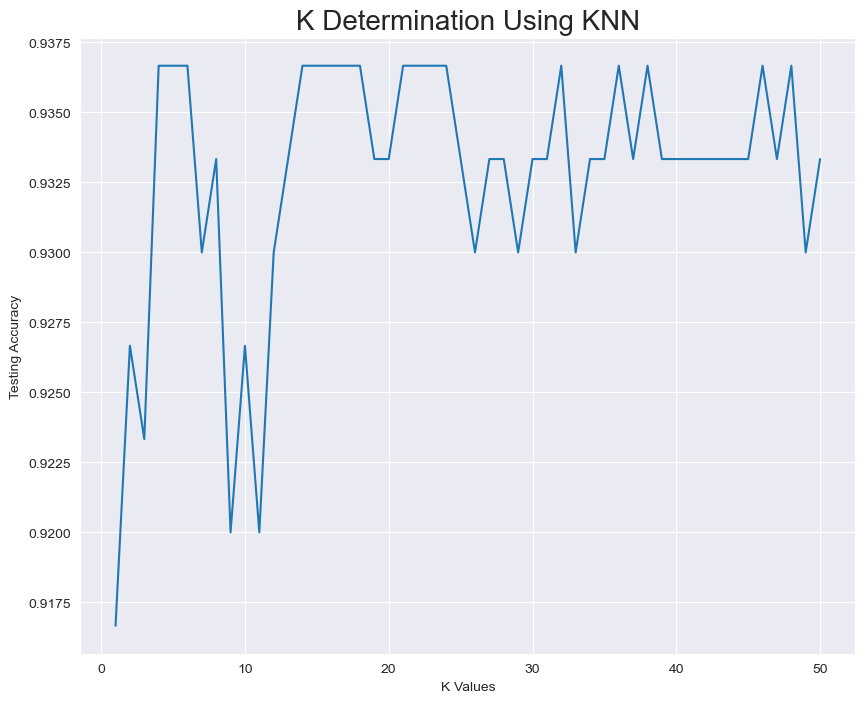

In [51]:
plt.figure(figsize = (10,8))

plt.plot(range(1, 51), Scores)

plt.xlabel('K Values')
plt.ylabel('Testing Accuracy')
plt.title('K Determination Using KNN', fontsize = 20)

# Continuation
* As illustrated, when K is equal to 5, testing accuracy appears to be one of
the highest.

* Other peaks are also observed at higher K values but `5 would be
the first pick` in this data set.

* Therefore, let’s apply the KNN model using 5
neighbors this time and proceed with obtaining the confusion matrix and
classification report.

In [52]:
from sklearn.metrics import classification_report, confusion_matrix

np.random.seed(seed)

KNN = KNeighborsClassifier(n_neighbors = 5, metric = 'euclidean')

KNN.fit(X_train,y_train)
y_pred = KNN.predict(X_test)
print('\n')
print(confusion_matrix(y_test,y_pred))
print('\n')
print(classification_report(y_test,y_pred))



[[142   9]
 [ 10 139]]


              precision    recall  f1-score   support

           0       0.93      0.94      0.94       151
           1       0.94      0.93      0.94       149

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300



# Support Vector Machine (SVM)

SVM is a supervised ML algorithm used for classification and regression problems. Unlike most algorithms, which aim to minimize a cost function, the goal in SVM is to **maximize the margin** between support vectors through a **separating hyperplane**.

The hyperplane is drawn to maximize the margin from both sides. The closest data points to this hyperplane are called **support vectors**. The distance between the support vectors and the hyperplane is referred to as the "margin," and the objective is to maximize it.

In an n-dimensional space, the hyperplane will have n-1 dimensions. For instance, in a 2D space, the hyperplane is a line, and in a 3D space, it is a plane. The figure below shows a binary classification example where the data are linearly separable. However, in most real-world problems, data are not linearly separable, which leads to two important concepts: 

#### 1) Soft Margin:
Soft margin allows for some misclassification of data while finding the separating line. This is controlled by the parameter $C$:
- **Larger $C$**: Smaller margin, higher training accuracy, lower testing accuracy (overfitting).
- **Smaller $C$**: Larger margin, lower training accuracy, higher testing accuracy (more general).

#### 2) Kernel Tricks:
When data are not linearly separable, kernel tricks apply transformations to the data to create new features. Common kernel functions include:

- **Polynomial Kernel (poly kernel)**: Generates new features based on the following equation:
  $$K(X_1, X_2) = (a + X_1^T X_2)^b$$
  where $X_1$ and $X_2$ are vectors, $a \geq 0$ is a constant, and $b$ is the degree of the polynomial.

- **Radial Basis Function (rbf)**: Uses distance measurements to create new features. The Gaussian rbf kernel is defined as:
  $$K(X_1, X_2) = \exp\left(-\gamma ||X_1 - X_2||^2\right)$$
  where $||X_1 - X_2||$ is the Euclidean distance between the vectors and $\gamma$ controls the influence of new features on the decision boundary.

Low $\gamma$ values lead to smoother decision boundaries and potential underfitting, while high $\gamma$ values create wiggly boundaries, increasing the risk of overfitting.
he risk of overfitting.


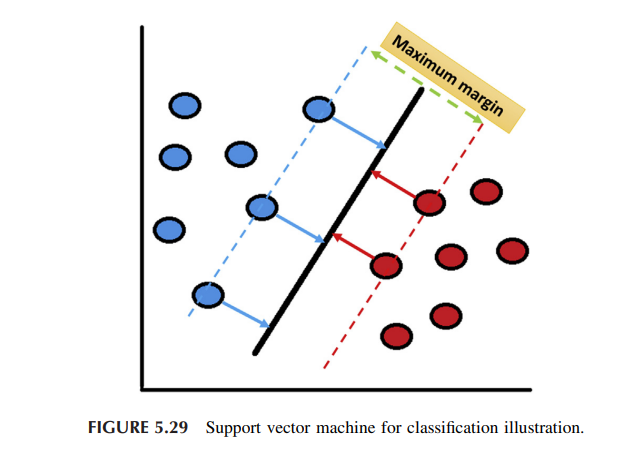

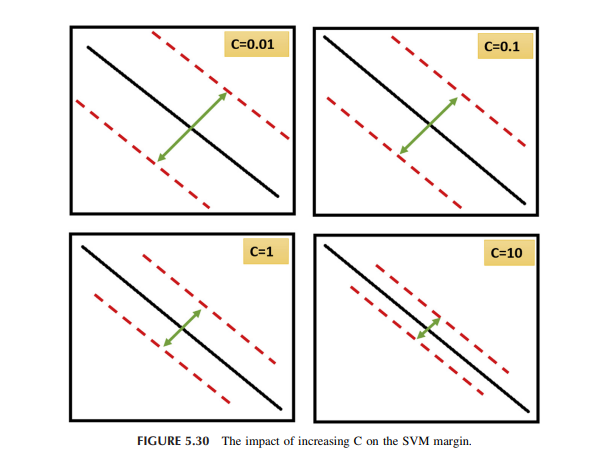

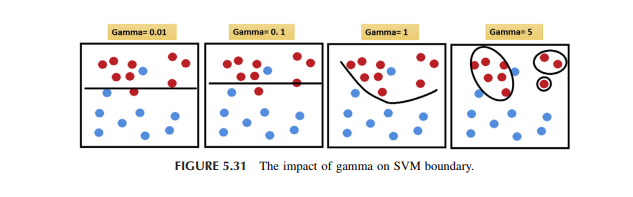

# Support Vector Machine Implementation in scikit-learn

In this section, we will build a step-by-step ML model for SVM implementation in Python. One key application is predicting geomechanical properties of rocks, which are critical in hydraulic fracturing design. Properties such as **Poisson’s ratio**, **Young’s modulus**, and **minimum horizontal stress** help determine fracture geometry and the ease of fracturing.

Brittle rocks with high Young’s modulus and low Poisson’s ratio are easier to fracture, while ductile rocks are more difficult to fracture hydraulically. These properties are typically obtained using **sonic logs**. However, running sonic logs on every well can be prohibitively expensive. To address this, we can use existing sonic logs to train a machine learning model to predict **shear wave travel time (Dts)** and **compression wave travel time (Dtc)**.

The goal of this exercise is to train an ML model using **SVM** to predict shear and compression wave travel times. After training the model, a triple combo log with basic properties such as **gamma ray**, **bulk density**, **resistivity**, **total or neutron porosity**, and **depth** can be used in areas where there is no access to sonic logs to predict these wave travel times.

By doing this, the trained ML model can estimate shear and compression wave travel times, helping to calculate geomechanical properties, without the need for costly new sonic logs.


# Step 1 - Data Importationcribe()

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

df = pd.read_excel('Chapter5_Geomechanical_Properties_Prediction_DataSet.xlsx')
df.describe()

,Depth,Resistivity,Gamma Ray,Total Porosity,Effective Porosity,Bulk Density,Compression Wave Travel Time,Shear Wave Travel Time
count,1904.000000,1904.000000,1904.000000,1904.000000,1904.000000,1904.000000,1904.000000,1904.000000
mean,7280.750000,146.141582,116.270437,0.059863,0.038633,2.652268,73.176217,123.929532
std,274.890887,322.464089,61.220418,0.023739,0.023542,0.072419,10.732976,19.252592
min,6805.000000,17.413170,24.463470,0.002870,0.002120,2.428950,50.805650,85.474240
25%,7042.875000,62.688825,84.264097,0.042928,0.019688,2.601138,64.791450,114.705535
50%,7280.750000,85.495010,117.570395,0.055185,0.037425,2.658085,72.718335,127.687235
75%,7518.625000,121.405745,130.947012,0.074783,0.054220,2.707355,80.846762,137.370110
max,7756.500000,7223.240720,623.150210,0.142080,0.119320,2.849760,101.455720,184.778790


# Step 2 - Data Visualization

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

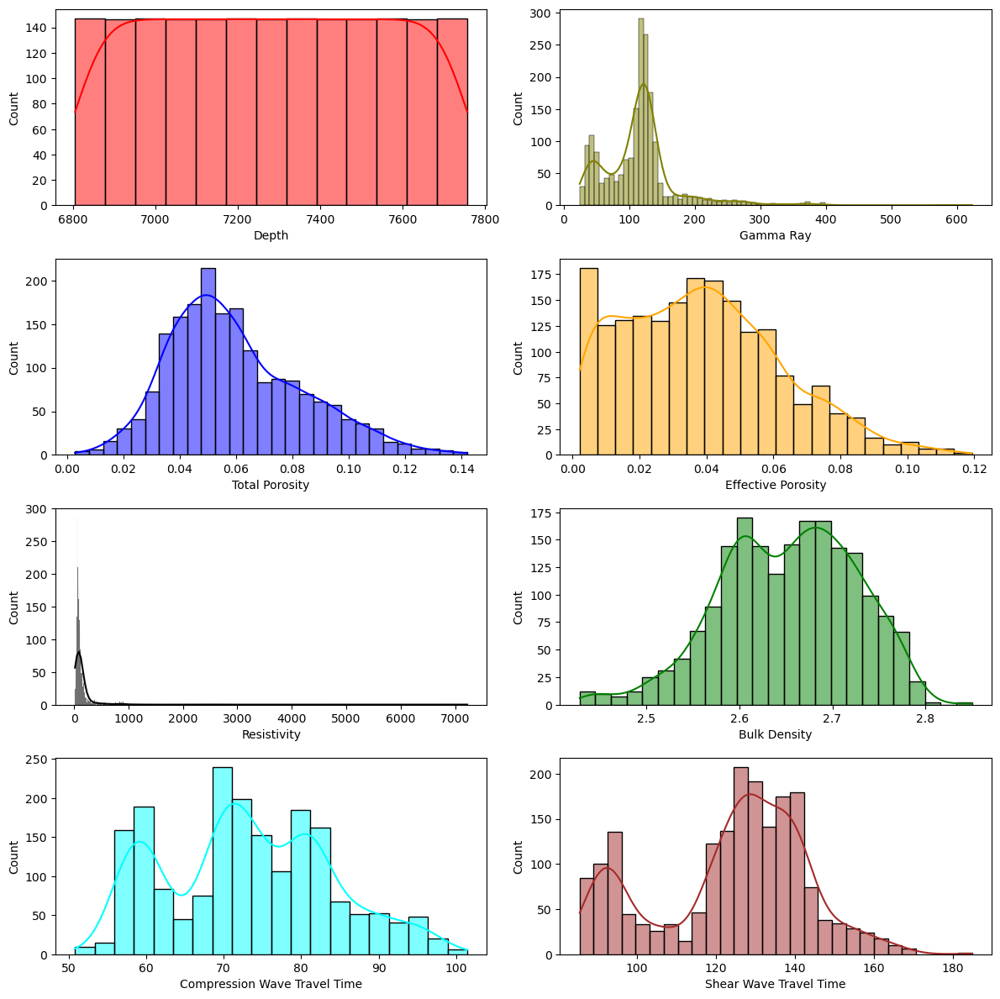

In [3]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Depth'], color = "red", ax = axes[0, 0], kde = True)
sns.histplot(df['Gamma Ray'], color = "olive", ax = axes[0, 1], kde = True)
sns.histplot(df['Total Porosity'], color = "blue", ax = axes[1, 0], kde = True)
sns.histplot(df['Effective Porosity'], color = "orange", ax = axes[1, 1], kde = True)
sns.histplot(df['Resistivity'], color = "black", ax = axes[2, 0], kde = True)
sns.histplot(df['Bulk Density'], color = "green", ax = axes[2, 1], kde = True)
sns.histplot(df['Compression Wave Travel Time'], color = "cyan", ax = axes[3, 0], kde = True)
sns.histplot(df['Shear Wave Travel Time'], color = "brown", ax = axes[3, 1], kde = True)

plt.tight_layout()

* A quick look at the distribution plots reveals that resistivity and gamma ray
curves have log normal distributions as opposed to normal distributions.

* Let’s
also visualize the box plots of each feature to find the anomalous points as
follows:

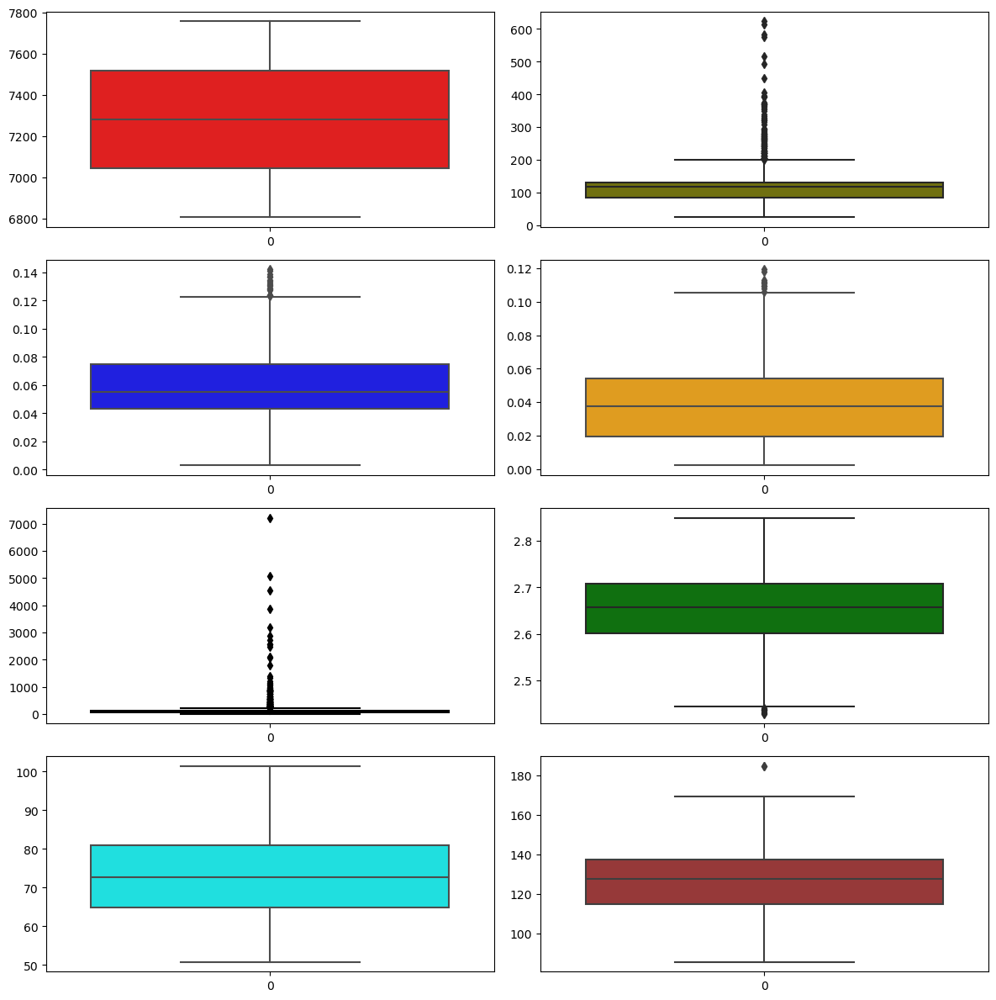

In [4]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.boxplot(df['Depth'], color = "red", ax = axes[0, 0])
sns.boxplot(df['Gamma Ray'], color = "olive", ax = axes[0, 1])
sns.boxplot(df['Total Porosity'], color = "blue", ax = axes[1, 0])
sns.boxplot(df['Effective Porosity'], color = "orange", ax = axes[1, 1])
sns.boxplot(df['Resistivity'], color = "black", ax = axes[2, 0])
sns.boxplot(df['Bulk Density'], color = "green", ax = axes[2, 1])
sns.boxplot(df['Compression Wave Travel Time'], color = "cyan", ax = axes[3, 0])
sns.boxplot(df['Shear Wave Travel Time'], color = "brown", ax = axes[3, 1])

plt.tight_layout()

* For this exercise, let’s include resistivity values greater than 0 and less than
1000 U-m and gamma ray greater than 0 and less than 400 gAPI as follows:

In [5]:
df = df[(df['Resistivity'] > 0) & (df['Resistivity'] < 1000)]

df = df[(df['Gamma Ray'] > 0) & (df['Gamma Ray'] < 400)]

This code is filtering rows from a DataFrame (`df`) based on two conditions applied to two columns: **Resistivity** and **Gamma Ray**.

### Let's break it down step by step:

#### 1. **Filtering Based on Resistivity Values**
```python
df = df[(df['Resistivity'] > 0) & (df['Resistivity'] < 1000)]
```
- **df['Resistivity'] > 0**: This checks if the values in the "Resistivity" column are greater than 0. This will return `True` for rows where this condition is met, and `False` otherwise.
  
- **df['Resistivity'] < 1000**: Similarly, this checks if the values in the "Resistivity" column are less than 1000.

- **&**: This operator ensures that both conditions must be `True` for a row to be selected. So, only rows where the "Resistivity" value is greater than 0 **and** less than 1000 are kept.

#### 2. **Updating the DataFrame**
The result is assigned back to `df`, meaning it updates the DataFrame to keep only the rows that satisfy these resistivity conditions.

#### 3. **Filtering Based on Gamma Ray Values**
```python
df = df[(df['Gamma Ray'] > 0) & (df['Gamma Ray'] < 400)]
```
- **df['Gamma Ray'] > 0**: This checks if the values in the "Gamma Ray" column are greater than 0.

- **df['Gamma Ray'] < 400**: This checks if the values in the "Gamma Ray" column are less than 400.

- Again, the **&** ensures that both conditions are met. So only rows where "Gamma Ray" is greater than 0 **and** less than 400 are selected.

#### 4. **Final DataFrame Update**
The filtered DataFrame is again assigned back to `df`, meaning it now contains only the rows that meet both the "Resistivity" and "Gamma Ray" conditions.

### Why Two Filters?

- First, the DataFrame `df` is filtered by **Resistivity**, removing rows that don't meet the specified criteria.
- Then, the DataFrame is filtered again by **Gamma Ray**, further removing rows based on these values.

In short, both filters are applied sequentially to progressively reduce the DataFrame to rows that meet **both the resistivity and gamma ray** conditions.

### Example

- Let's say the original DataFrame had these columns:

| Resistivity | Gamma Ray |
|-------------|-----------|
| 50          | 100       |
| 1200        | 150       |
| 500         | 450       |
| 300         | 50        |

After filtering:
1. The first line keeps only rows where resistivity is between 0 and 1000. So, it removes the second row.
   
| Resistivity | Gamma Ray |
|-------------|-----------|
| 50          | 100       |
| 500         | 450       |
| 300         | 50        |

2. The second line keeps only rows where gamma ray is between 0 and 400. So, it removes the third row.

Final result:
| Resistivity | Gamma Ray |
|-------------|-----------|
| 50          | 100       |
| 300         | 50        |



* Next, plot a heat map of the Pearson correlation coefficient as follows:

<Axes: >

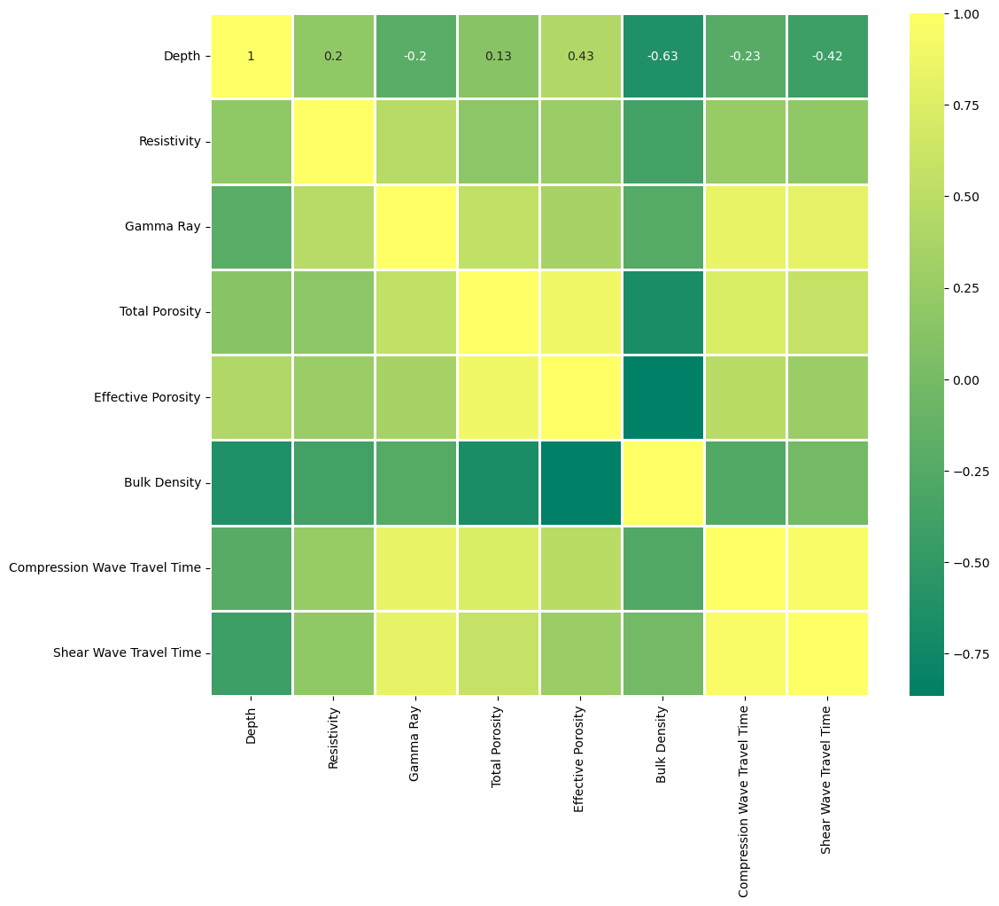

In [6]:
plt.figure(figsize = (12,10))

sns.heatmap(df.corr(), annot = True, linecolor = 'white',
            linewidths = 2, cmap = 'summer')

* As illustrated, Pearson correlation coefficient between effective porosity
and total porosity is 0.9

*  Since these parameters provide the same info, let’s
drop effective porosity simply because the relationship between total porosity
and output features is stronger (higher Pearson correlation coefficients) than
the relationship between effective porosity and output features.

In [10]:
df.drop(['Effective Porosity'],axis = 1, inplace = True)

# Step 3 - Data Scaling/Normalisation
* Next, use the MinMax scaler to scale all features between 0 and 1 as
follows:

In [11]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler(feature_range = (0,1))

scaler.fit(df)

df_scaled = scaler.transform(df)

# Continuation
* Since df_scaled is in an `array format` now, let’s convert to a data frame
followed by defining x_scaled and y_scaled features.

* Please note that `the
output features` are two features of `compression and shear wave travel times`,
and that’s why both parameters were included under `"y_scaled."`

In [12]:
df_scaled

array([[0.00000000e+00, 4.13468578e-02, 2.31242246e-01, ...,
        8.00384972e-01, 3.14509541e-01, 3.88477970e-01],
       [5.26592944e-04, 4.27769467e-02, 2.37876216e-01, ...,
        8.00004753e-01, 3.15918043e-01, 3.86012121e-01],
       [1.05318589e-03, 4.91360168e-02, 2.42027209e-01, ...,
        7.76003422e-01, 3.16072266e-01, 3.81965378e-01],
       ...,
       [9.97893628e-01, 6.28517417e-01, 1.56516175e-01, ...,
        5.65457095e-01, 5.96641998e-02, 8.92956063e-02],
       [9.99473407e-01, 5.76630913e-01, 1.19221384e-01, ...,
        6.15741071e-01, 1.51118218e-03, 6.17068402e-02],
       [1.00000000e+00, 6.61815636e-01, 7.63945442e-02, ...,
        6.44067394e-01, 0.00000000e+00, 4.65803430e-02]])

In [13]:
df_scaled = pd.DataFrame(df_scaled, columns = ['Depth', 'Resistivity',
                       'Gamma Ray', 'Total Porosity', 'Bulk Density',
                       'Compression Wave Travel Time', 'Shear Wave Travel Time'])

y_scaled = df_scaled[['Compression Wave Travel Time', 'Shear Wave Travel Time']]

x_scaled = df_scaled.drop(['Compression Wave Travel Time',
                           'Shear Wave Travel Time'], axis=1)

# Step 4 - Training the Data
* Next let’s import train_test_split and use a 70/30 split to divide the data as
follows (make sure to use the same seed number):

In [14]:
from sklearn.model_selection import train_test_split

seed = 1000
np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x_scaled, y_scaled,
                                                    test_size = 0.30)

# Continuation
* Next, let’s import SVR (support vector regression) `"from sklearn.svm"`.

* In
addition, since this is a multi-output model, let’s import `"MultiOutputRegressor"` from `"sklearn.multioutput"` as follows:

In [16]:
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor

np.random.seed(seed)

SVM = MultiOutputRegressor((SVR(kernel = 'rbf', gamma = 1, C = 1)))

# Continuation
* As illustrated, the gamma and C values were assigned as 1 and rbf is used in
this model.

* These parameters are by no means the optimum hyperparameters and
grid search is highly recommended to optimize this model.
    
* Next, fit the `"SVM"`
to `"(X_train,y_train)"` and predict `"(X_train)"` and `"(X_test)"` as follows:

In [17]:
SVM.fit(X_train, y_train)

y_pred_train = SVM.predict(X_train)

y_pred_test = SVM.predict(X_test)

In [18]:
corr_train1 = np.corrcoef(y_train['Compression Wave Travel Time'], 
                          y_pred_train[:,0]) [0,1]

corr_train2 = np.corrcoef(y_train['Shear Wave Travel Time'],
                          y_pred_train[:,1]) [0,1]

print('Compression Wave Travel Time Train Data r^2 = ',
      round(corr_train1**2, 4), 'r = ', round(corr_train1, 4))

print('Shear Wave Travel Time Train Data r^2 = ',
      round(corr_train2**2, 4),'r = ', round(corr_train2,4))

Compression Wave Travel Time Train Data r^2 =  0.9257 r =  0.9621
Shear Wave Travel Time Train Data r^2 =  0.9182 r =  0.9582


This code calculates the **coefficient of determination** ($R^2$) and the **correlation coefficient** ($r$) for both the **Compression Wave Travel Time** and the **Shear Wave Travel Time** in the training set. These metrics are used to evaluate the performance of the model on the training data, specifically how well the predicted values match the actual values.

### Let's break it down:

#### 1. **Understanding Correlation and $R^2$**
- The **correlation coefficient** ($r$) measures the strength and direction of the linear relationship between two variables. It ranges from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 means no linear correlation.
  
- The **coefficient of determination** ($R^2$) represents the proportion of the variance in the dependent variable that is predictable from the independent variables. It is simply $r^2$ (the square of the correlation coefficient).

### Step-by-Step Breakdown of the Code

#### 2. **Calculating the Correlation for Compression Wave Travel Time**
```python
corr_train1 = np.corrcoef(y_train['Compression Wave Travel Time'], 
                          y_pred_train[:, 0])[0, 1]
```
- **np.corrcoef**: This function computes the correlation matrix, which contains the pairwise correlation coefficients of the variables you pass.
  - **y_train['Compression Wave Travel Time']**: The actual values from the training set for the **Compression Wave Travel Time**.
  - **y_pred_train[:, 0]**: The predicted values for **Compression Wave Travel Time** from the model (from the first column of `y_pred_train`).

- **[0,1]**: The correlation matrix is 2x2, and the `[0,1]` index extracts the correlation coefficient between these two variables (actual vs. predicted). This gives us **$r$**, the correlation coefficient.

#### 3. **Calculating the Correlation for Shear Wave Travel Time**
```python
corr_train2 = np.corrcoef(y_train['Shear Wave Travel Time'], 
                          y_pred_train[:, 1])[0, 1]
```
- This does the same thing as for Compression Wave Travel Time, but now for the **Shear Wave Travel Time**.
  - **y_train['Shear Wave Travel Time']**: The actual values for the **Shear Wave Travel Time**.
  - **y_pred_train[:, 1]**: The predicted values for **Shear Wave Travel Time** from the model (from the second column of `y_pred_train`).

#### 4. **Printing the $R^2$ and $r$ for Compression Wave Travel Time**
```python
print('Compression Wave Travel Time Train Data r^2 = ',
      round(corr_train1**2, 4), 'r = ', round(corr_train1, 4))
```
- **round(corr_train1**2, 4)**: This squares the correlation coefficient to get **$R^2$** and rounds it to 4 decimal places.
- **round(corr_train1, 4)**: This rounds the correlation coefficient **$r$** to 4 decimal places.
- This prints the $R^2$ value and $r$ value for **Compression Wave Travel Time**.

#### 5. **Printing the $R^2$ and $r$ for Shear Wave Travel Time**
```python
print('Shear Wave Travel Time Train Data r^2 = ',
      round(corr_train2**2, 4), 'r = ', round(corr_train2, 4))
```
- Similarly, this prints the **$R^2$** and **$r$** values for **Shear Wave Travel Time**, using the values computed in `corr_train2`.

### Summary of Output:
- **Compression Wave Travel Time Train Data**:
  - **$R^2$**: The coefficient of determination for the training set of Compression Wave Travel Time.
  - **$r$**: The correlation coefficient between the actual and predicted Compression Wave Travel Time.
  
- **Shear Wave Travel Time Train Data**:
  - **$R^2$**: The coefficient of determination for the training set of Shear Wave Travel Time.
  - **$r$**: The correlation coefficient between the actual and predicted Shear Wave Travel Time.

### Important Notes:
- **Training accuracy** is being evaluated here. This shows how well the model performs on the data it was trained on. However, as the explanation mentions, what really matters is how the model performs on **testing data** (unseen data), because high training accuracy with low testing accuracy is a sign of **overfitting**.



### Next, let’s obtain the testing accuracy as well:

In [19]:
corr_test1 = np.corrcoef(y_test['Compression Wave Travel Time'],
                       y_pred_test[:,0]) [0,1]

corr_test2 = np.corrcoef(y_test['Shear Wave Travel Time'],
                         y_pred_test[:,1])[0,1]

print('Compression Wave Travel Time Test Data r^2 = ',
      round(corr_test1**2, 4),', r = ', round(corr_test1, 4))

print('Shear Wave Travel Time Test Data r^2 = ',
      round(corr_test2**2, 4),', r = ', round(corr_test2, 4))

Compression Wave Travel Time Test Data r^2 =  0.928 , r =  0.9633
Shear Wave Travel Time Test Data r^2 =  0.9277 , r =  0.9632


* Next, let’s obtain `MAE, MSE, and RMSE` for the compression and shear
wave travel times’ testing set as follows:

In [20]:
from sklearn import metrics

print('Testing Compression MAE:', round(metrics.mean_absolute_error\
                                        (y_test['Compression Wave Travel Time'],
                                         y_pred_test[:,0]),4))

print('Testing Compression MSE:', round(metrics.mean_squared_error\
                                        (y_test['Compression Wave Travel Time'],
                                         y_pred_test[:,0]),4))

print('Testing Compression RMSE:', round(np.sqrt(metrics.mean_squared_error\
                                        (y_test['Compression Wave Travel Time'],
                                         y_pred_test[:,0])),4))

Testing Compression MAE: 0.0457
Testing Compression MSE: 0.0036
Testing Compression RMSE: 0.0599


In [21]:
print('Testing Shear MAE:', round(metrics.mean_absolute_error\
                                  (y_test['Shear Wave Travel Time'],
                                   y_pred_test[:,1]),4))

print('Testing Shear MSE:', round(metrics.mean_squared_error\
                                  (y_test['Shear Wave Travel Time'],
                                   y_pred_test[:,1]),4))

print('Testing Shear RMSE:', round(np.sqrt(metrics.mean_squared_error\
                                           (y_test['Shear Wave Travel Time'],
                                            y_pred_test[:,1])),4))

Testing Shear MAE: 0.0437
Testing Shear MSE: 0.0029
Testing Shear RMSE: 0.0542


### The next step is to plot the training and testing actual versus prediction values as follows:

Text(0.5, 1.0, 'Compression Wave Travel Time Testing Actual Vs.Prediction')

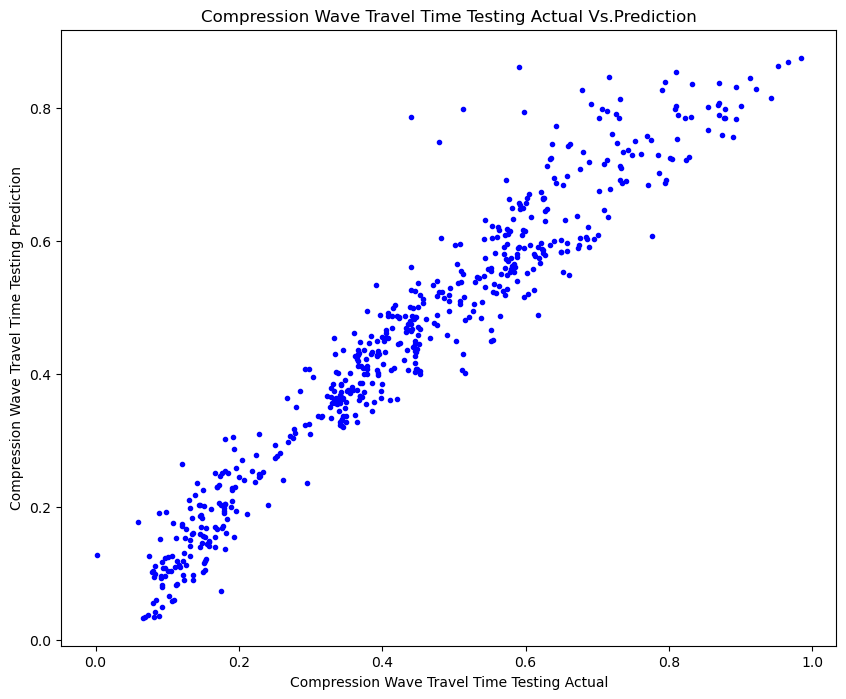

In [26]:
plt.figure(figsize = (10,8))

plt.plot(y_test['Compression Wave Travel Time'], y_pred_test[:,0], 'b.')
plt.xlabel('Compression Wave Travel Time Testing Actual')
plt.ylabel('Compression Wave Travel Time Testing Prediction')
plt.title('Compression Wave Travel Time Testing Actual Vs.Prediction')

Text(0.5, 1.0, 'Shear Wave Travel Time Testing Actual Vs. Prediction')

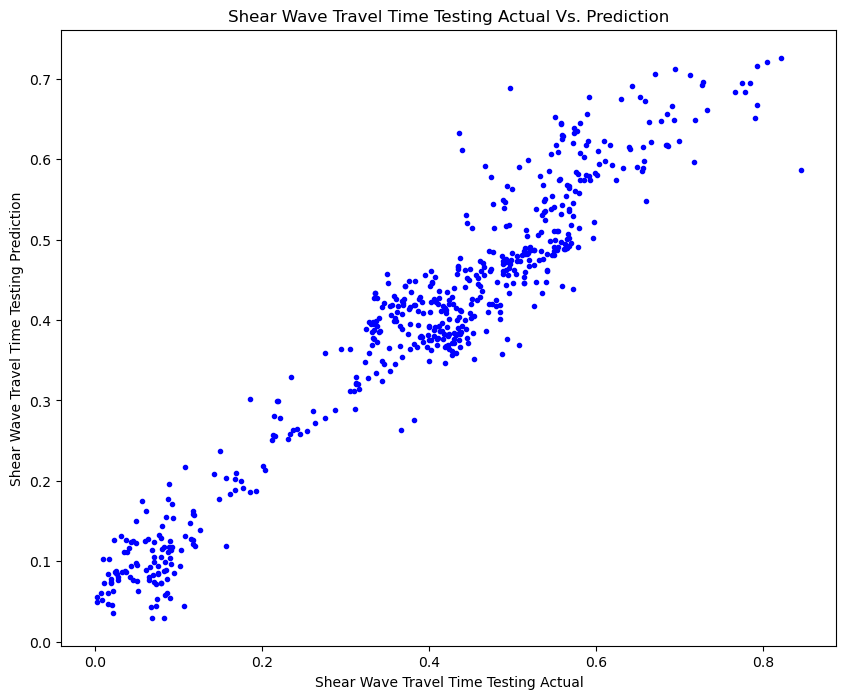

In [27]:
plt.figure(figsize = (10,8))

plt.plot(y_test['Shear Wave Travel Time'], y_pred_test[:,1], 'b.')
plt.xlabel('Shear Wave Travel Time Testing Actual')
plt.ylabel('Shear Wave Travel Time Testing Prediction')
plt.title('Shear Wave Travel Time Testing Actual Vs. Prediction')

# Finally
* The final step is to apply a few complete blind data sets (blind logs) to see
how this trained model performs when applied to new blind wells.

* Afterward,
compare the predicted values from the trained model versus actual shear and
compression wave travel time values.

* If the accuracy is satisfactory with low
error, simply proceed with applying the trained ML model in areas with triple
combo logs that did not utilize sonic logs.

* This will eliminate the need for
investing in more sonic logs and being able to predict the shear and
compression wave travel times with very good accuracy in order to calculate
geomechanical properties such as Young’s modulus, Poisson’s ratio, and
minimum horizontal stress.

# Decision Trees

A **decision tree** is a supervised machine learning algorithm used for both **classification** and **regression** problems. It works by recursively splitting the data into subsets (called subtrees) based on a set of conditions at **decision nodes** until it reaches **terminal nodes** (or leaf nodes), where no further splitting occurs. Each internal node represents a "decision" based on one attribute, and each leaf node represents the final output (class or predicted value).

#### Important Elements of a Decision Tree:
1. **Root Node**: The top node, representing the entire dataset.
2. **Decision Node (Internal Node)**: A node where the data is split based on a certain attribute.
3. **Terminal Node (Leaf Node)**: The end node that represents the final output. No further splitting occurs at this point.

#### Splitting Criteria
Decision trees use specific criteria to determine how to split the data. Popular algorithms include:

1. **ID3** (Iterative Dichotomiser 3):
   - Builds the decision tree using a top-down approach, selecting the attribute that provides the largest information gain.
   - Only works with categorical features.
   
2. **C4.5**:
   - An extension of ID3 that can handle both categorical and continuous features.
   
3. **C5.0**:
   - An optimized version of C4.5 that uses less memory and builds smaller rulesets.
   
4. **CART** (Classification and Regression Trees):
   - Similar to C4.5 but used for both classification and regression problems.
   - Creates binary trees and supports numerical target variables.
   - **Scikit-learn** uses an optimized version of CART.

### Attribute Selection Techniques

In decision trees, determining which attributes should be at the root or decision nodes is crucial. The main criteria for attribute selection are:

1. **Entropy**:
   - A measure of uncertainty or impurity in the data. High entropy means low purity.
   - The formula for entropy is given by:

   $$E(S) = - \sum_{i=1}^{c} P_i \log_2 P_i$$
   
   where:
   - $c$ is the number of classes,
   - $P_i$ is the probability of a class in the dataset.

   Example: If there are 100 samples, where 40 belong to the "Frac" class and 60 belong to the "Don’t Frac" class, the entropy is calculated as follows:

   $$E = - \frac{40}{100} \log_2 \left(\frac{40}{100}\right) - \frac{60}{100} \log_2 \left(\frac{60}{100}\right) = 0.97$$

2. **Information Gain (IG)**:
   - Information gain measures how well an attribute splits the data. It is calculated as the difference between the entropy of the original dataset and the entropy after the split.

   $$IG(Y; X) = E(Y) - E(Y; X)$$

   Example: If the entropy of the target variable is $0.9887$ and after splitting it is $0.7956$, the information gain is:

   $$IG = 0.9887 - 0.7956 = 0.1931$$

3. **Gini Index**:
   - A measure of impurity, where a Gini index of 0 represents perfect classification. It is calculated as:

   $$Gini = 1 - \sum_{i=1}^{c} P_i^2$$

   where $P_i$ is the probability of an element being classified into class $i$.

   The Gini index favors larger partitions compared to information gain.

### Pruning
One of the biggest challenges in using decision trees is **overfitting**. To prevent overfitting, you can apply **pruning**, which involves trimming parts of the tree that do not improve the model's accuracy on unseen data. Another approach is to use cross-validation and ensure that the model is not too complex for the given dataset.

### Random Forest
**Random forest** is a more advanced ensemble method built using decision trees. It generally outperforms single decision trees by reducing overfitting and improving the model's generalization performance.


# Decision tree using scikit-learn

# Step 1 - Data Import

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

df = pd.read_excel('Chapter5_TOC_Prediction_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Thickness_ft,987.0,150.448933,52.452284,50.218753,123.462354,141.662622,166.707110,475.992627
Bulk Density_gg per cc,987.0,2.423001,0.019059,2.386117,2.409469,2.422639,2.433418,2.540608
Resistivity_ohmsm,987.0,3.892432,1.342193,1.680451,3.120852,3.650354,4.319585,15.970625
Effective Porosity_Fraction,987.0,0.061492,0.014805,0.017432,0.051250,0.061158,0.072289,0.096054
Clay Volume_ Fraction,987.0,0.271257,0.045289,0.153118,0.238607,0.264785,0.303776,0.413083
Water Saturation_Fraction,987.0,0.435876,0.080023,0.230041,0.372234,0.442414,0.490972,0.683304
TOC_Fraction,987.0,0.052630,0.005062,0.030830,0.051026,0.053662,0.056100,0.060907


# Step 2 - Data Visualization
* Next, let’s visualize the distribution plot of each feature as follows:

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

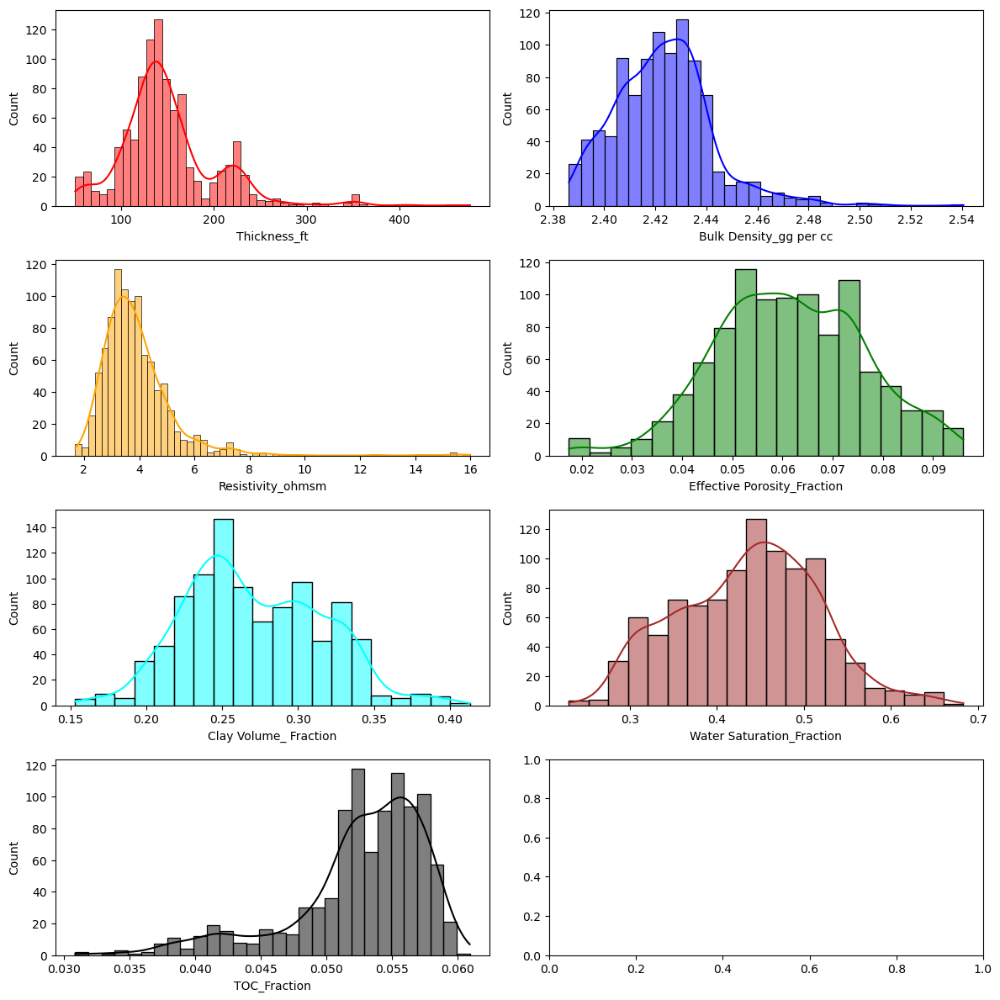

In [29]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Thickness_ft'], color = "red",
             ax = axes[0, 0], kde = True)

sns.histplot(df['Bulk Density_gg per cc'], color = "blue",
             ax = axes[0, 1], kde = True)

sns.histplot(df['Resistivity_ohmsm'], color = "orange",
             ax = axes[1, 0], kde = True)

sns.histplot(df['Effective Porosity_Fraction'], color = "green",
             ax = axes[1, 1], kde = True)

sns.histplot(df['Clay Volume_ Fraction'], color = "cyan",
             ax = axes[2, 0], kde = True)

sns.histplot(df['Water Saturation_Fraction'], color = "brown",
             ax = axes[2, 1], kde = True)

sns.histplot(df['TOC_Fraction'], color = "black",
             ax = axes[3, 0], kde = True)

plt.tight_layout()

# Continuation
* Also, let’s look at the pair plot of all features as follows:

```Python
sns.pairplot(df)

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

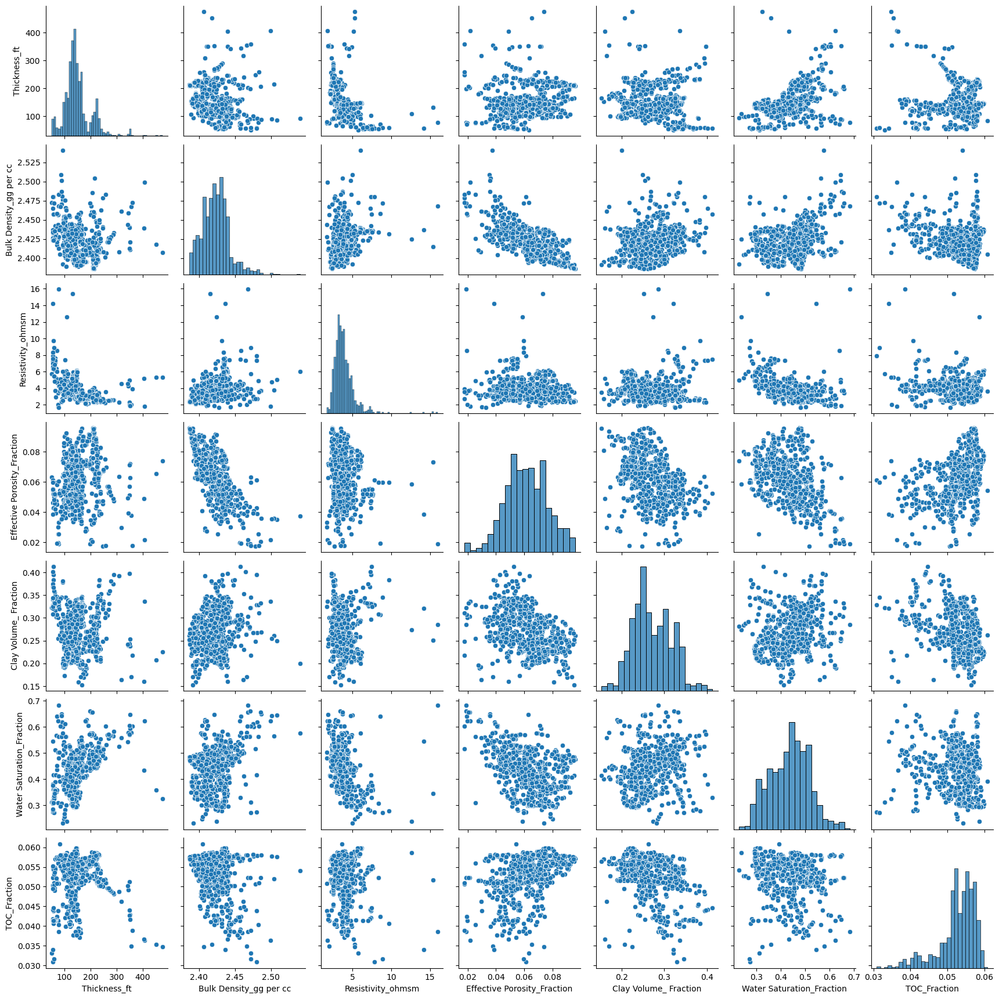

In [30]:
sns.pairplot(df)

# Continuation
* Let’s also look at the heat map of Pearson correlation coefficient as
follows:

<Axes: >

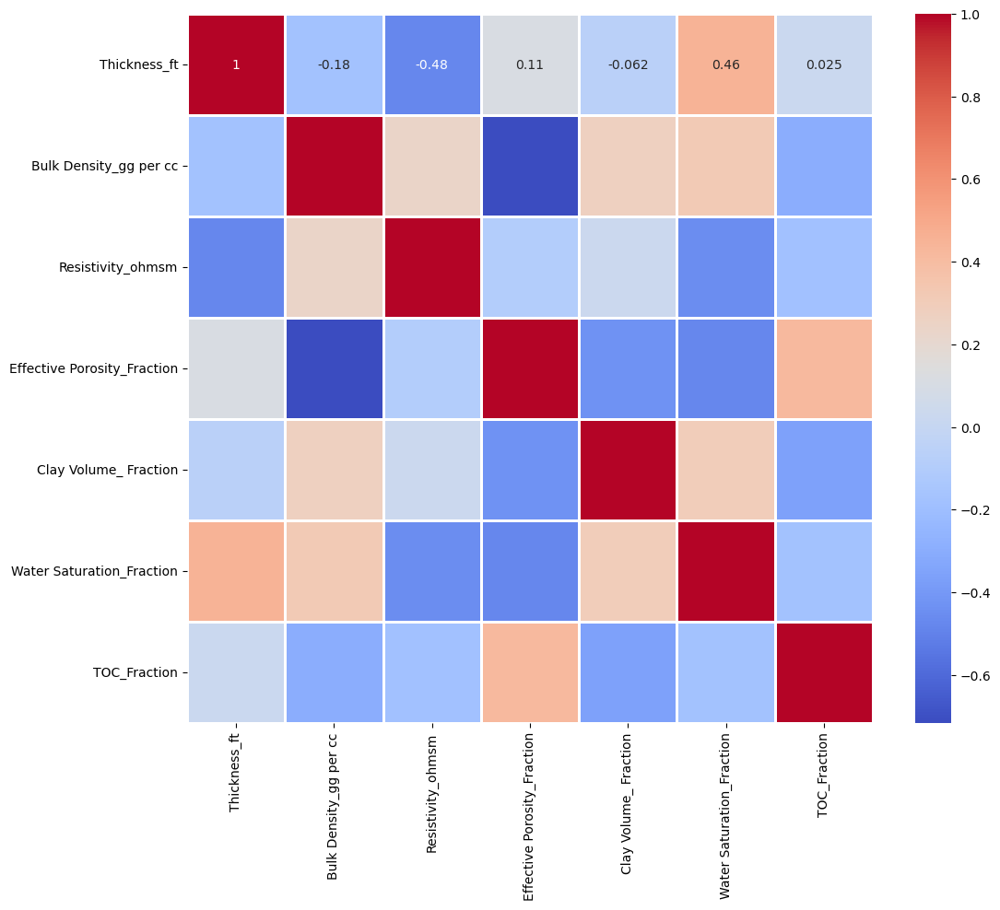

In [31]:
plt.figure(figsize = (12,10))

sns.heatmap(df.corr(), annot = True, linecolor = 'white', 
            linewidths = 2, cmap = 'coolwarm')

# Continuation
* Please note that as illustrated above, the highest absolute value of
Pearson correlation coefficient is between bulk density and effective porosity
with a coefficient of `-0.72`.

* `One of the parameters could potentially be
dropped` as long as the overall testing accuracy of the model does not decrease.

In [33]:
df.drop(['Effective Porosity_Fraction'], axis = 1, inplace = True)

# Step 3 - Training the Model
* Tree-based algorithms such as decision tree, random forest, etc., do not
require feature normalization or standardization.

* For example, when applying
decision tree, since a tree is being branched down, normalization or standardization will not help.

* Let’s define the x and y variables as follows:

In [34]:
x = df.drop(['TOC_Fraction'], axis = 1)

y = df['TOC_Fraction']

# Continuation
* Next, import the train_test_split library and use a `70/30 split` as follows:

In [35]:
from sklearn.model_selection import train_test_split
seed = 1000

np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30)

# Continuation
* Next, import `"DecisionTreeRegressor"` from sklearn.tree as follows.

* For
classification problems, simply use `"DecisionTreeClassifier"`.

In [36]:
from sklearn.tree import DecisionTreeRegressor

# Continuation
### Decision Tree Parameters

When using a decision tree, several parameters can be defined to optimize its performance. Here are the key parameters available in **scikit-learn** when using a `DecisionTreeRegressor`:

1. **Criterion**:
   - This parameter measures the quality of a split. Options include:
     - `mse`: Mean Squared Error.
     - `mae`: Mean Absolute Error.
     - `friedman_mse`: Mean Squared Error with Friedman’s improvement score.
   - In classification problems, options include:
     - `gini`: Gini Index.
     - `entropy`: Information Gain.
   - In the example, `mse` is chosen, but this is one of the hyperparameters that can be tuned during grid search.

2. **Max Depth**:
   - Defined as the "maximum depth of the tree." The default value is `None`, meaning nodes are expanded until all leaves are pure or contain fewer than `min_samples_split` samples.
   - The maximum depth can be as high as "number of training samples - 1," but deeper trees may lead to **overfitting**.
   - If overfitting occurs, consider reducing `max_depth`. However, a low `max_depth` can cause **underfitting**. 
   - It's essential to compare training and testing accuracy scores across various `max_depth` values.

3. **Min Samples Split**:
   - Defined as "The minimum number of samples required to split an internal node."
   - High values may lead to **underfitting** since the model may not learn enough details.
   - The default value is 2. Increasing `min_samples_split` will constrain the tree and may reduce model accuracy, making it a hyperparameter to consider during grid search optimization.

4. **Min Samples Leaf**:
   - This parameter indicates "The minimum number of samples required to be at a leaf node."
   - It differs from `min_samples_split`, which focuses on internal nodes, while `min_samples_leaf` focuses on leaf nodes.
   - A high value for `min_samples_leaf` can lead to **underfitting**, while a low value can result in **overfitting**. It should be included as a hyperparameter in grid search optimization.

5. **Max Features**:
   - Defined as "The number of features to consider when looking for the best split."
   - Reducing the number of features considered at each split can help prevent overfitting.
   - Options include:
     - `auto`: Sets `max_features` to the number of features.
     - `sqrt`: Sets `max_features` to the square root of the number of features.
     - `log2`: Sets `max_features` to log base 2 of the number of features.
   - The default value is `None`, which sets `max_features` to the total number of features. Using `sqrt` or `log2` can reduce computation time and overfitting.

6. **CCP Alpha**:
   - This parameter is used for pruning the decision tree. By default, no pruning is applied.
   - Setting `ccp_alpha` to a positive value enables pruning, which can help reduce the size of the tree and potentially improve its generalization performance.

### Summary

These parameters play a crucial role in controlling the complexity and performance of the decision tree. Properly tuning these hyperparameters can help prevent overfitting while ensuring that the model remains effective on unseen data.


In [37]:
np.random.seed(seed)
dtree = DecisionTreeRegressor(criterion = 'mse', splitter = 'best',
                            max_depth = None, min_samples_split = 4,
                            min_samples_leaf = 2, max_features = None,
                            ccp_alpha = 0)

# Continuation
* Let’s apply `"dtree"` to `"(X_train,y_train)"` as follows:

In [38]:
dtree.fit(X_train,y_train)

InvalidParameterError: The 'criterion' parameter of DecisionTreeRegressor must be a str among {'squared_error', 'poisson', 'friedman_mse', 'absolute_error'}. Got 'mse' instead.

In [39]:
np.random.seed(seed)
dtree = DecisionTreeRegressor(criterion = 'squared_error', splitter = 'best',
                            max_depth = None, min_samples_split = 4,
                            min_samples_leaf = 2, max_features = None,
                            ccp_alpha = 0)

In [40]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0, min_samples_leaf=2, min_samples_split=4)

# Step 4 - Applying the trained Model
* Now that the model has been fit to training inputs and output, let’s apply to
predict `"X_train"` and `"X_test"` as follows.

* The main reason to apply to
`"X_train"` is to be able to obtain the `training accuracy` on the model as well as
the `testing accuracy`.

In [41]:
y_pred_train = dtree.predict(X_train)

y_pred_test = dtree.predict(X_test)

# Continuation
* Next, let’s obtain the `training and testing R2` as follows:

In [42]:
corr_train = np.corrcoef(y_train, y_pred_train) [0,1]

print('Training Data R^2 = ', round(corr_train**2, 4),', R = ',
      round(corr_train, 4))

Training Data R^2 =  0.9637 , R =  0.9817


In [43]:
corr_test = np.corrcoef(y_test, y_pred_test) [0,1]

print('Testing Data R^2 = ', round(corr_test**2, 4),
      ', R = ', round(corr_test, 4))

Testing Data R^2 =  0.6571 , R =  0.8106


# Important Notice

* As illustrated, the training R2 is 97.5%. However, the testing R2 is only
68.33%.

* Therefore, please spend some time manually adjusting some of the
hyperparameters to see whether the testing accuracy can be improved.

# Continuation
* Next, let’s visualize the training actual versus prediction and testing
actual versus prediction as follows:

Text(0.5, 1.0, 'TOC Training Actual Vs. Prediction')

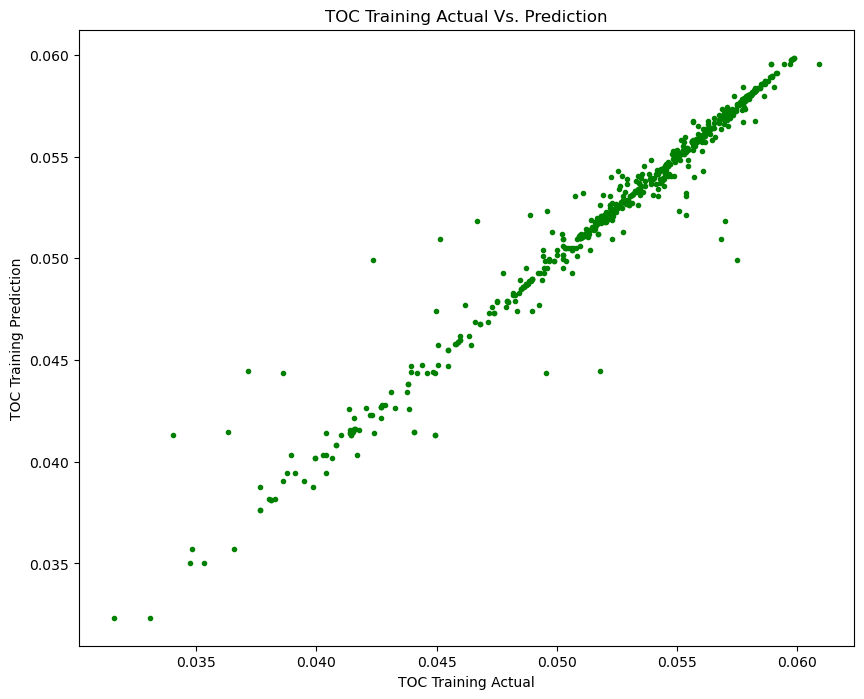

In [44]:
plt.figure(figsize = (10,8))

plt.plot(y_train, y_pred_train, 'g.')
plt.xlabel('TOC Training Actual')
plt.ylabel('TOC Training Prediction')
plt.title('TOC Training Actual Vs. Prediction')

Text(0.5, 1.0, 'TOC Testing Actual Vs. Prediction')

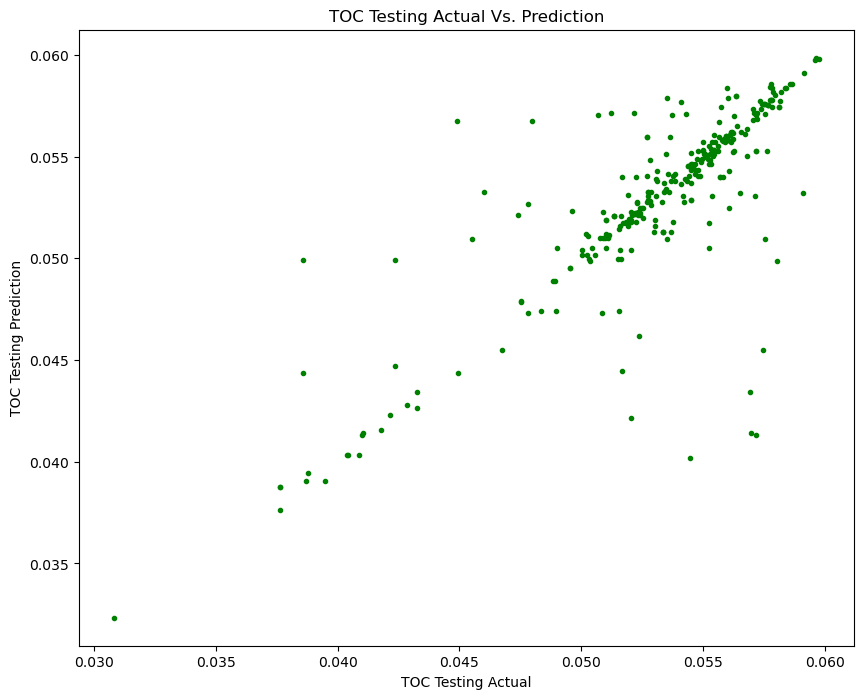

In [45]:
plt.figure(figsize = (10,8))

plt.plot(y_test, y_pred_test, 'g.')
plt.xlabel('TOC Testing Actual')
plt.ylabel('TOC Testing Prediction')
plt.title('TOC Testing Actual Vs. Prediction')

* To compare the `actual and predicted TOC values for the testing set`, the
following lines of code can be added:

In [46]:
TOC_Actual_Prediction = pd.DataFrame({'Actual':y_test, 'Predicted':y_pred_test})
TOC_Actual_Prediction

,Actual,Predicted
834,0.051979,0.051955
604,0.053110,0.053820
747,0.057625,0.055300
908,0.057235,0.057171
545,0.054575,0.054649
...,...,...
809,0.056807,0.055014
166,0.054815,0.054362
172,0.058651,0.058570
263,0.058120,0.057437


* To properly evaluate the model from all aspects, `let’s also add MAE, MSE,
and RMSE` as follows:

In [48]:
from sklearn import metrics
print('MAE:', round(metrics.mean_absolute_error(y_test,
y_pred_test),5))
print('MSE:', round(metrics.mean_squared_error(y_test,
y_pred_test),5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test,
y_pred_test)),5))

MAE: 0.00131
MSE: 1e-05
RMSE: 0.00283


* Decision tree also allows feature ranking by calling `"dtree.feature_importances_"` as follows:

In [49]:
dtree.feature_importances_

array([0.35568781, 0.13283661, 0.12413446, 0.2272348 , 0.16010632])

* Let’s place this in a visualization format `using a tornado chart` as follows:

Text(0.5, 1.0, 'Feature Importance Ranking')

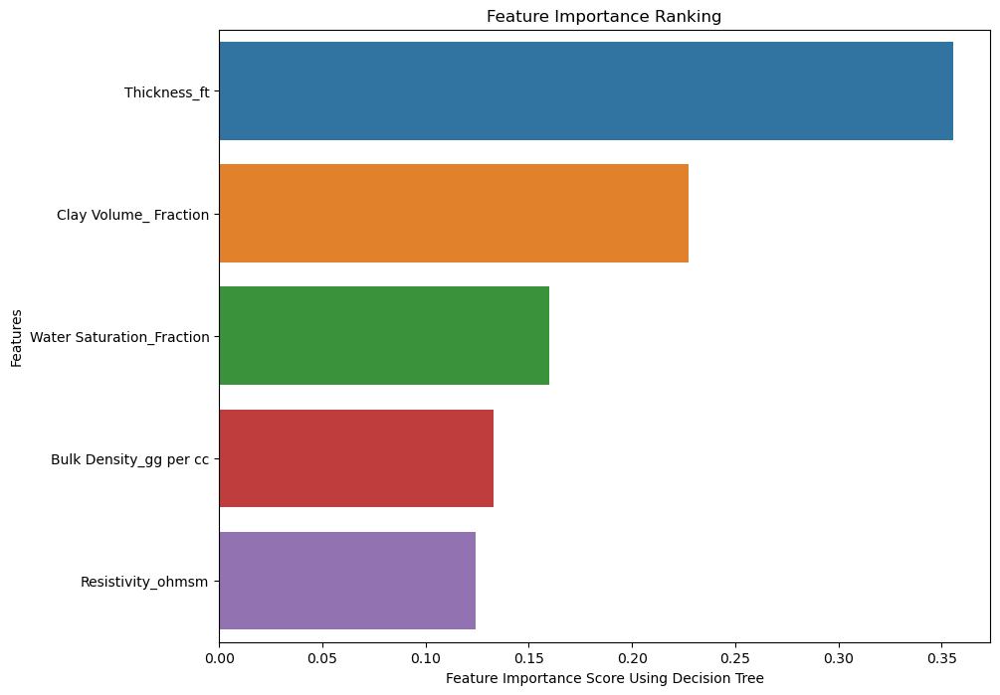

In [50]:
feature_names = df.columns[:-1]

plt.figure(figsize = (10,8))

feature_imp = pd.Series(dtree.feature_importances_,
                        index = feature_names).sort_values(ascending = False)

sns.barplot(x = feature_imp, y = feature_imp.index)
plt.xlabel('Feature Importance Score Using Decision Tree')
plt.ylabel('Features')
plt.title("Feature Importance Ranking")

# Important Notice
* As illustrated above, thickness and clay volume fraction are two of the
most important features impacting the output of the model which was defined as TOC.

* Note that as accuracy of this model improves, the feature ranking will
also vary.

* Note that the train_test_split was done randomly with 70% of the data used
as training and 30% of the data used as testing.

* Let’s also do a five-fold cross-validation to observe the resulting average R2 as follows:

In [51]:
from sklearn.model_selection import cross_val_score

np.random.seed(seed)

scores_R2 = cross_val_score(dtree, x, y,cv = 5, scoring = 'r2')

print(" R2_Cross-validation scores: {}". format(scores_R2))

 R2_Cross-validation scores: [0.55459427 0.57974557 0.58984222 0.70757801 0.61018137]


In [52]:
print(" Average R2_Cross-validation scores: {}".format(scores_R2.mean()))

 Average R2_Cross-validation scores: 0.6083882885979177


# Conclusion
* As illustrated, first import "cross_val_score" library from `"sklearn.model_selection"`.

* Next, use `"dtree"` as the model, `x and y` as input and output
variables, `cv or cross-validation of 5 (five-fold cross-validation)`, and use `R2` as
the metric to yield.

* Afterward, print R2 for each fold, and finally take the
average of all 5 R2 values to yield the average cross-validation R2 for this
example.

* As can be observed, the R2 from 5 fold cross-validation appears to be
slightly lower than the train_test_split technique.

# Random Forest

Random forest is a powerful supervised machine learning (ML) algorithm used for both regression and classification problems. The general technique of random decision forests was first proposed by Kam Ho in 1995. A random forest can be thought of as an ensemble of decision trees, or as a "forest" of decision trees.

#### Why Random Forest is More Accurate

The reason random forest typically offers higher accuracy than a single decision tree is that it aggregates knowledge from many predictions. 
- For regression problems, the final prediction is made by averaging the outputs of the individual decision trees. 
- In classification problems, the final prediction is made by taking a majority vote of the predicted classes from the individual trees.

### Types of Combining Decision Trees

There are two main methods for combining multiple decision trees into one model:

1. **Bagging (Bootstrap Aggregation)**:
   - Bagging was first proposed by Leo Breiman in 1994. 
   - In bagging, multiple independent models are trained on random subsets of data, with sampling done **with replacement**. This means that some samples can be used multiple times in one single decision tree.
   - The average of the predictions from these models is then used for the final prediction.
   - **Advantage**: One of the main benefits of bagging is the reduction of variance in the model. While a single decision tree can be prone to overfitting and sensitive to noise in the data, bootstrapping mitigates these issues.
   - Additionally, in feature bagging, at each split in the decision tree, only a random subset of input features is considered, further improving robustness.

2. **Boosting**:
   - Boosting is another ensemble technique where models are built sequentially, rather than independently.
   - In boosting, more weight is assigned to instances that were predicted incorrectly, allowing the model to focus on challenging cases.
   - Unlike bagging, which uses equal weighting, boosting applies a weighted average where models that perform better are given more influence.
   - This means that samples predicted inaccurately will be resampled more frequently, enhancing the model's accuracy on these challenging cases.
   - While bagging primarily reduces variance, boosting aims to reduce bias.
   - Examples of boosting algorithms include:
     - **Gradient Boosting**
     - **AdaBoost (Adaptive Boosting)**
     - **XGBoost (Extreme Gradient Boosting)**

### Summary

Random forests leverage the strengths of multiple decision trees through techniques like bagging and boosting, making them a robust choice for various predictive modeling tasks. By reducing variance and bias, random forests provide enhanced performance compared to single decision trees, addressing common issues like overfitting and sensitivity to noise in the data.


# Random forest implementation using scikit-learn
# Step 1 - Data Import

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

df = pd.read_excel('Chapter5_TOC_Prediction_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Thickness_ft,987.0,150.448933,52.452284,50.218753,123.462354,141.662622,166.707110,475.992627
Bulk Density_gg per cc,987.0,2.423001,0.019059,2.386117,2.409469,2.422639,2.433418,2.540608
Resistivity_ohmsm,987.0,3.892432,1.342193,1.680451,3.120852,3.650354,4.319585,15.970625
Effective Porosity_Fraction,987.0,0.061492,0.014805,0.017432,0.051250,0.061158,0.072289,0.096054
Clay Volume_ Fraction,987.0,0.271257,0.045289,0.153118,0.238607,0.264785,0.303776,0.413083
Water Saturation_Fraction,987.0,0.435876,0.080023,0.230041,0.372234,0.442414,0.490972,0.683304
TOC_Fraction,987.0,0.052630,0.005062,0.030830,0.051026,0.053662,0.056100,0.060907


# Step 2 - Data Visualization
* Next, let’s visualize the distribution plot of each feature as follows:

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

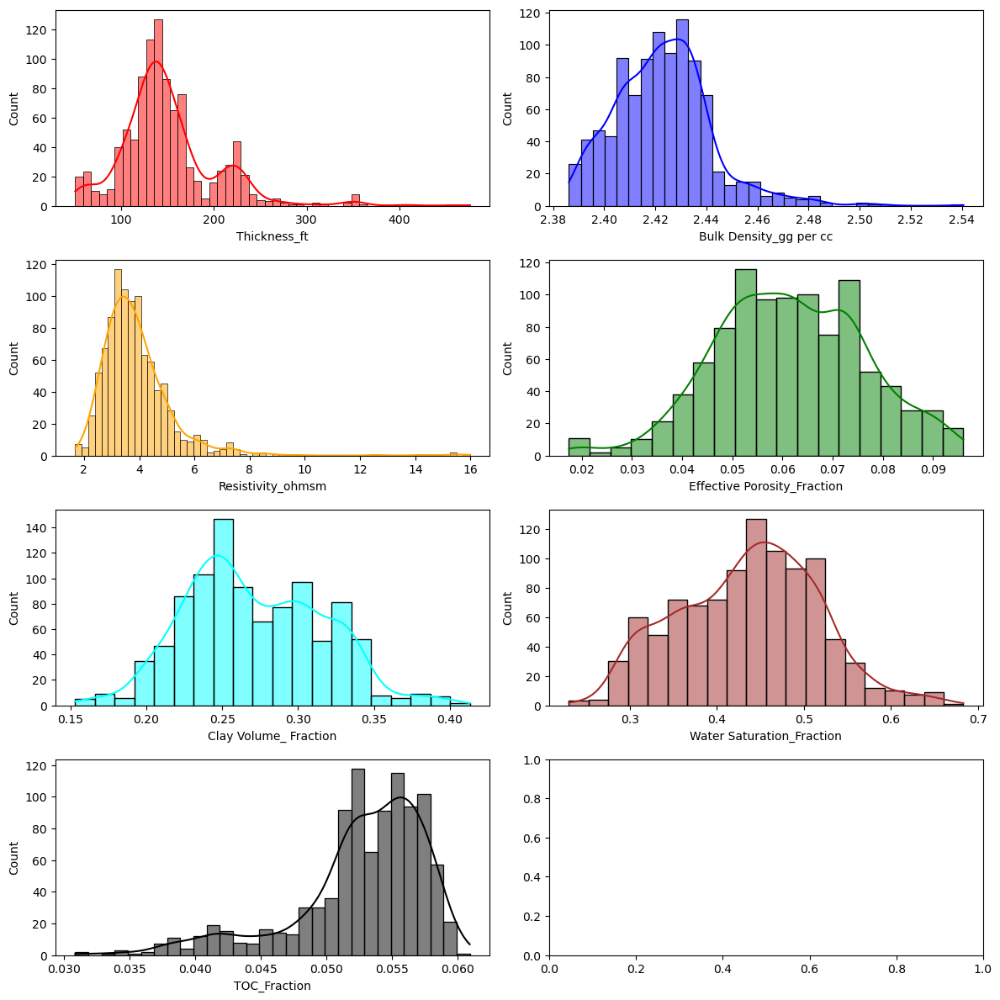

In [54]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Thickness_ft'], color = "red",
             ax = axes[0, 0], kde = True)

sns.histplot(df['Bulk Density_gg per cc'], color = "blue",
             ax = axes[0, 1], kde = True)

sns.histplot(df['Resistivity_ohmsm'], color = "orange",
             ax = axes[1, 0], kde = True)

sns.histplot(df['Effective Porosity_Fraction'], color = "green",
             ax = axes[1, 1], kde = True)

sns.histplot(df['Clay Volume_ Fraction'], color = "cyan",
             ax = axes[2, 0], kde = True)

sns.histplot(df['Water Saturation_Fraction'], color = "brown",
             ax = axes[2, 1], kde = True)

sns.histplot(df['TOC_Fraction'], color = "black",
             ax = axes[3, 0], kde = True)

plt.tight_layout()

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

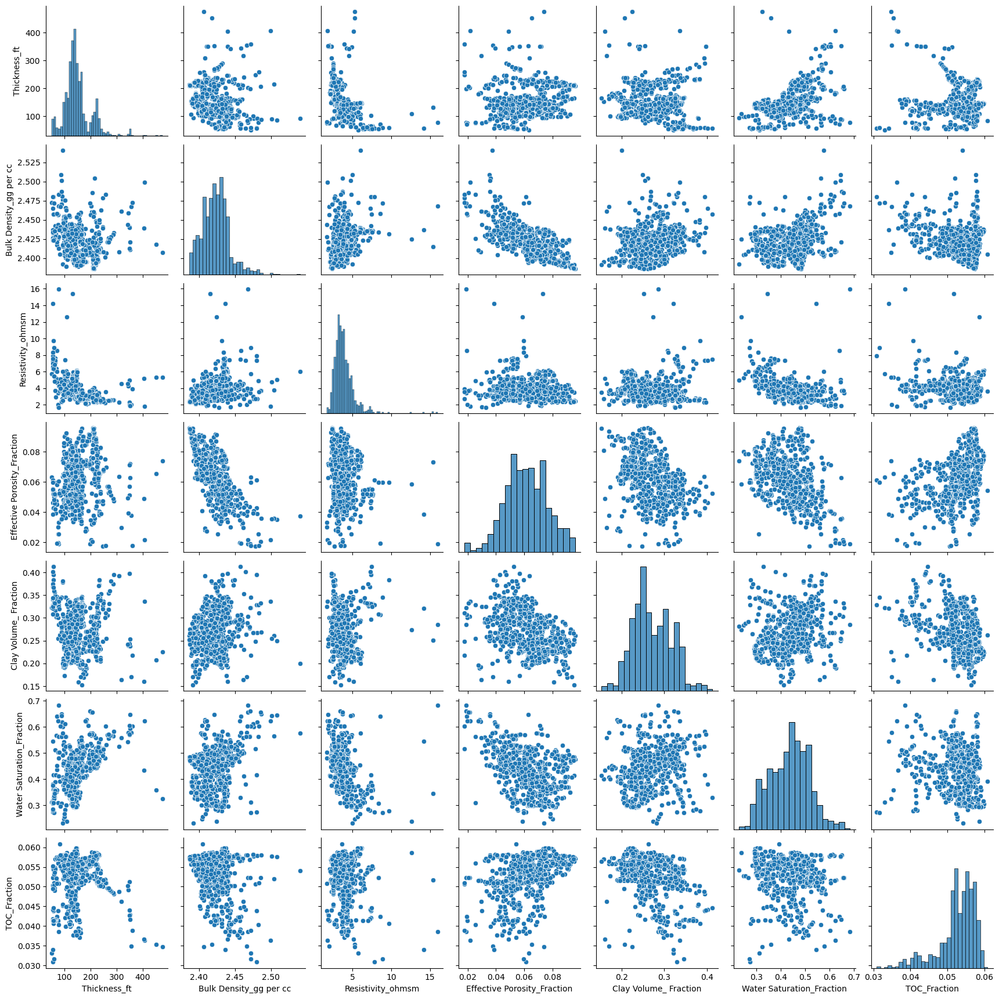

In [55]:
sns.pairplot(df)

<Axes: >

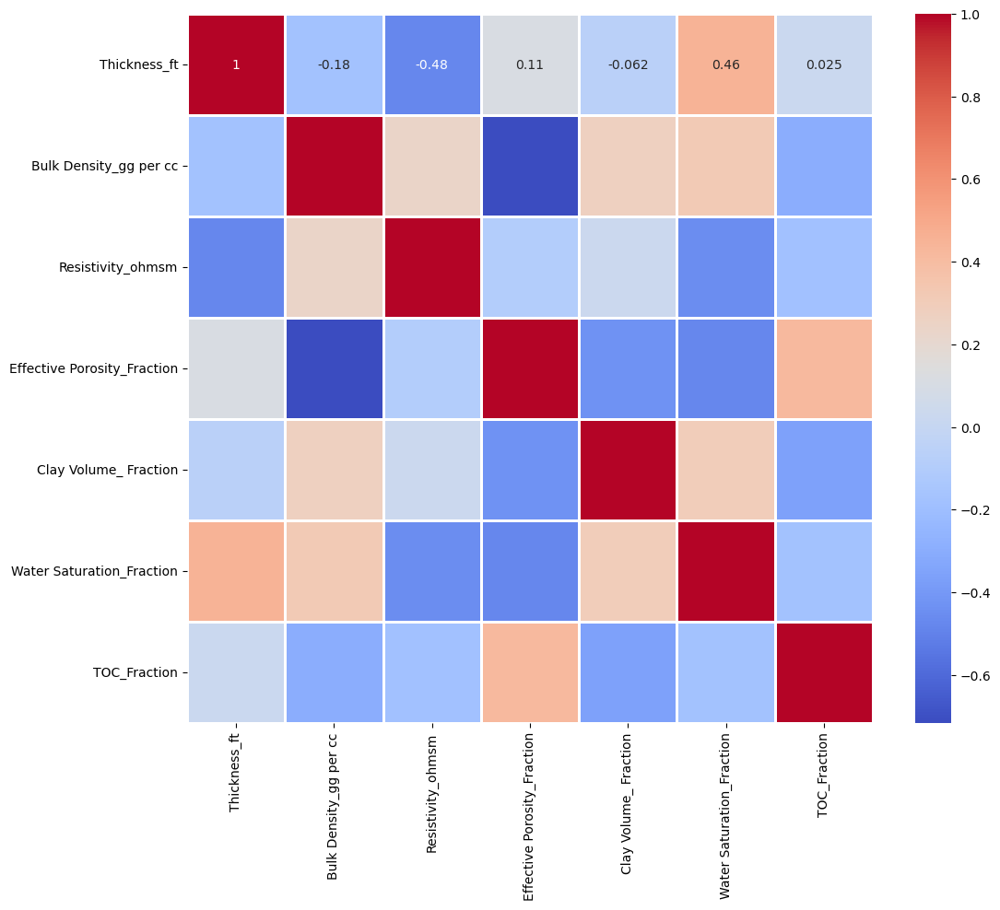

In [56]:
plt.figure(figsize = (12,10))

sns.heatmap(df.corr(), annot = True, linecolor = 'white', 
            linewidths = 2, cmap = 'coolwarm')

# Step 3 - Training the Model
* Tree-based algorithms such as decision tree, random forest, etc., do not
require feature normalization or standardization.

* For example, when applying
decision tree, since a tree is being branched down, normalization or standardization will not help.

* Let’s define the x and y variables as follows:

In [57]:
x = df.drop(['TOC_Fraction'], axis = 1)

y = df['TOC_Fraction']

In [58]:
from sklearn.model_selection import train_test_split
seed = 1000

np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30)

In [60]:
from sklearn.ensemble import RandomForestRegressor

In [67]:
np.random.seed(seed)
rf = RandomForestRegressor(n_estimators = 5000, criterion = 'squared_error',
                           max_depth = None, min_samples_split = 4,
                           min_samples_leaf = 2, max_features = 'auto',
                           bootstrap = True, n_jobs = -1)

In [68]:
rf.fit(X_train,y_train)

y_pred_train = rf.predict(X_train)

y_pred_test = rf.predict(X_test)

corr_train = np.corrcoef(y_train, y_pred_train) [0,1]

print('Training Data R^2 = ', round(corr_train**2,4),
      ', R = ',round(corr_train, 4))

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Training Data R^2 =  0.9659 , R =  0.9828


In [75]:
np.random.seed(seed)
rf = RandomForestRegressor(n_estimators = 5000, criterion = 'squared_error',
                           max_depth = None, min_samples_split = 4,
                           min_samples_leaf = 2, max_features = 1,
                           bootstrap = True, n_jobs = -1)

In [66]:
rf.fit(X_train,y_train)

y_pred_train = rf.predict(X_train)

y_pred_test = rf.predict(X_test)

corr_train = np.corrcoef(y_train, y_pred_train) [0,1]

print('Training Data R^2 = ', round(corr_train**2,4),
      ', R = ',round(corr_train, 4))

Training Data R^2 =  0.9383 , R =  0.9687


In [69]:
corr_test = np.corrcoef(y_test, y_pred_test) [0,1]

print('Testing Data R^2 = ',
      round(corr_test**2,4),', R = ',round(corr_test,4))

Testing Data R^2 =  0.8198 , R =  0.9054


Text(0.5, 1.0, 'TOC Training Actual Vs. Prediction')

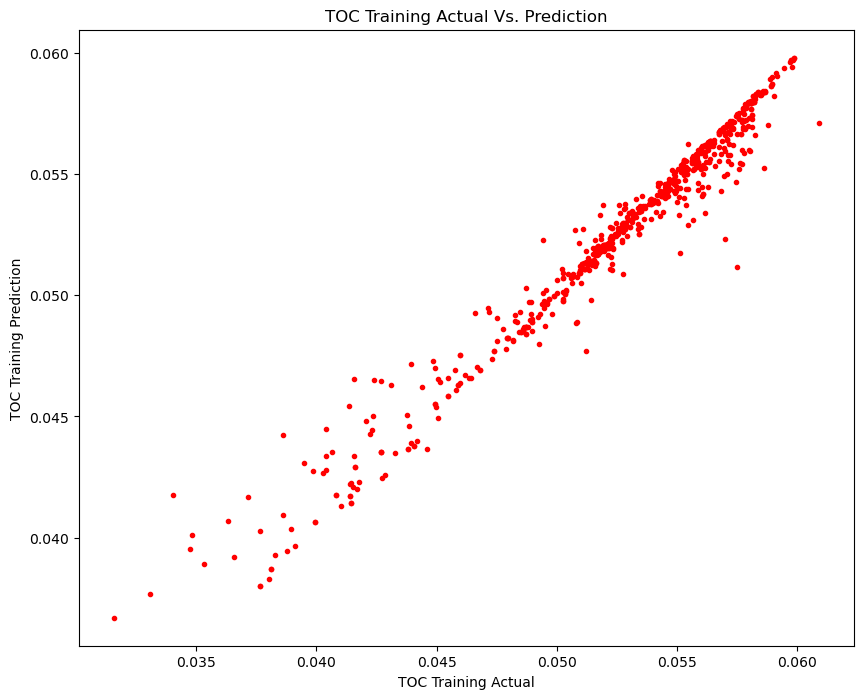

In [70]:
plt.figure(figsize = (10,8))

plt.plot(y_train, y_pred_train, 'r.')
plt.xlabel('TOC Training Actual')
plt.ylabel('TOC Training Prediction')
plt.title('TOC Training Actual Vs. Prediction')

Text(0.5, 1.0, 'TOC Testing Actual Vs. Prediction')

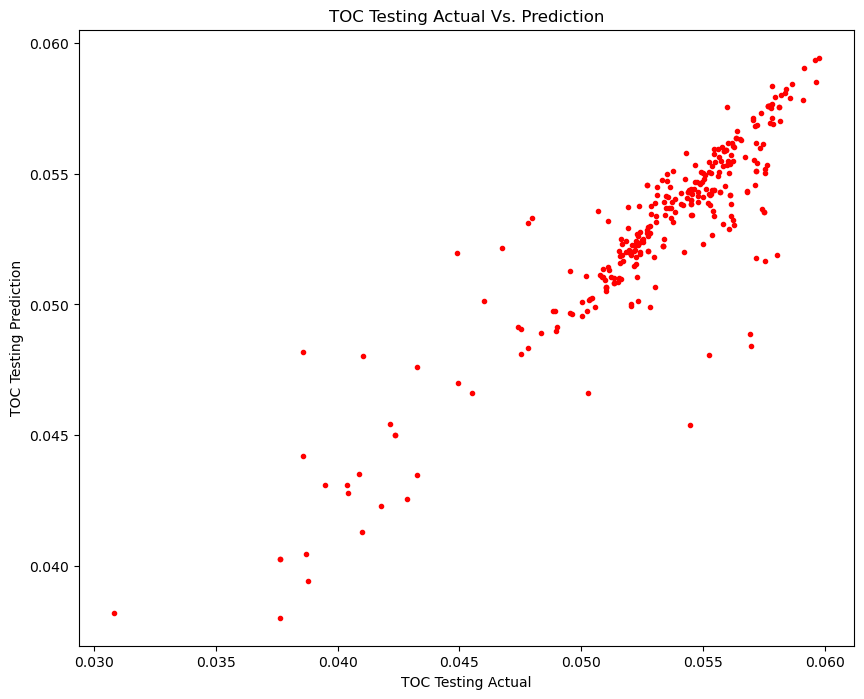

In [71]:
plt.figure(figsize = (10,8))

plt.plot(y_test, y_pred_test, 'r.')
plt.xlabel('TOC Testing Actual')
plt.ylabel('TOC Testing Prediction')
plt.title('TOC Testing Actual Vs. Prediction')

In [72]:
from sklearn import metrics
print('MAE:', round(metrics.mean_absolute_error(y_test, y_pred_test),5))
print('MSE:', round(metrics.mean_squared_error(y_test, y_pred_test),5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)),5))

MAE: 0.00117
MSE: 0.0
RMSE: 0.00201


Text(0.5, 1.0, 'Feature Importance Ranking')

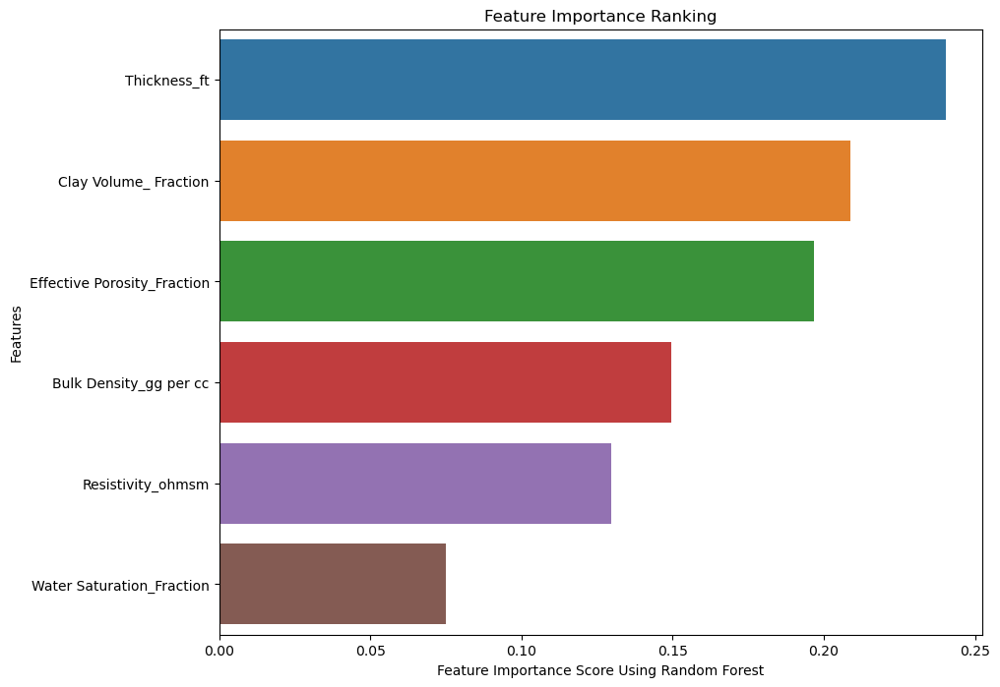

In [73]:
feature_names = df.columns[:-1]

plt.figure(figsize = (10,8))

feature_imp = pd.Series(rf.feature_importances_,
                        index = feature_names).sort_values(ascending = False)

sns.barplot(x = feature_imp, y = feature_imp.index)
plt.xlabel('Feature Importance Score Using Random Forest')
plt.ylabel('Features')
plt.title("Feature Importance Ranking")

In [76]:
from sklearn.model_selection import cross_val_score
np.random.seed(seed)

scores_R2 = cross_val_score(rf, x, y,cv = 5, scoring = 'r2')

print(" R2_Cross-validation scores: {}". format(scores_R2))

 R2_Cross-validation scores: [0.67407685 0.71614457 0.68232414 0.7549054  0.66649017]


In [77]:
print(" Average R2_Cross-validation scores: {}".format(scores_R2.mean()))

 Average R2_Cross-validation scores: 0.698788227219635


## Extra Trees (Extremely Randomized Trees)

Extra trees is a supervised ML algorithm used for both classification and regression problems, similar to random forest. However, there are key differences:

- **Sampling**: Unlike random forest, which uses bootstrapping (samples drawn with replacement), extra trees use the entire original dataset. In scikit-learn, bootstrapping is set to `False` by default but can be enabled if needed.
  
- **Splitting Nodes**: Random forest selects the optimal split for nodes, whereas extra trees chooses the split points randomly. After selecting the split points, both algorithms pick the best split from the feature subsets.

- **Computation**: Extra trees is computationally faster than random forest due to the random selection of split points.


# Extra trees implementation using scikit-learn

# Step 1 - Data Import

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

df = pd.read_excel('Chapter5_TOC_Prediction_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Thickness_ft,987.0,150.448933,52.452284,50.218753,123.462354,141.662622,166.707110,475.992627
Bulk Density_gg per cc,987.0,2.423001,0.019059,2.386117,2.409469,2.422639,2.433418,2.540608
Resistivity_ohmsm,987.0,3.892432,1.342193,1.680451,3.120852,3.650354,4.319585,15.970625
Effective Porosity_Fraction,987.0,0.061492,0.014805,0.017432,0.051250,0.061158,0.072289,0.096054
Clay Volume_ Fraction,987.0,0.271257,0.045289,0.153118,0.238607,0.264785,0.303776,0.413083
Water Saturation_Fraction,987.0,0.435876,0.080023,0.230041,0.372234,0.442414,0.490972,0.683304
TOC_Fraction,987.0,0.052630,0.005062,0.030830,0.051026,0.053662,0.056100,0.060907


# Step 2 - Data Visualization
* Next, let’s visualize the distribution plot of each feature as follows:

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

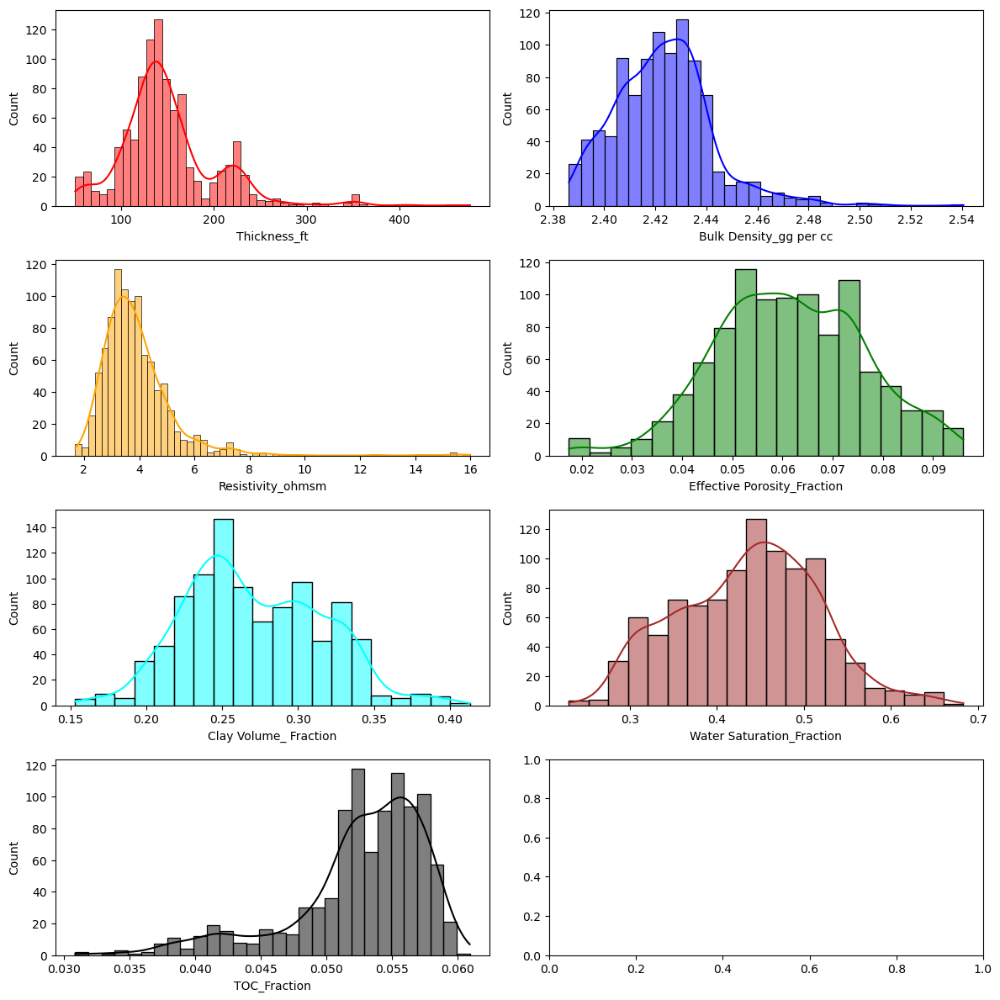

In [2]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Thickness_ft'], color = "red",
             ax = axes[0, 0], kde = True)

sns.histplot(df['Bulk Density_gg per cc'], color = "blue",
             ax = axes[0, 1], kde = True)

sns.histplot(df['Resistivity_ohmsm'], color = "orange",
             ax = axes[1, 0], kde = True)

sns.histplot(df['Effective Porosity_Fraction'], color = "green",
             ax = axes[1, 1], kde = True)

sns.histplot(df['Clay Volume_ Fraction'], color = "cyan",
             ax = axes[2, 0], kde = True)

sns.histplot(df['Water Saturation_Fraction'], color = "brown",
             ax = axes[2, 1], kde = True)

sns.histplot(df['TOC_Fraction'], color = "black",
             ax = axes[3, 0], kde = True)

plt.tight_layout()

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

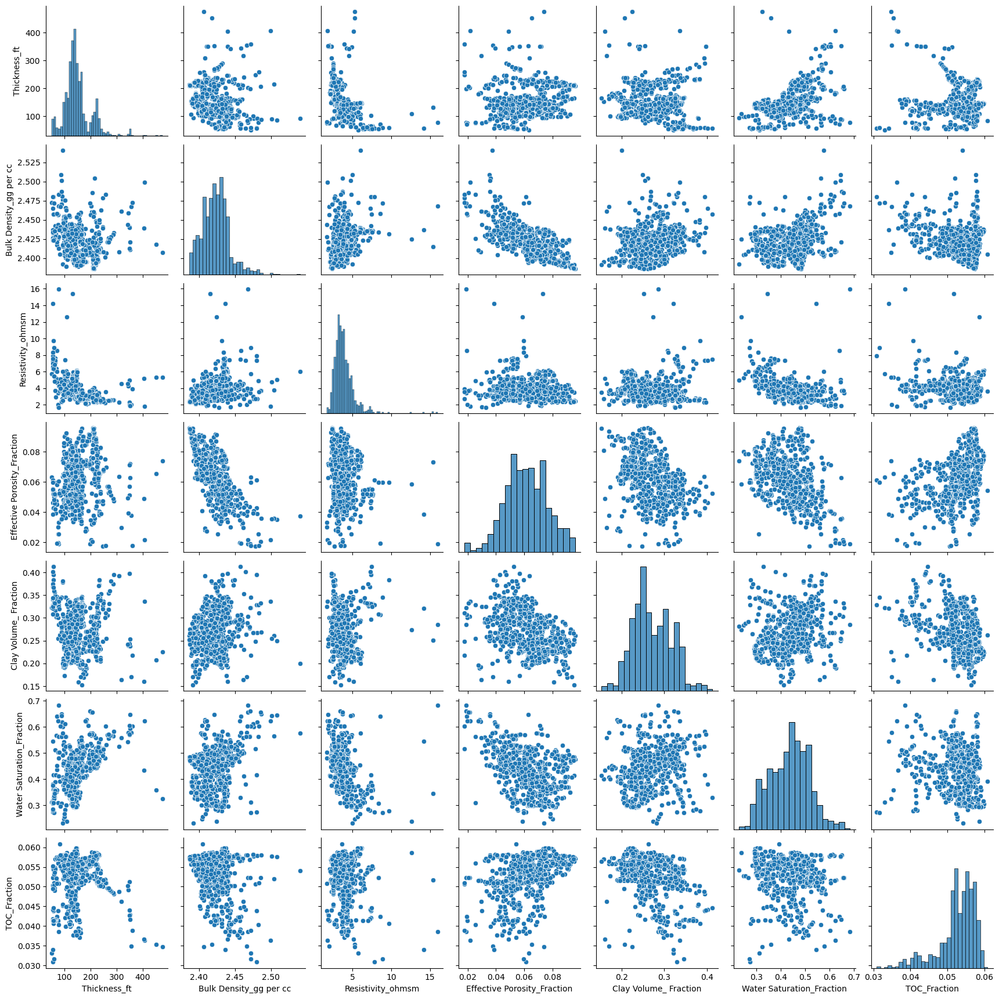

In [3]:
sns.pairplot(df)

<Axes: >

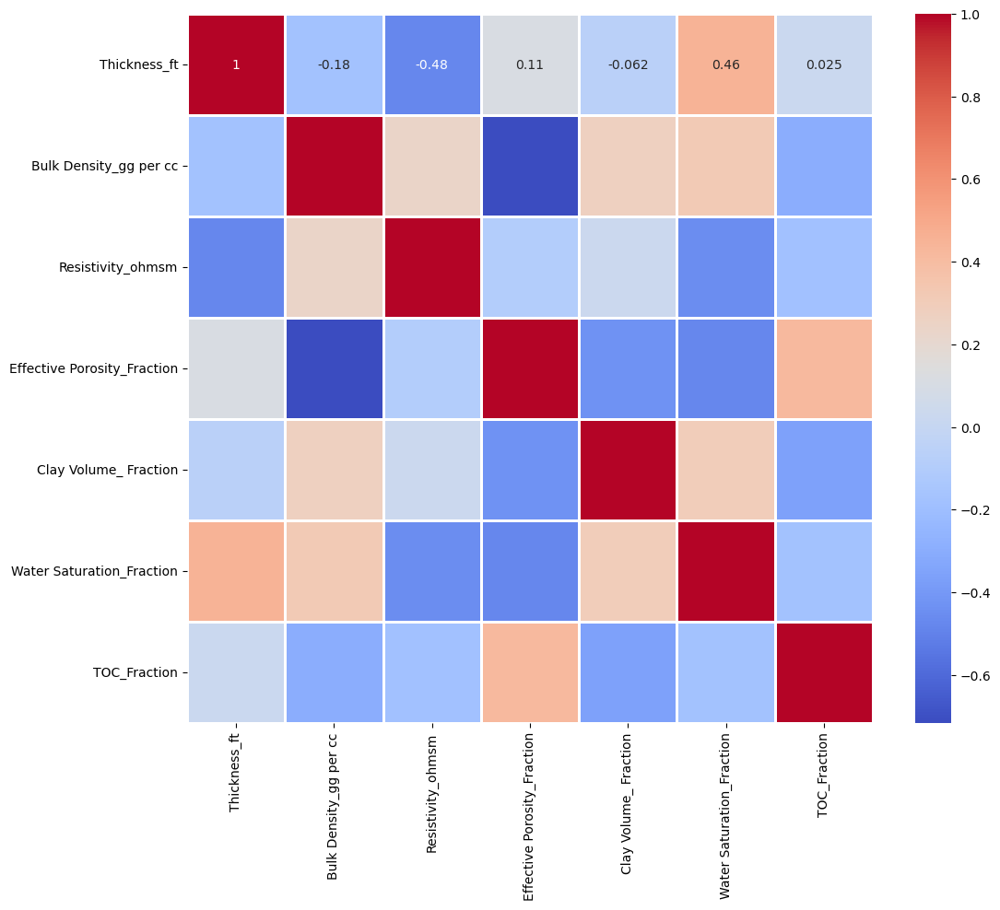

In [4]:
plt.figure(figsize = (12,10))

sns.heatmap(df.corr(), annot = True, linecolor = 'white', 
            linewidths = 2, cmap = 'coolwarm')

# Step 3 - Training the Model
* Tree-based algorithms such as decision tree, random forest, etc., do not
require feature normalization or standardization.

* For example, when applying
decision tree, since a tree is being branched down, normalization or standardization will not help.

* Let’s define the x and y variables as follows:

In [5]:
x = df.drop(['TOC_Fraction'], axis = 1)

y = df['TOC_Fraction']

In [11]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split

seed = 1000
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.30)

In [12]:
np.random.seed(seed)
et  = ExtraTreesRegressor(n_estimators = 5000, criterion = 'squared_error',
                          max_depth = None, min_samples_split = 4,
                          min_samples_leaf = 2, bootstrap = False, n_jobs = -1)

et.fit(X_train,y_train)

y_pred_train = et.predict(X_train)
y_pred_test = et.predict(X_test)

In [13]:
corr_train = np.corrcoef(y_train, y_pred_train) [0,1]

print('Training Data R^2 = ',
      round(corr_train**2, 4), ', R = ', round(corr_train,4))

Training Data R^2 =  0.9833 , R =  0.9916


Text(0.5, 1.0, 'TOC Training Actual Vs. Prediction')

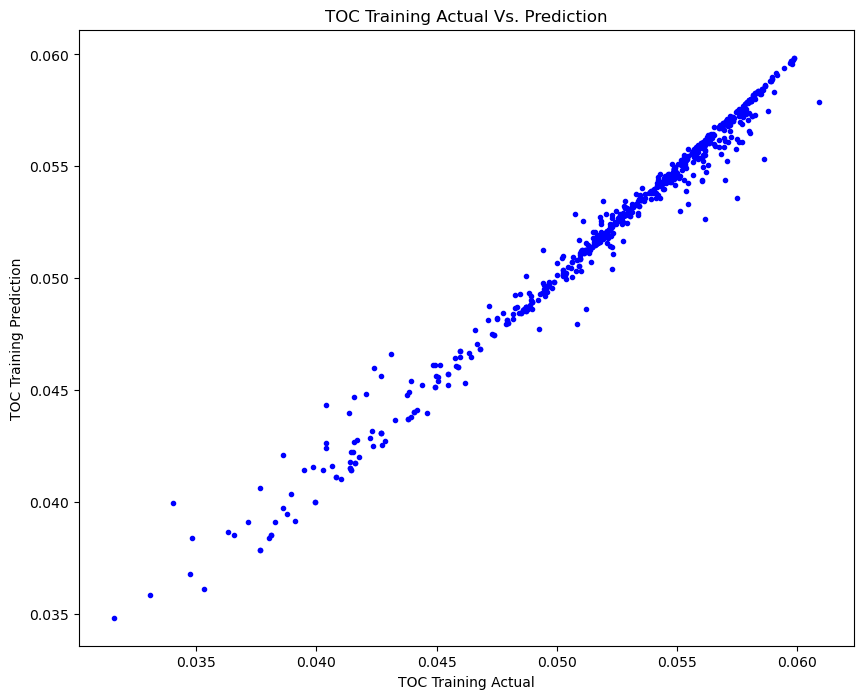

In [14]:
plt.figure(figsize = (10,8))
plt.plot(y_train, y_pred_train, 'b.')
plt.xlabel('TOC Training Actual')
plt.ylabel('TOC Training Prediction')
plt.title('TOC Training Actual Vs. Prediction')

Text(0.5, 1.0, 'TOC Testing Actual Vs. Prediction')

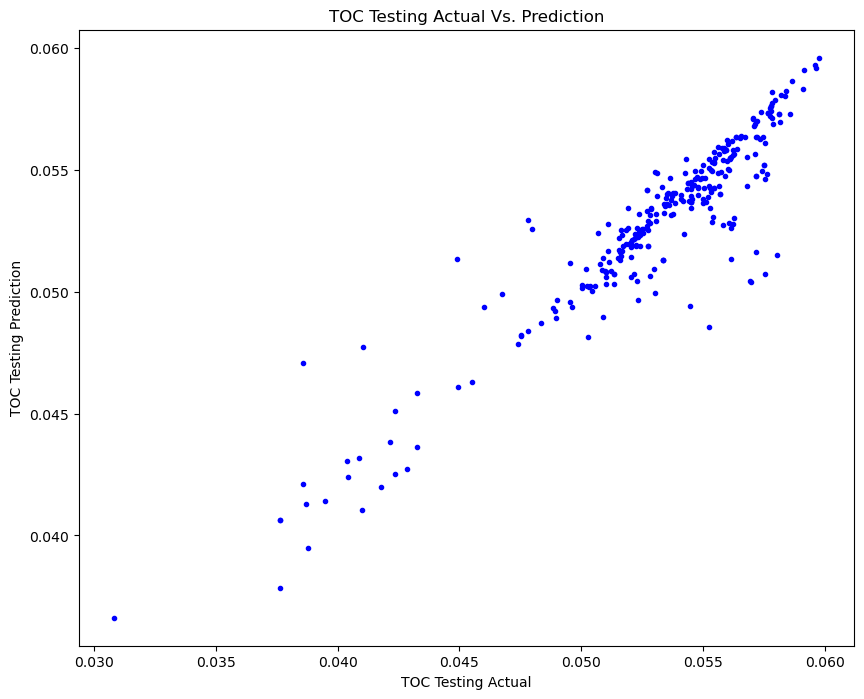

In [15]:
plt.figure(figsize = (10,8))
plt.plot(y_test, y_pred_test, 'b.')
plt.xlabel('TOC Testing Actual')
plt.ylabel('TOC Testing Prediction')
plt.title('TOC Testing Actual Vs. Prediction')

In [16]:
TOC_Actual_Prediction = pd.DataFrame({'Actual':y_test, 'Predicted':y_pred_test})
TOC_Actual_Prediction

,Actual,Predicted
834,0.051979,0.051965
604,0.053110,0.053907
747,0.057625,0.054818
908,0.057235,0.056331
545,0.054575,0.053796
...,...,...
809,0.056807,0.054314
166,0.054815,0.054254
172,0.058651,0.058628
263,0.058120,0.057293


In [17]:
from sklearn import metrics
print('MAE:', round(metrics.mean_absolute_error(y_test,
y_pred_test),5))
print('MSE:', round(metrics.mean_squared_error(y_test,
y_pred_test),5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test,
y_pred_test)),5))

MAE: 0.00103
MSE: 0.0
RMSE: 0.00176


Text(0.5, 1.0, 'Feature Importance Ranking')

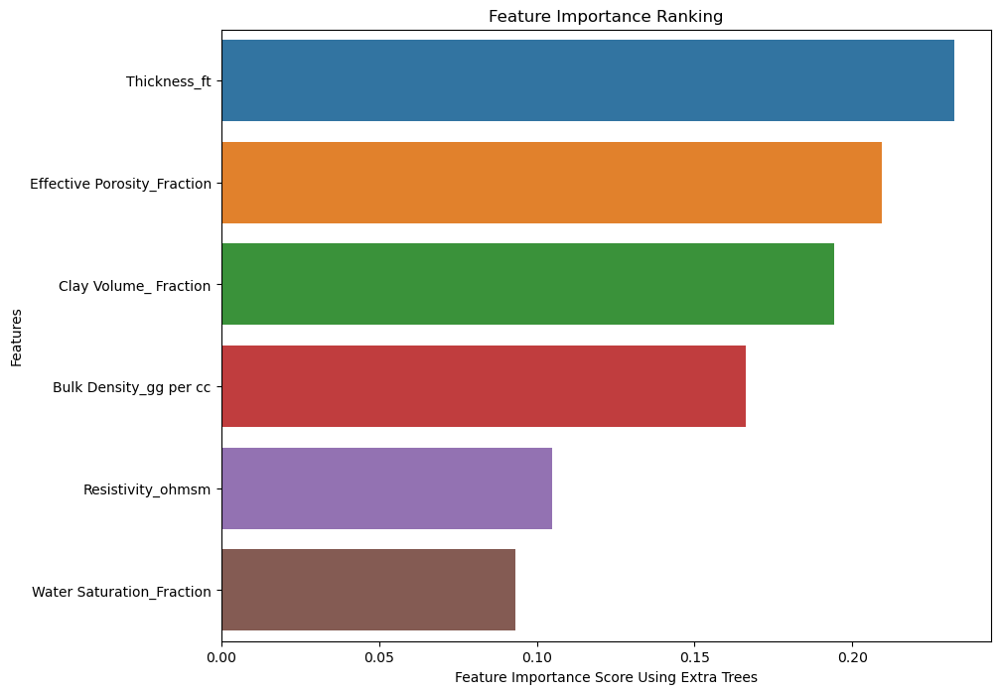

In [19]:
feature_names = df.columns[:-1]
plt.figure(figsize = (10,8))

feature_imp = pd.Series(et.feature_importances_,
                        index = feature_names).sort_values(ascending = False)

sns.barplot(x = feature_imp, y = feature_imp.index)
plt.xlabel('Feature Importance Score Using Extra Trees')
plt.ylabel('Features')
plt.title("Feature Importance Ranking")

In [20]:
from sklearn.model_selection import cross_val_score
np.random.seed(seed)
scores_R2 = cross_val_score(et, x, y,cv = 5,scoring = 'r2')
print(" R2_Cross-validation scores: {}". format(scores_R2))

 R2_Cross-validation scores: [0.79058329 0.82688943 0.78343302 0.84755269 0.80625756]


# Gradient Boosting

Gradient boosting is a supervised ensemble machine learning algorithm used for both classification and regression problems. It sequentially trains multiple models, focusing on instances with erroneous predictions by giving them more weight. The model aims to minimize a loss function, similar to how artificial neural networks optimize weights. 

Key points:
- Gradient boosting trains models sequentially, unlike random forest and extra trees.
- It calculates the error between predictions and actual values to compute the gradient (partial derivative of the loss function).
- The gradient is used to adjust the model parameters to reduce error.
- It shares hyperparameters with random forest/extra trees (e.g., tree-related parameters) but also has additional ones like learning rate and loss function, similar to an ANN.

Hyperparameter details will be covered in the next chapter.


In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style("darkgrid")
df = pd.read_excel('Chapter5_NPV_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Lateral_length,258.0,8911.663566,2995.195633,2439.500000,6433.225000,8089.450000,11582.100000,16918.400000
Stage_length,258.0,223.834920,52.900698,85.600003,178.830607,204.708946,263.308520,386.754534
Sand_to_water_ratio,258.0,1.268741,0.338050,0.119433,1.108849,1.249180,1.437271,2.442476
Sand_per_ft,258.0,2066.112041,903.288312,310.728368,1416.164360,2027.515360,2777.796760,4964.854720
Water_per_ft,258.0,39.069433,15.740073,8.118385,26.593500,40.575506,51.229328,75.340213
EUR_BCF,258.0,9.795406,6.193401,0.173786,5.212174,8.570267,12.465853,37.375668
NPV_at_3.0_MMBTU_Gas Pricing,258.0,-0.634117,3.631055,-8.092757,-3.107133,-1.587870,1.061966,13.828945


C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

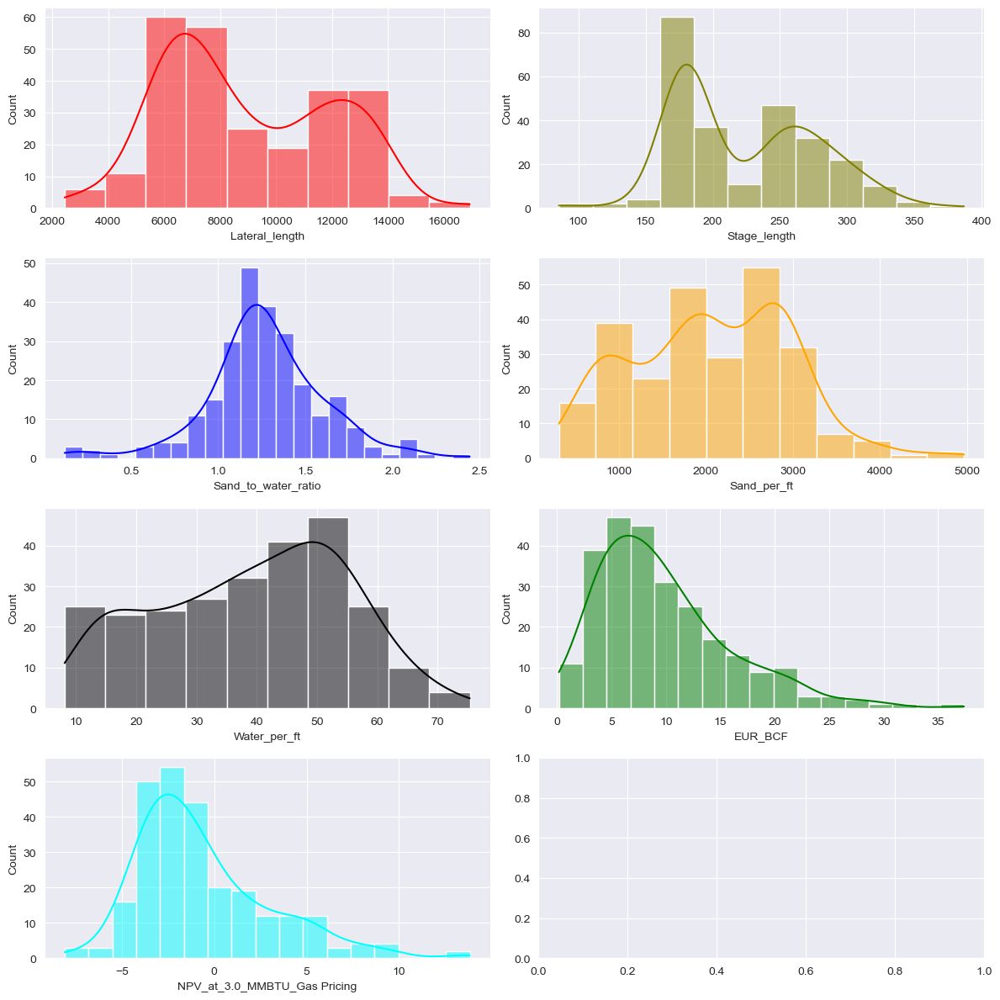

In [22]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Lateral_length'], color = "red",
             ax = axes[0, 0], kde = True)

sns.histplot(df['Stage_length'], color = "olive",
             ax = axes[0, 1], kde = True)

sns.histplot(df['Sand_to_water_ratio'], color = "blue",
             ax = axes[1, 0], kde = True)

sns.histplot(df['Sand_per_ft'], color = "orange",
             ax = axes[1, 1], kde = True)

sns.histplot(df['Water_per_ft'], color = "black",
             ax = axes[2, 0], kde = True)

sns.histplot(df['EUR_BCF'], color = "green",
             ax = axes[2, 1], kde = True)

sns.histplot(df['NPV_at_3.0_MMBTU_Gas Pricing'], color = "cyan",
             ax = axes[3, 0], kde = True)

plt.tight_layout()

* As observed, the distribution of majority of the parameters is normal.

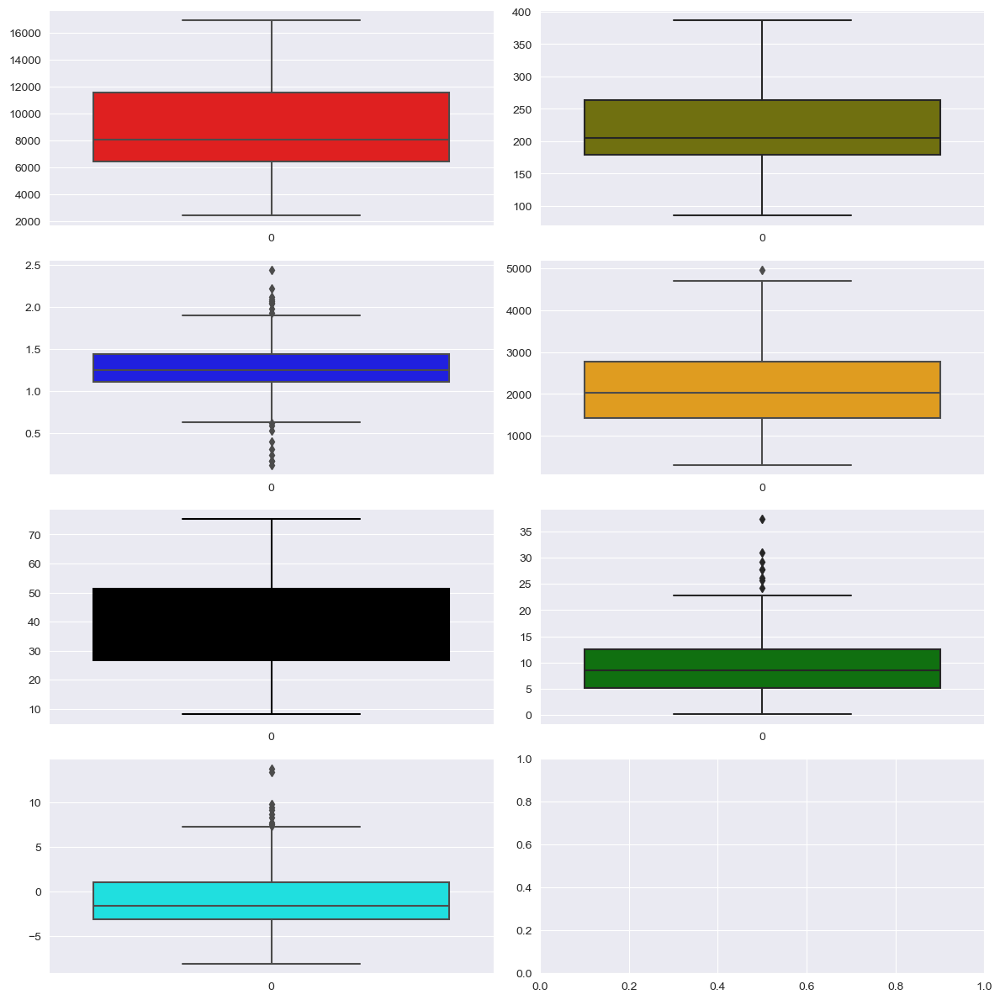

In [23]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.boxplot(df['Lateral_length'], color = "red", ax = axes[0, 0])
sns.boxplot(df['Stage_length'], color = "olive", ax = axes[0, 1])
sns.boxplot(df['Sand_to_water_ratio'], color = "blue", ax = axes[1, 0])
sns.boxplot(df['Sand_per_ft'], color = "orange", ax = axes[1, 1])
sns.boxplot(df['Water_per_ft'], color = "black", ax = axes[2, 0])
sns.boxplot(df['EUR_BCF'], color = "green", ax = axes[2, 1])
sns.boxplot(df['NPV_at_3.0_MMBTU_Gas Pricing'], color = "cyan", ax = axes[3, 0])
plt.tight_layout()

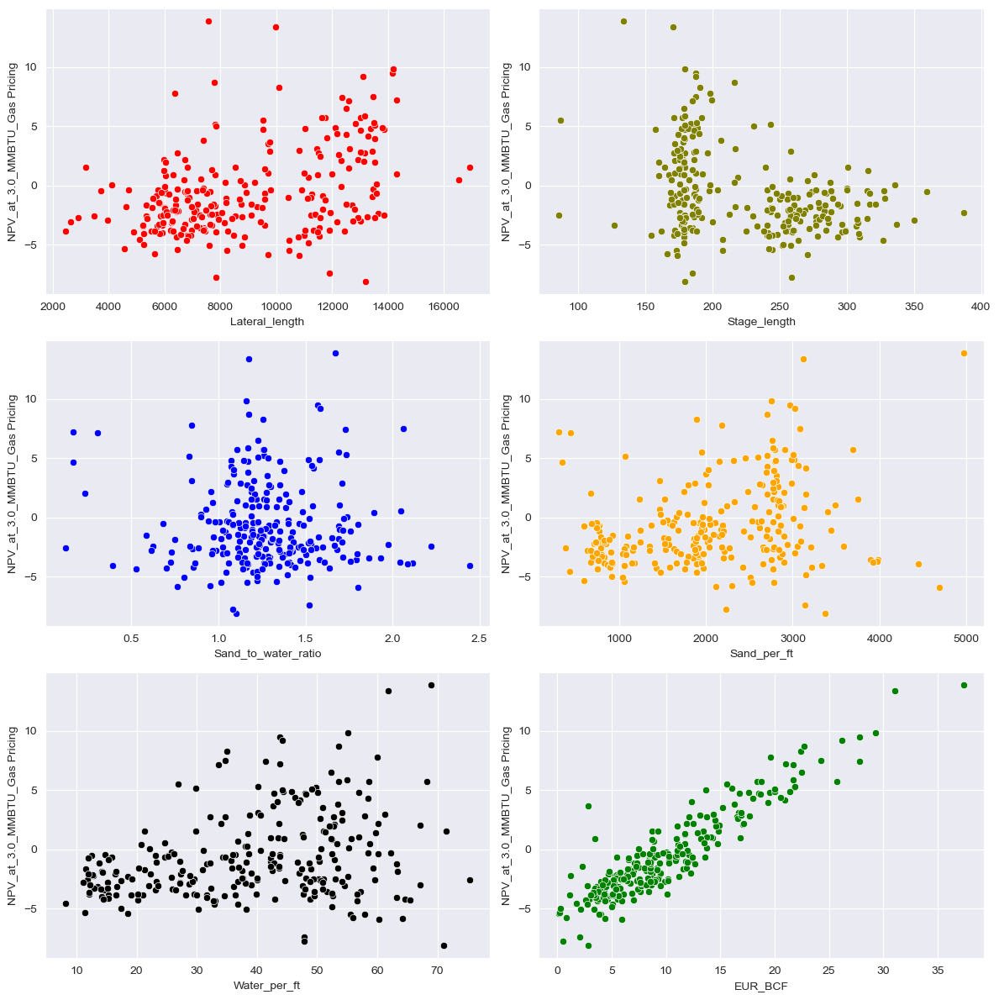

In [25]:
f, axes = plt.subplots(3, 2, figsize = (12, 12))

sns.scatterplot(x = df['Lateral_length'], y = df['NPV_at_3.0_MMBTU_Gas Pricing'],
                color = "red", ax = axes[0, 0])

sns.scatterplot(x = df['Stage_length'], y = df['NPV_at_3.0_MMBTU_Gas Pricing'],
                color = "olive", ax = axes[0, 1])

sns.scatterplot(x = df['Sand_to_water_ratio'], y = df['NPV_at_3.0_MMBTU_Gas Pricing'],
                color = "blue", ax = axes[1, 0])

sns.scatterplot(x = df['Sand_per_ft'], y = df['NPV_at_3.0_MMBTU_Gas Pricing'],
                color = "orange", ax = axes[1, 1])

sns.scatterplot(x = df['Water_per_ft'], y = df['NPV_at_3.0_MMBTU_Gas Pricing'],
                color = "black", ax = axes[2, 0])

sns.scatterplot(x = df['EUR_BCF'], y = df['NPV_at_3.0_MMBTU_Gas Pricing'],
                color = "green", ax = axes[2, 1])

plt.tight_layout()

<Axes: >

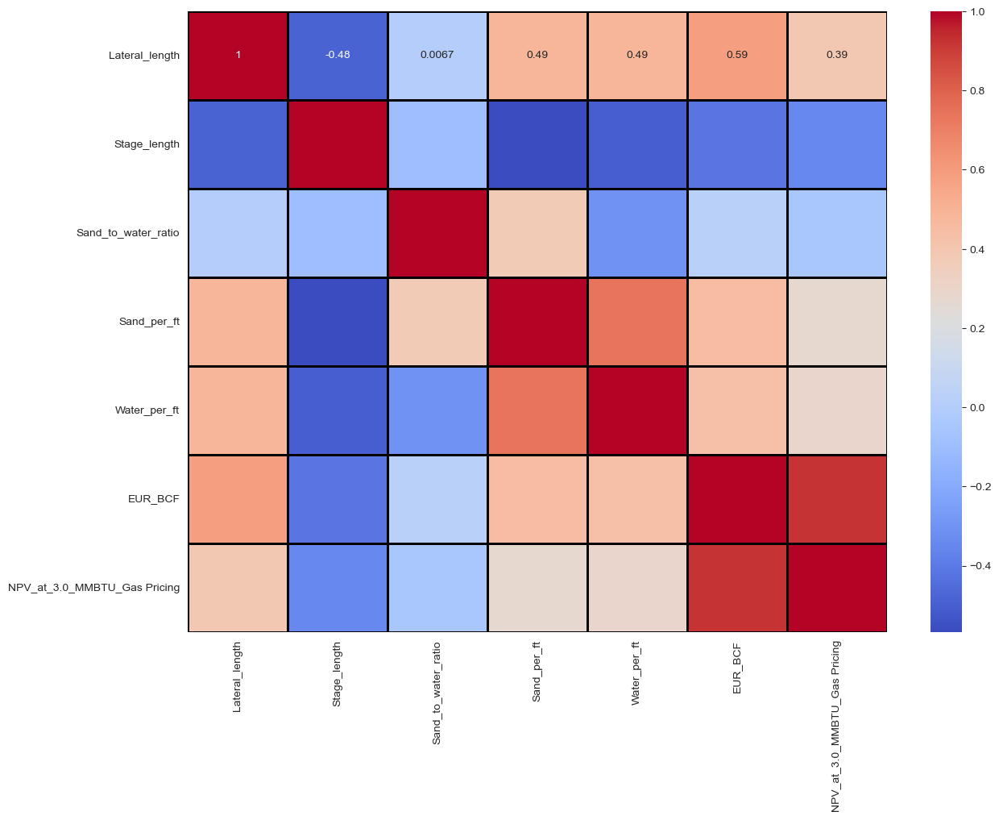

In [26]:
plt.figure(figsize = (14,10))
sns.heatmap(df.corr(), linewidths = 2, linecolor = 'black',
            cmap = 'coolwarm', annot = True)

* Since gradient boosting is a tree-based algorithm, no normalization will be
needed.

* Therefore, let’s define the x and y variables as follows:

In [27]:
x = df.drop(['NPV_at_3.0_MMBTU_Gas Pricing'], axis = 1)

y = df['NPV_at_3.0_MMBTU_Gas Pricing']

In [28]:
from sklearn.model_selection import train_test_split
seed = 1000
np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)

In [31]:
from sklearn.ensemble import GradientBoostingRegressor
np.random.seed(seed)

gb = GradientBoostingRegressor(loss = 'squared_error', learning_rate = 0.1,
                               n_estimators = 100, criterion = 'friedman_mse',
                               min_samples_split = 4, min_samples_leaf = 2,
                               max_depth = 3, max_features = None)

In [32]:
gb.fit(X_train,y_train)
y_pred_train = gb.predict(X_train)
y_pred_test = gb.predict(X_test)

In [33]:
corr_train = np.corrcoef(y_train, y_pred_train) [0,1]

print('Training Data R^2 = ', round(corr_train**2,4),
      ', R = ',round(corr_train,4))

Training Data R^2 =  0.9903 , R =  0.9952


In [34]:
corr_test = np.corrcoef(y_test, y_pred_test) [0,1]

print('Testing Data R^2 = ',round(corr_test**2,4),
      ', R = ', round(corr_test,4))

Testing Data R^2 =  0.9168 , R =  0.9575


Text(0.5, 1.0, 'NPV Training Actual Vs. Prediction')

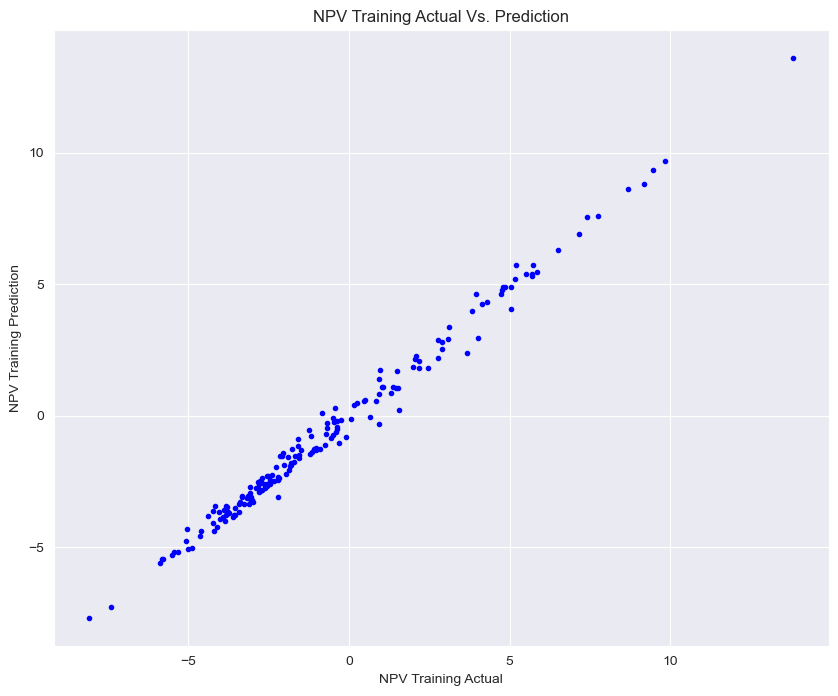

In [35]:
plt.figure(figsize = (10,8))

plt.plot(y_train, y_pred_train, 'b.')
plt.xlabel('NPV Training Actual')
plt.ylabel('NPV Training Prediction')
plt.title('NPV Training Actual Vs. Prediction')

Text(0.5, 1.0, 'NPV Testing Actual Vs. Prediction')

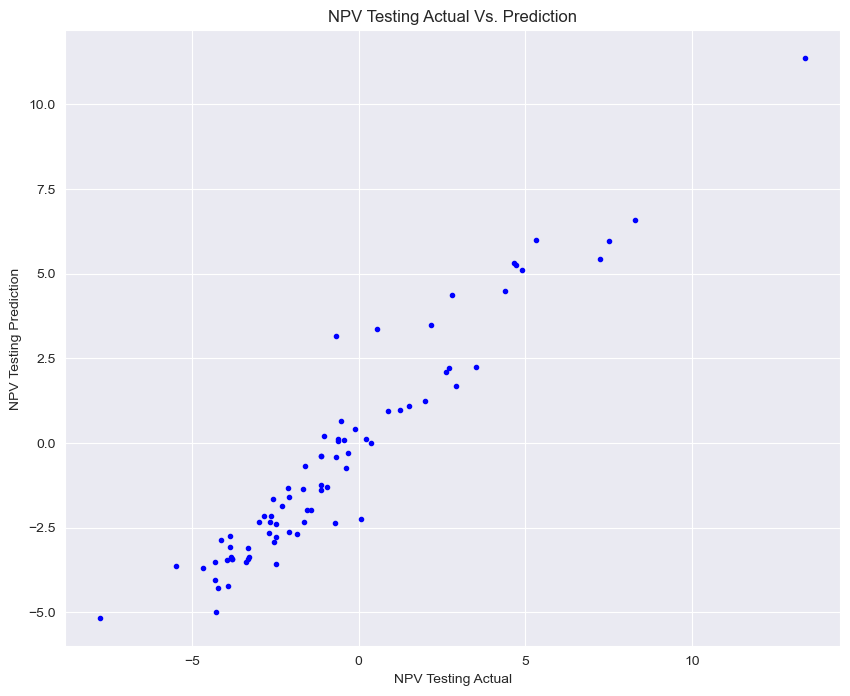

In [36]:
plt.figure(figsize = (10,8))

plt.plot(y_test, y_pred_test, 'b.')
plt.xlabel('NPV Testing Actual')
plt.ylabel('NPV Testing Prediction')
plt.title('NPV Testing Actual Vs. Prediction')

In [37]:
from sklearn import metrics
print('MAE:', round(metrics.mean_absolute_error(y_test,
y_pred_test),5))
print('MSE:', round(metrics.mean_squared_error(y_test,
y_pred_test),5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test,
y_pred_test)),5))

MAE: 0.76514
MSE: 1.06659
RMSE: 1.03276


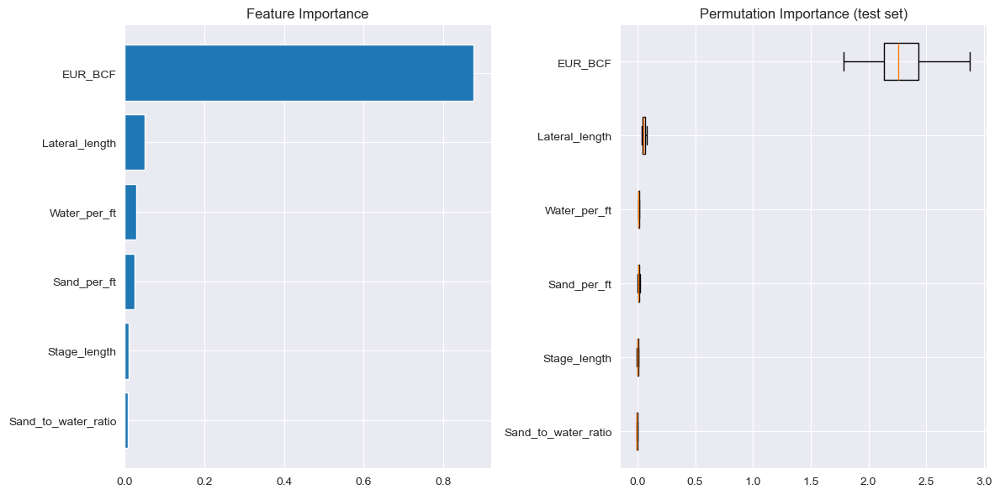

In [38]:
from sklearn.inspection import permutation_importance
feature_importance = gb.feature_importances_

sorted_features = np.argsort(feature_importance)
pos = np.arange(sorted_features.shape[0]) + .5

fig = plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center')

plt.yticks(pos, np.array(df.columns)[sorted_features])

plt.title('Feature Importance')

result = permutation_importance(gb, X_test, y_test, n_repeats = 10,
                                random_state = seed)

sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False, labels = np.array(df.columns)[sorted_idx])
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

Let's break down this code into its main components, step by step:

### 1. **Importing Libraries and Data**
```python
from sklearn.inspection import permutation_importance
```
- This imports the `permutation_importance` function from scikit-learn, which is used to assess feature importance by calculating how the model's performance decreases when the values of a feature are randomly shuffled.

### 2. **Feature Importance from the Model**
```python
feature_importance = gb.feature_importances_
```
- After training the `GradientBoostingRegressor` model (`gb`), we can extract the importance of each feature using the `feature_importances_` attribute. This provides the importance scores for all features used in the model.

### 3. **Sorting Feature Importances**
```python
sorted_features = np.argsort(feature_importance)
```
- This sorts the indices of the features by their importance. `np.argsort()` returns the indices that would sort the array, so you get the positions of features from least important to most important.

### 4. **Creating Positioning for Bars**
```python
pos = np.arange(sorted_features.shape[0]) + .5
```
- `np.arange(sorted_features.shape[0])` creates an array with the same length as the number of features (to position each feature on the y-axis). Adding `0.5` centers the bars on the y-axis for better visual alignment.

### 5. **Plotting Feature Importance Bar Chart**
```python
fig = plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center')

plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')
```
- A horizontal bar plot is created to visualize feature importance.
    - `plt.barh()` is used to create the horizontal bar chart.
    - `feature_importance[sorted_features]` ensures that the features are plotted in ascending order of importance.
    - `plt.yticks()` labels the bars with the corresponding feature names from the dataframe (`df.columns`).
    - `plt.title()` adds a title to the chart.

### 6. **Permutation Importance Calculation**
```python
result = permutation_importance(gb, X_test, y_test, n_repeats = 10,
                                random_state = seed)
```
- Permutation importance is calculated by randomly shuffling each feature of the test set (`X_test`) and observing the effect on the model's performance (using the test targets `y_test`). 
    - `n_repeats=10` specifies that each feature will be shuffled 10 times to reduce noise and improve the estimate.
    - `random_state=seed` ensures reproducibility by controlling randomness.

### 7. **Sorting Permutation Importances**
```python
sorted_idx = result.importances_mean.argsort()
```
- The permutation importances are sorted by the mean importance of each feature, using `result.importances_mean.argsort()`.

### 8. **Plotting Permutation Importance Box Plot**
```python
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False, labels = np.array(df.columns)[sorted_idx])
plt.title("Permutation Importance (test set)")
```
- A box plot is created for the permutation importance.
    - `plt.boxplot(result.importances[sorted_idx].T)` plots the distribution of the importances across the 10 repetitions for each feature.
    - `vert=False` makes the box plot horizontal.
    - `labels=np.array(df.columns)[sorted_idx]` labels the box plot with feature names.
    - `plt.title()` adds a title to the box plot.

### 9. **Final Layout and Display**
```python
fig.tight_layout()
plt.show()
```
- `fig.tight_layout()` adjusts the layout so that subplots do not overlap.
- `plt.show()` displays the plot.

### Summary of the Code:
1. **Feature Importance Bar Plot**: 
   - Shows the importance of each feature as determined by the `GradientBoostingRegressor`.
   
2. **Permutation Importance Box Plot**:
   - Shows how much the model's performance changes when the values of each feature are randomly shuffled (calculated on the test set), visualized through box plots for each feature.

Both plots are displayed side-by-side for easy comparison.

In [39]:
result

{'importances_mean': array([ 5.62673558e-02,  4.21978379e-03, -1.68587786e-03,  1.08985184e-02,
         1.29103662e-02,  2.28967526e+00]),
 'importances_std': array([0.01485314, 0.00449182, 0.00290839, 0.00638356, 0.00391517,
        0.27624977]),
 'importances': array([[ 8.15151462e-02,  3.95292772e-02,  7.02221645e-02,
          3.65059457e-02,  6.03294438e-02,  4.96642294e-02,
          5.30148570e-02,  5.79832600e-02,  3.92243716e-02,
          7.46848629e-02],
        [ 7.44887785e-03,  9.59443016e-03,  2.58807132e-03,
         -1.38147086e-03, -1.05835466e-03,  9.27570663e-03,
          5.14050355e-03,  4.35297088e-03, -2.86902680e-03,
          9.10612984e-03],
        [ 4.48758354e-03,  1.25757307e-03, -2.61008665e-03,
         -1.66488246e-03, -5.10349406e-03, -3.54065341e-03,
         -4.17053339e-03,  1.94360646e-04, -5.02201479e-03,
         -6.86631090e-04],
        [ 2.16017350e-02,  1.38400077e-02,  1.45205740e-02,
          1.05278583e-02,  9.32294255e-04,  1.76246999e

In [40]:
from sklearn.model_selection import cross_val_score
np.random.seed(seed)

scores_R2 = cross_val_score(gb, x, y,cv = 10, scoring = 'r2')
print(" R2_Cross-validation scores: {}". format(scores_R2))

 R2_Cross-validation scores: [0.8862245  0.87216255 0.76550356 0.946582   0.94277734 0.89203469
 0.54233081 0.9442973  0.93938502 0.80444424]


In [41]:
print(" Average R2_Cross-validation scores: {}".
format(scores_R2.mean()))

 Average R2_Cross-validation scores: 0.8535741998748938


# Extreme Gradient Boosting (XGBoost)

XGBoost is a supervised machine learning algorithm used for both classification and regression tasks. It builds upon the principles of gradient boosting, with some key distinctions:

- **Regularization**: XGBoost applies L1 and L2 regularization, helping to reduce overfitting and improve model generalization.
- **Gradient Calculation**: Unlike standard gradient boosting, which uses the first partial derivative of the loss function, XGBoost uses the second partial derivative, providing better information about the direction of the gradient.
- **Speed**: XGBoost is faster than traditional gradient boosting due to parallelized tree construction.
- **Handling Missing Values**: XGBoost can manage missing data efficiently, reducing the time spent on data preparation.


# Extreme gradient boosting implementation using scikit-learn

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style("darkgrid")
df = pd.read_excel('Chapter5_NPV_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Lateral_length,258.0,8911.663566,2995.195633,2439.500000,6433.225000,8089.450000,11582.100000,16918.400000
Stage_length,258.0,223.834920,52.900698,85.600003,178.830607,204.708946,263.308520,386.754534
Sand_to_water_ratio,258.0,1.268741,0.338050,0.119433,1.108849,1.249180,1.437271,2.442476
Sand_per_ft,258.0,2066.112041,903.288312,310.728368,1416.164360,2027.515360,2777.796760,4964.854720
Water_per_ft,258.0,39.069433,15.740073,8.118385,26.593500,40.575506,51.229328,75.340213
EUR_BCF,258.0,9.795406,6.193401,0.173786,5.212174,8.570267,12.465853,37.375668
NPV_at_3.0_MMBTU_Gas Pricing,258.0,-0.634117,3.631055,-8.092757,-3.107133,-1.587870,1.061966,13.828945


In [2]:
x = df.drop(['NPV_at_3.0_MMBTU_Gas Pricing'], axis = 1)

y = df['NPV_at_3.0_MMBTU_Gas Pricing']

In [3]:
from sklearn.model_selection import train_test_split
seed = 1000
np.random.seed(seed)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)

In [8]:
from xgboost import XGBRegressor

np.random.seed(seed)
xgb = XGBRegressor(objective  = 'reg:squarederror', n_estimators = 200,
                   reg_lambda = 1, gamma = 0, max_depth = 3, learning_rate = 0.1,
                   reg_alpha = 0.1)

In [9]:
xgb.fit(X_train,y_train)
y_pred_train = xgb.predict(X_train)
y_pred_test = xgb.predict(X_test)

In [10]:
corr_train = np.corrcoef(y_train, y_pred_train) [0,1]
print('Training Data R^2 = ', round(corr_train**2,4),
      ', R = ', round(corr_train,4))

Training Data R^2 =  0.996 , R =  0.998


In [11]:
corr_train = np.corrcoef(y_test, y_pred_test) [0,1]
print('Training Data R^2 = ', round(corr_train**2,4),
      ', R = ', round(corr_train,4))

Training Data R^2 =  0.9135 , R =  0.9558


Text(0.5, 1.0, 'NPV Training Actual Vs. Prediction')

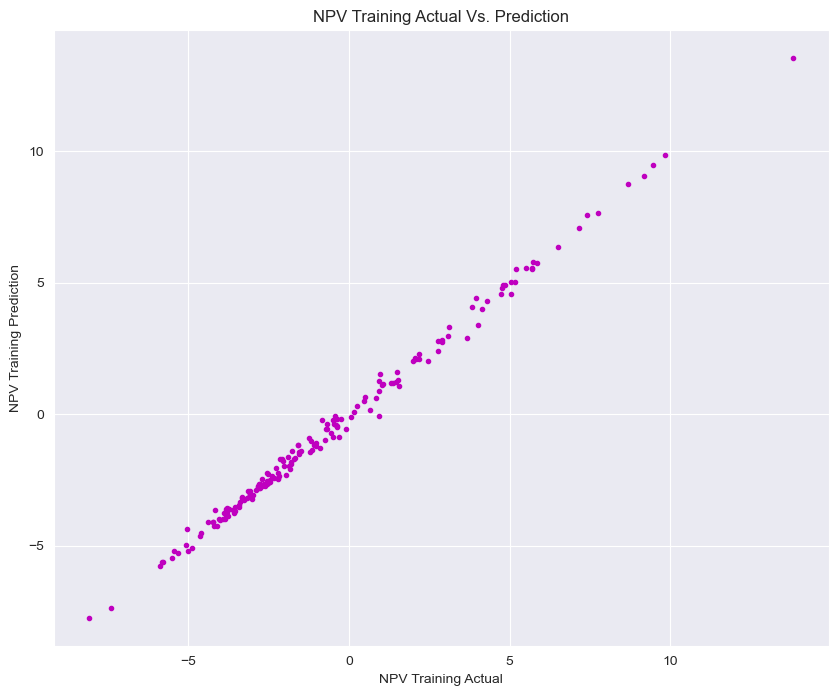

In [12]:
plt.figure(figsize = (10,8))

plt.plot(y_train, y_pred_train, 'm.')
plt.xlabel('NPV Training Actual')
plt.ylabel('NPV Training Prediction')
plt.title('NPV Training Actual Vs. Prediction')

Text(0.5, 1.0, 'NPV Testing Actual Vs. Prediction')

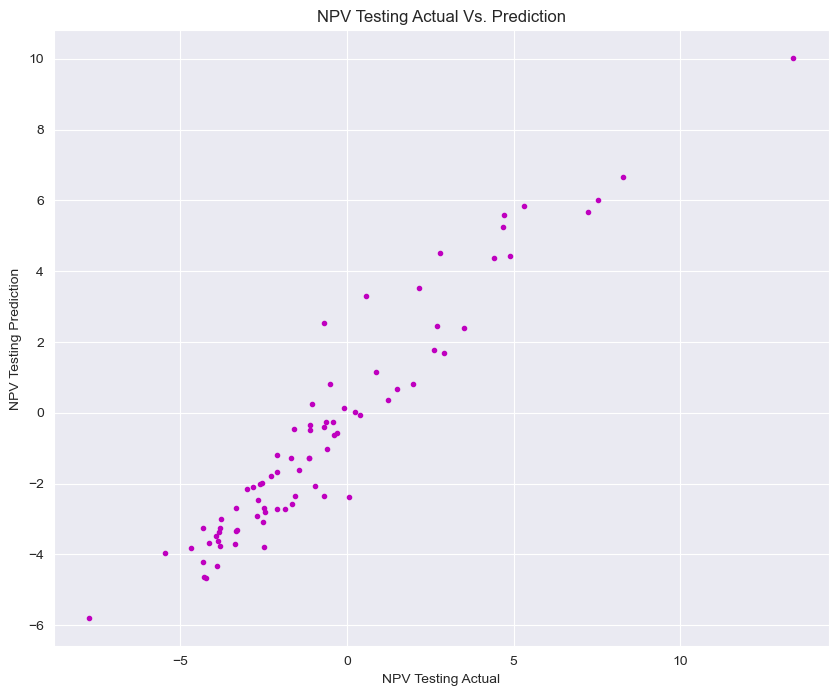

In [13]:
plt.figure(figsize = (10,8))

plt.plot(y_test, y_pred_test, 'm.')
plt.xlabel('NPV Testing Actual')
plt.ylabel('NPV Testing Prediction')
plt.title('NPV Testing Actual Vs. Prediction')

In [14]:
from sklearn import metrics
print('MAE:', round(metrics.mean_absolute_error(y_test,
y_pred_test),5))
print('MSE:', round(metrics.mean_squared_error(y_test, y_pred_test),5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test,
y_pred_test)),5))

MAE: 0.78695
MSE: 1.08847
RMSE: 1.0433


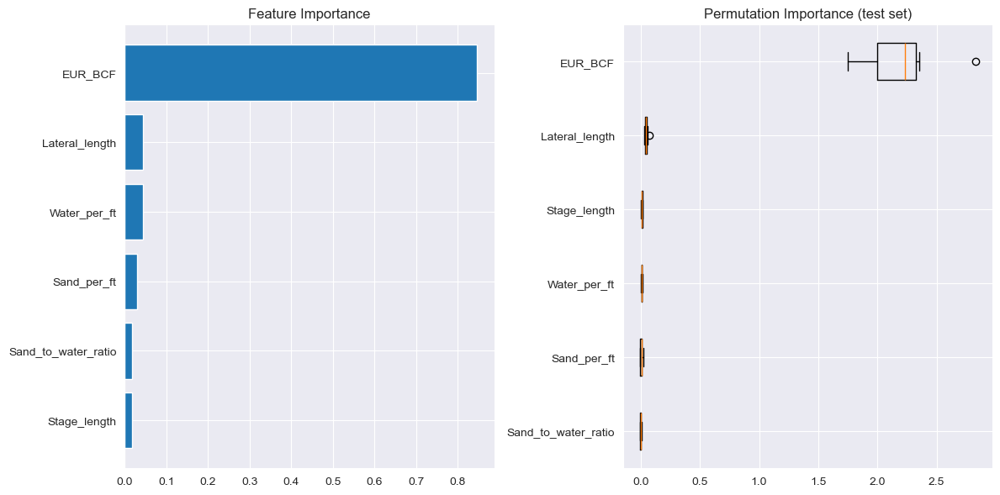

In [15]:
from sklearn.inspection import permutation_importance
feature_importance = xgb.feature_importances_
sorted_features = np.argsort(feature_importance)
pos = np.arange(sorted_features.shape[0]) + .5

fig = plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center')
plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')

result = permutation_importance(xgb, X_test, y_test, n_repeats = 10,
                                random_state = seed)

sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False,
            labels = np.array(df.columns)[sorted_idx])

plt.title("Permutation Importance (test set)")
fig.tight_layout()

In [16]:
from sklearn.model_selection import cross_val_score
np.random.seed(seed)
scores_R2 = cross_val_score(xgb, x, y,cv = 10,scoring = 'r2')
print(" R2_Cross-validation scores: {}". format(scores_R2))

 R2_Cross-validation scores: [0.89362209 0.85932    0.85258735 0.94269802 0.94402699 0.87789333
 0.44435288 0.95794781 0.9266069  0.79884286]


In [17]:
print(" Average R2_Cross-validation scores: {}".
format(scores_R2.mean()))

 Average R2_Cross-validation scores: 0.849789823719046


# Adaptive Gradient Boosting (AdaBoost)

Adaptive Gradient Boosting, or **AdaBoost**, is a supervised machine learning boosting algorithm that adjusts the sample weights based on prediction difficulty. Unlike Gradient Boosting, where models focus on the residual errors without modifying the data distribution, AdaBoost increases the importance (weights) of incorrectly predicted instances during training. 

Key concepts:
- **Weak Learner**: A classifier that performs slightly better than random guessing.
- **Strong Learner**: A classifier with a higher correlation to true classification.
- AdaBoost modifies the distribution of the training dataset, prioritizing harder-to-classify observations to improve model performance.


In [18]:
from sklearn.ensemble import AdaBoostRegressor

In [21]:
from sklearn.tree import DecisionTreeRegressor
np.random.seed(seed)
agb = AdaBoostRegressor(estimator =\
        DecisionTreeRegressor(max_depth = None, min_samples_split = 4,
                              min_samples_leaf = 2), n_estimators = 200,
                        learning_rate = 0.1, loss = 'linear')

In [22]:
agb.fit(X_train,y_train)

y_pred_train = agb.predict(X_train)
y_pred_test = agb.predict(X_test)

corr_train = np.corrcoef(y_train, y_pred_train) [0,1]
print('Training Data R^2 = ', round(corr_train**2,4),
      ', R = ', round(corr_train,4))

Training Data R^2 =  0.9985 , R =  0.9993


In [23]:
corr_test = np.corrcoef(y_test, y_pred_test) [0,1]
print('Testing Data R^2 = ', round(corr_test**2,4),
      ', R = ', round(corr_test,4))

Testing Data R^2 =  0.8914 , R =  0.9442


Text(0.5, 1.0, 'NPV Training Actual Vs. Prediction')

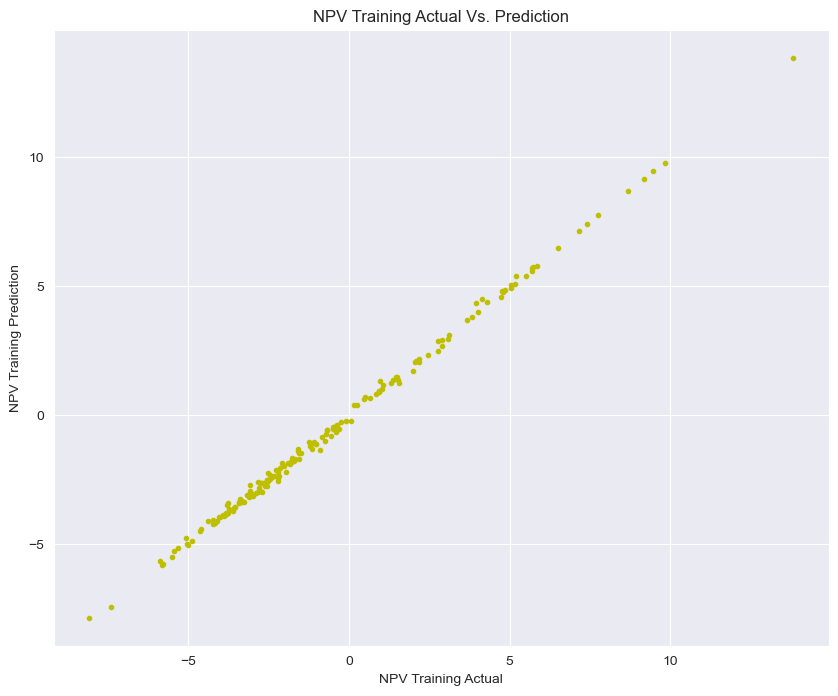

In [24]:
plt.figure(figsize = (10,8))
plt.plot(y_train, y_pred_train, 'y.')
plt.xlabel('NPV Training Actual')
plt.ylabel('NPV Training Prediction')
plt.title('NPV Training Actual Vs. Prediction')

Text(0.5, 1.0, 'NPV Testing Actual Vs. Prediction')

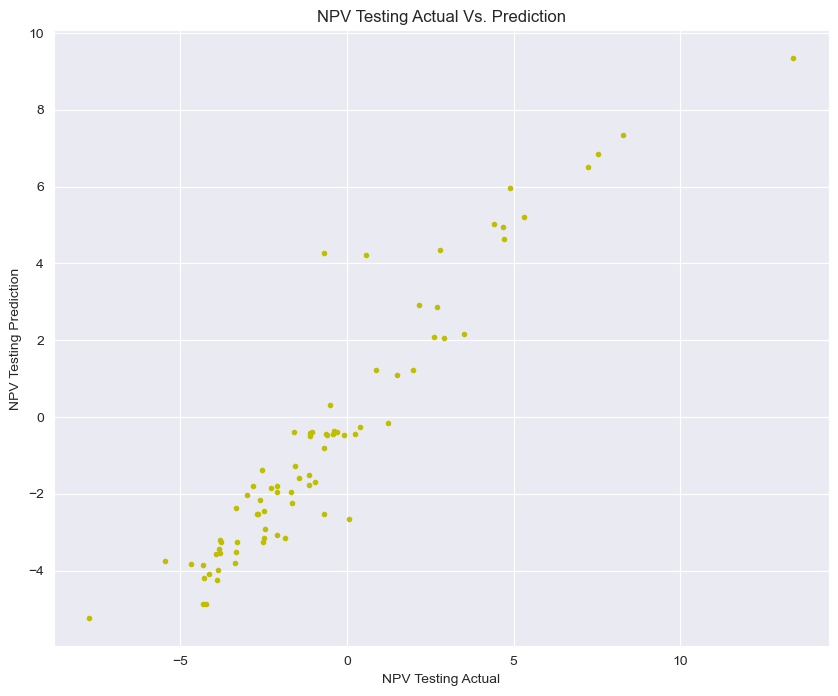

In [25]:
plt.figure(figsize = (10,8))
plt.plot(y_test, y_pred_test, 'y.')
plt.xlabel('NPV Testing Actual')
plt.ylabel('NPV Testing Prediction')
plt.title('NPV Testing Actual Vs. Prediction')

In [26]:
from sklearn import metrics
print('MAE:', round(metrics.mean_absolute_error(y_test,
y_pred_test),5))
print('MSE:', round(metrics.mean_squared_error(y_test,
y_pred_test),5))
print('RMSE:', round(np.sqrt(metrics.mean_squared_error(y_test,
y_pred_test)),5))

MAE: 0.75971
MSE: 1.33816
RMSE: 1.15679


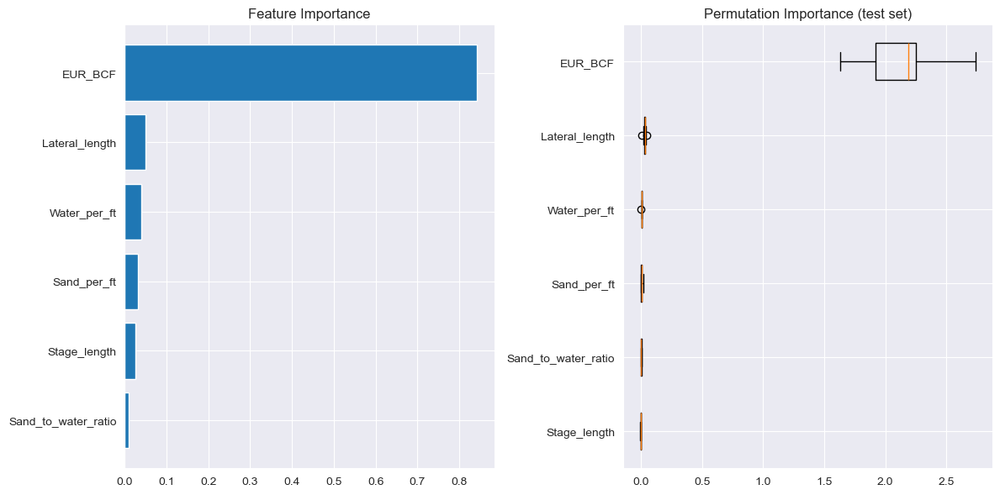

In [27]:
from sklearn.inspection import permutation_importance

feature_importance = agb.feature_importances_
sorted_features = np.argsort(feature_importance)

pos = np.arange(sorted_features.shape[0]) + .5

fig = plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center')
plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')

result = permutation_importance(agb, X_test, y_test,
n_repeats = 10,random_state = seed)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False,
labels = np.array(df.columns)[sorted_idx])
plt.title("Permutation Importance (test set)")
fig.tight_layout()

In [28]:
scores_R2 = cross_val_score(agb, x, y,cv = 10, scoring = 'r2')

print(" R2_Cross-validation scores: {}". format(scores_R2))

 R2_Cross-validation scores: [0.92067749 0.88524837 0.75155833 0.94776459 0.91588846 0.8835633
 0.49947239 0.95121426 0.91546078 0.79248373]


In [29]:
print(" Average R2_Cross-validation scores: {}".
format(scores_R2.mean()))

 Average R2_Cross-validation scores: 0.8463331706464567


# Frac Intensity Classification Example

In this example, we focus on a **classification problem** using machine learning to predict challenging hydraulic fracturing (frac) stages in the Oil & Gas (O&G) industry. The goal is to flag stages that may require more chemicals or effort to treat, providing insight before the frac job begins. This information can be shared with the frac supervisor and consultant to avoid surprises.

The available input features per frac stage include:
- **Measured Depth** (ft)
- **Resistivity** (ohm-m)
- **Young’s Modulus over Poisson’s Ratio (YM/PR)** ($10^6$ psi)
- **Gamma Ray** (gAPI)
- **Minimum Horizontal Stress** (psi)

The output classification:
- **0**: Stages that were not challenging to treat.
- **1**: Stages that were difficult to treat and required additional chemicals.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style("darkgrid")

In [2]:
df= pd.read_excel('Chapter5_Fracability_DataSet.xlsx')
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MD_ft,1000.0,14000.000000,4269.740397,2571.139190,10943.676726,13864.280896,17149.039581,25382.097071
Resistivity,1000.0,500.000000,179.604705,-2.624400,364.746085,497.077253,620.324542,970.103975
YM/PR,1000.0,24.000000,8.388762,4.917917,17.708133,23.399724,29.588017,49.567271
GR,1000.0,300.000000,122.443017,-2.296323,210.515488,302.737171,387.137024,627.305824
Minimum Horizontal Stress Gradient,1000.0,0.926601,0.234990,0.292125,0.747472,0.932445,1.106538,1.508552
Fracability,1000.0,0.500000,0.500250,0.000000,0.000000,0.500000,1.000000,1.000000


C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

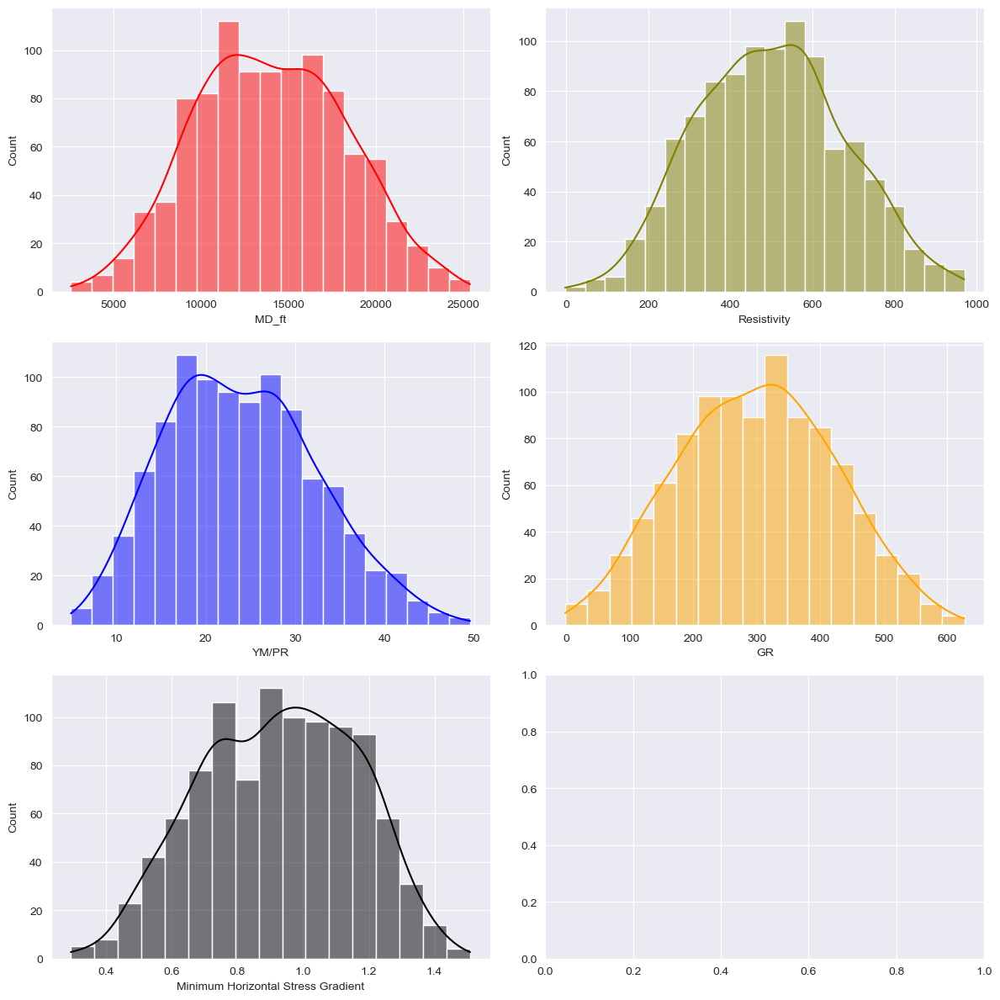

In [3]:
f, axes = plt.subplots(3, 2, figsize = (12, 12))

sns.histplot(df['MD_ft'], color = "red", ax = axes[0, 0], kde = True)
sns.histplot(df['Resistivity'], color = "olive", ax = axes[0, 1], kde = True)
sns.histplot(df['YM/PR'], color = "blue", ax = axes[1, 0], kde = True)
sns.histplot(df['GR'], color = "orange", ax = axes[1, 1], kde = True)
sns.histplot(df['Minimum Horizontal Stress Gradient'], color = "black",
             ax = axes[2, 0], kde = True)

plt.tight_layout()

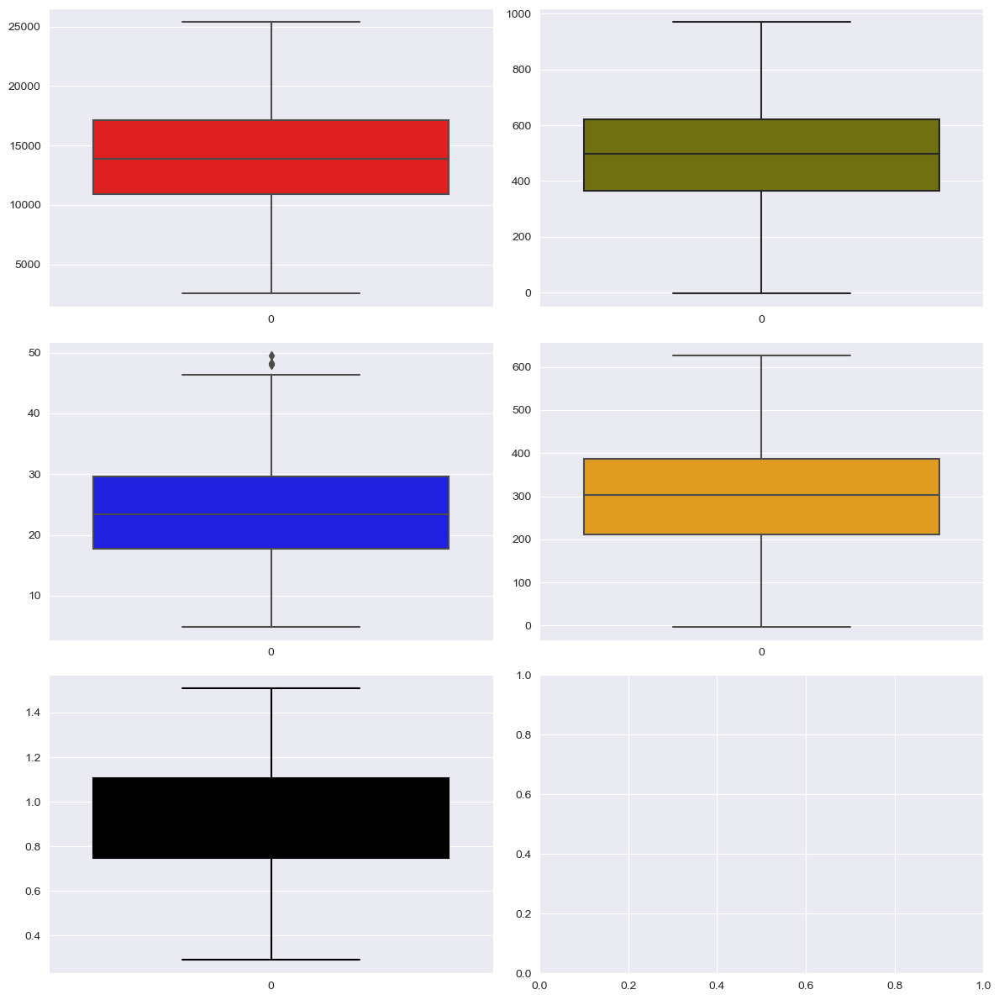

In [4]:
f, axes = plt.subplots(3, 2, figsize = (12, 12))

sns.boxplot(df['MD_ft'], color = "red", ax = axes[0, 0])
sns.boxplot(df['Resistivity'], color = "olive", ax = axes[0, 1])
sns.boxplot(df['YM/PR'], color = "blue", ax = axes[1, 0])
sns.boxplot(df['GR'], color = "orange", ax = axes[1, 1])
sns.boxplot(df['Minimum Horizontal Stress Gradient'],
            color = "black", ax = axes[2, 0])

plt.tight_layout()

Text(0.5, 0, 'Count')

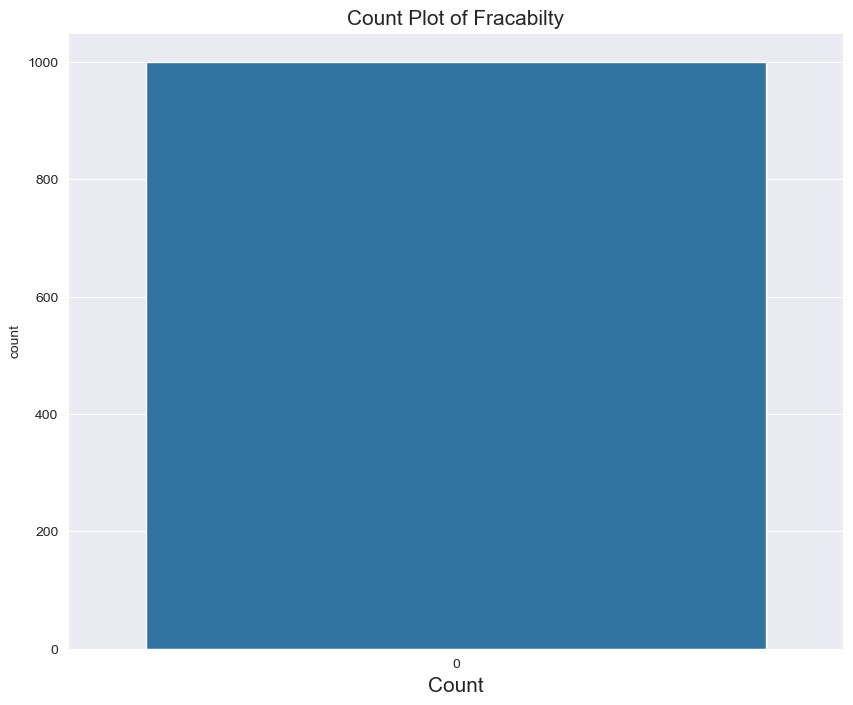

In [5]:
plt.figure(figsize = (10,8))
sns.countplot(df['Fracability'])
plt.title('Count Plot of Fracabilty', fontsize = 15)
plt.xlabel('Categories', fontsize = 15)
plt.xlabel('Count', fontsize = 15)

<Axes: >

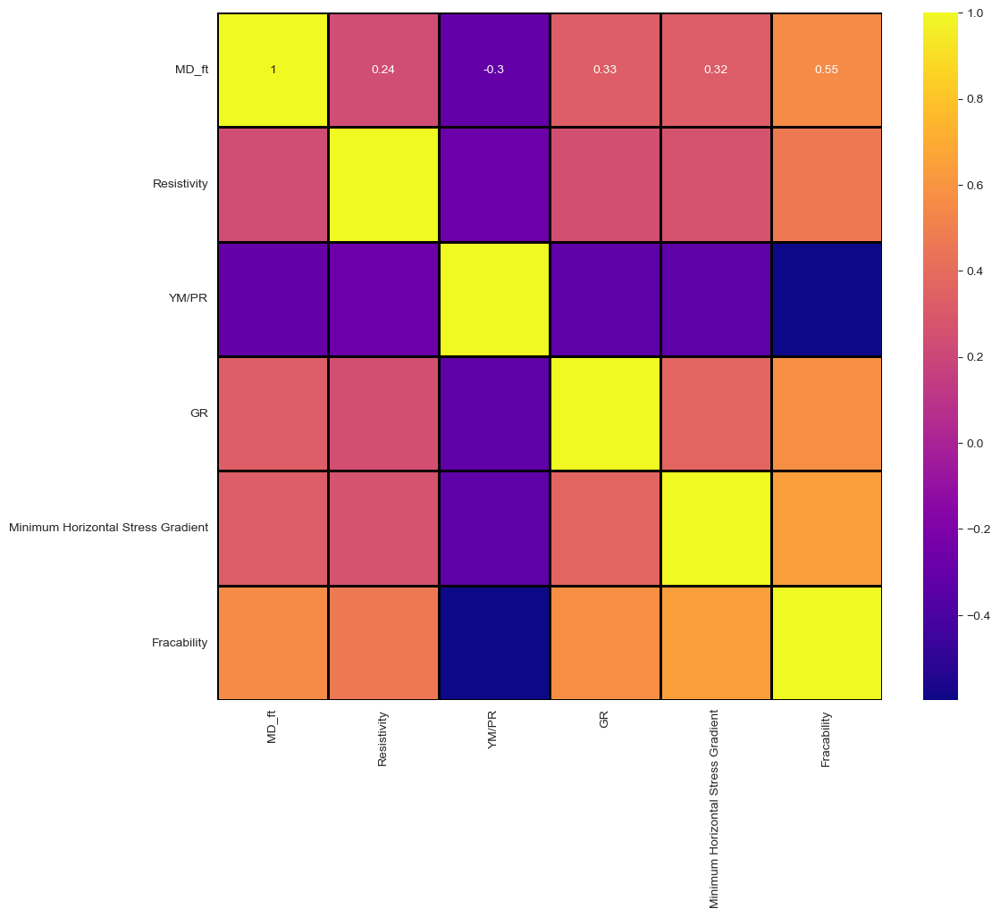

In [6]:
plt.figure(figsize = (12,10))
sns.heatmap(df.corr(),linewidths = 2,
            linecolor = 'black', cmap = 'plasma', annot = True)

C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

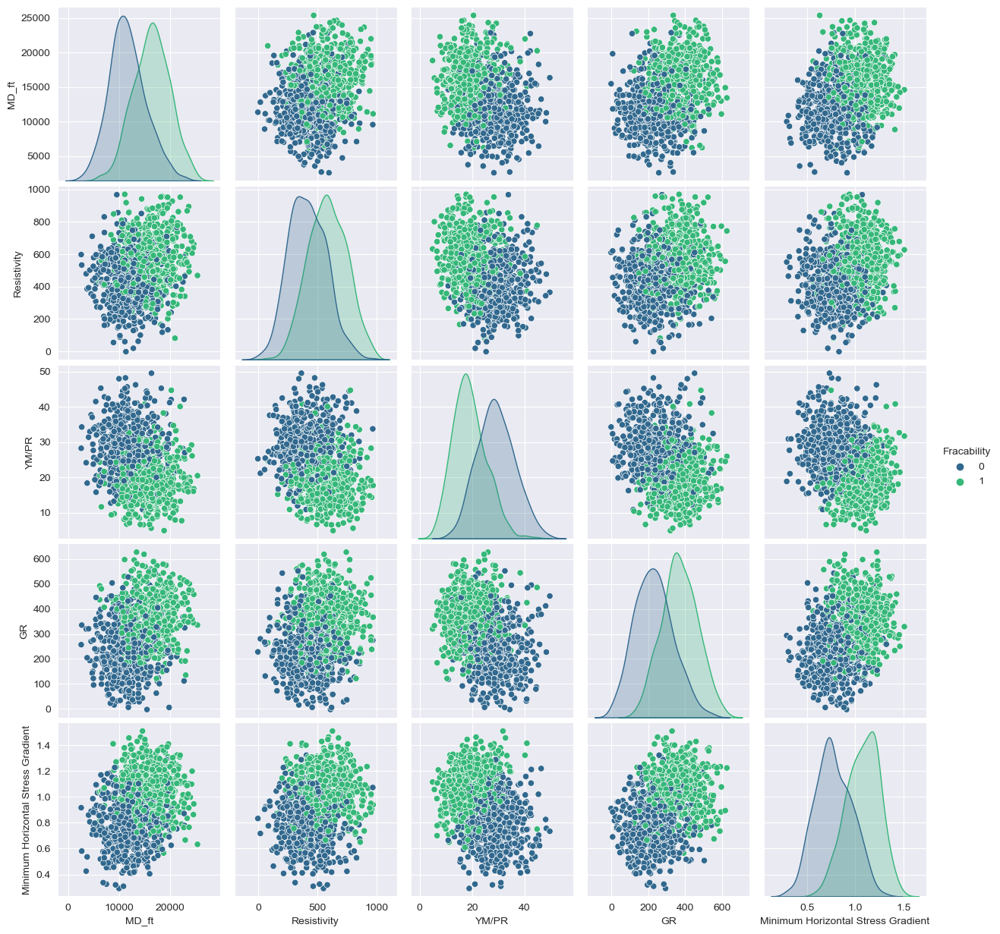

In [8]:
sns.pairplot(df,hue = 'Fracability', palette = "viridis")

In [7]:
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler(feature_range = (0, 1))
y = df['Fracability']
x = df.drop(['Fracability'], axis = 1)
x_scaled = scaler.fit(x)
x_scaled = scaler.transform(x)

In [9]:
seed = 50
np.random.seed(seed)

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_scaled,y,
                                                    test_size = 0.30)

# Support vector machine classification model

Accuracy Score: 0.9366666666666666
Confusion Matrix:
[[138  14]
 [  5 143]]
              precision    recall  f1-score   support

           0       0.97      0.91      0.94       152
           1       0.91      0.97      0.94       148

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300



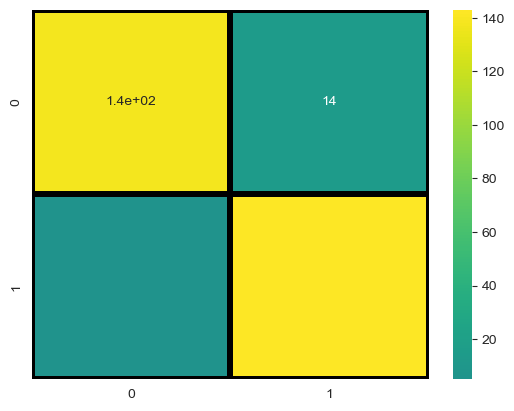

In [10]:
from sklearn import svm
np.random.seed(seed)
svm = svm.SVC(C = 1.0, kernel = 'rbf', degree = 3, gamma = 1, tol = 0.001)
svm.fit(x_train, y_train)

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

y_pred = svm.predict(x_test)
cm = confusion_matrix(y_test, y_pred)

print('Accuracy Score:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:')
print(cm)
print(classification_report(y_test, y_pred))

sns.heatmap(cm, center = True, annot = True, cmap = 'viridis',
            linewidths = 3, linecolor = 'black')
plt.show()

# Random forest classification model

Accuracy Score: 0.92
Confusion Matrix:
[[135  17]
 [  7 141]]
              precision    recall  f1-score   support

           0       0.95      0.89      0.92       152
           1       0.89      0.95      0.92       148

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300



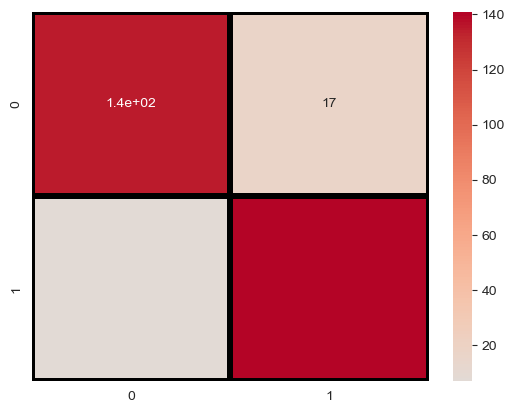

In [21]:
from sklearn.ensemble import RandomForestClassifier
np.random.seed(seed)

rf = RandomForestClassifier(n_estimators = 5000, criterion = 'gini',
                            max_depth = None, min_samples_split = 2, 
                            min_samples_leaf = 5, max_features = 1.0)

rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)
cm = confusion_matrix(y_test, y_pred)
print('Accuracy Score:',accuracy_score(y_test, y_pred))
print('Confusion Matrix:')
print(cm)
print(classification_report(y_test, y_pred))
sns.heatmap(cm, center = True, annot = True, cmap = 'coolwarm',
            linewidths = 3, linecolor = 'black')
plt.show()

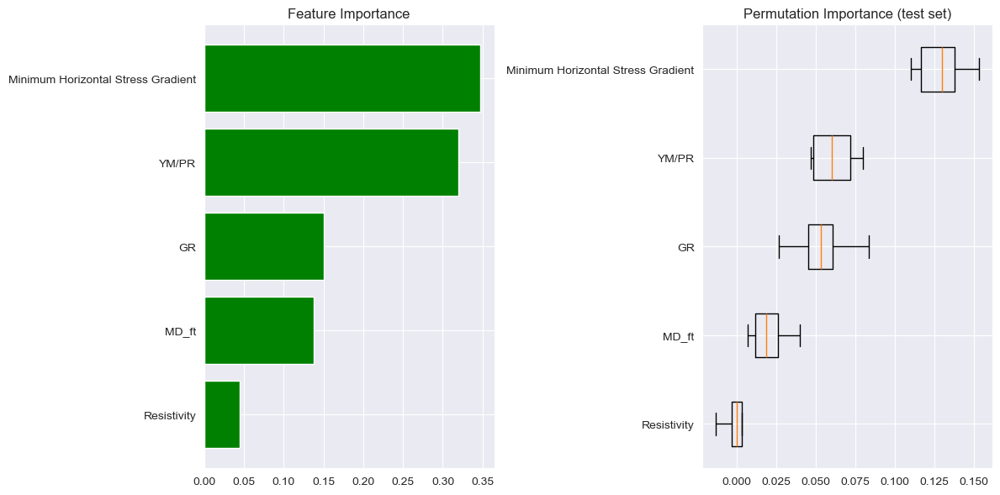

In [18]:
from sklearn.inspection import permutation_importance
feature_importance = rf.feature_importances_
sorted_features = np.argsort(feature_importance)
pos = np.arange(sorted_features.shape[0]) + .5
fig = plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center', color = 'green')
plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')

result = permutation_importance(rf, x_test, y_test, 
                                n_repeats = 10, random_state = seed)

sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False,
            labels = np.array(df.columns)[sorted_idx])

plt.title("Permutation Importance (test set)")
fig.tight_layout()

In [22]:
from sklearn.model_selection import cross_val_score

np.random.seed(seed)
scores = cross_val_score(rf, x_scaled, y,cv = 10,scoring = 'accuracy')
print("Cross-validation scores: {}". format(scores))
print("Average cross-validation score: {}". format(scores.mean()))

Cross-validation scores: [0.95 0.93 0.92 0.9  0.89 0.94 0.92 0.93 0.92 0.93]
Average cross-validation score: 0.923


# Extra trees classification model

Accuracy Score: 0.9366666666666666
Confusion Matrix:
[[139  13]
 [  6 142]]
              precision    recall  f1-score   support

           0       0.96      0.91      0.94       152
           1       0.92      0.96      0.94       148

    accuracy                           0.94       300
   macro avg       0.94      0.94      0.94       300
weighted avg       0.94      0.94      0.94       300



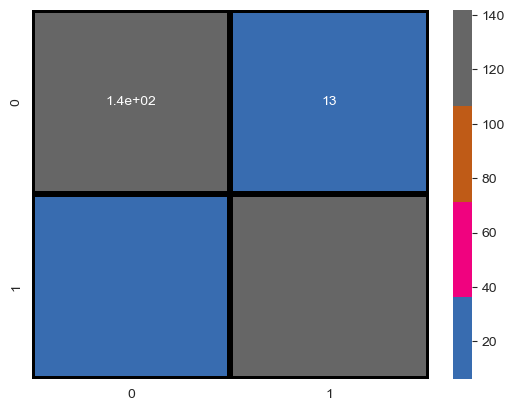

In [23]:
from sklearn.ensemble import ExtraTreesClassifier
np.random.seed(seed)

et = ExtraTreesClassifier(n_estimators = 5000, criterion = 'gini',
                          max_depth = None, min_samples_split = 2, 
                          min_samples_leaf = 5, max_features = 1.0)

et.fit(x_train, y_train)
y_pred = et.predict(x_test)

cm = confusion_matrix(y_test, y_pred)
print('Accuracy Score:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:')
print(cm)
print(classification_report(y_test, y_pred))
sns.heatmap(cm, center = True, annot = True, cmap = 'Accent',
            linewidths = 3, linecolor = 'black')

plt.show()

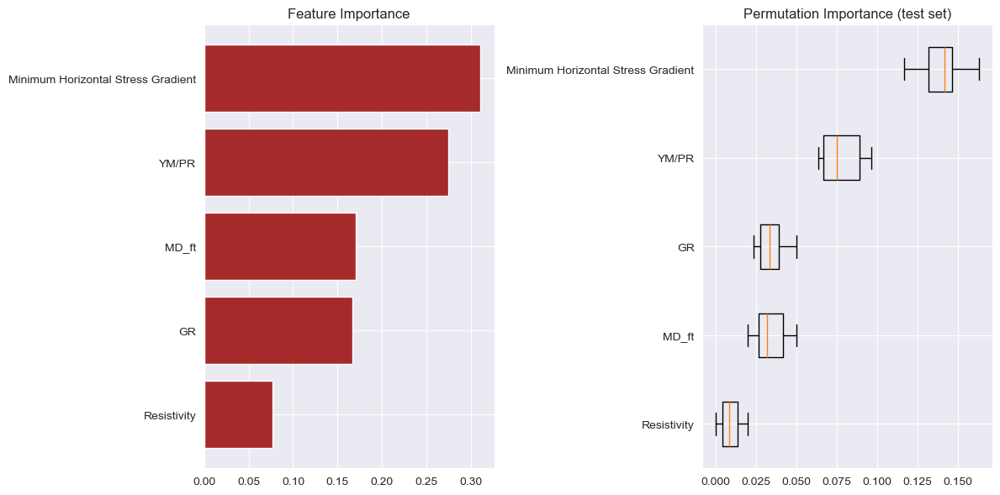

In [25]:
from sklearn.inspection import permutation_importance

feature_importance = et.feature_importances_
sorted_features = np.argsort(feature_importance)

pos = np.arange(sorted_features.shape[0]) + .5
fig = plt.figure(figsize = (12, 6))

plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center',
         color = 'brown')
plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')

result = permutation_importance(et, x_test, y_test,
                                n_repeats = 10, random_state = seed)

sorted_idx = result.importances_mean.argsort()

plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False,
            labels = np.array(df.columns)[sorted_idx])

plt.title("Permutation Importance (test set)")
fig.tight_layout()

In [26]:
np.random.seed(seed)

scores = cross_val_score(et, x_scaled, y,cv = 10, scoring = 'accuracy')

print("Cross-validation scores: {}". format(scores))
print("Average cross-validation score: {}". format(scores.mean()))

Cross-validation scores: [0.94 0.94 0.92 0.91 0.91 0.96 0.92 0.93 0.94 0.96]
Average cross-validation score: 0.9329999999999998


# Gradient boosting classification model

Accuracy Score: 0.9266666666666666
Confusion Matrix:
[[137  15]
 [  7 141]]
              precision    recall  f1-score   support

           0       0.95      0.90      0.93       152
           1       0.90      0.95      0.93       148

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300



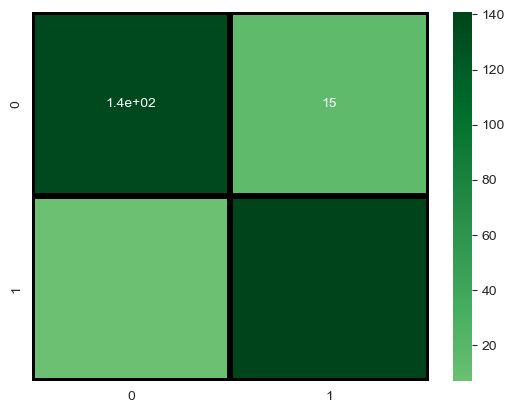

In [28]:
from sklearn.ensemble import GradientBoostingClassifier
np.random.seed(seed)
gb = GradientBoostingClassifier(loss = 'log_loss', learning_rate=0.1, 
                                n_estimators = 2000, criterion = 'friedman_mse',
                                min_samples_split=2, min_samples_leaf = 1,
                                max_depth = 3, max_features = None)

gb.fit(x_train, y_train)
y_pred = gb.predict(x_test)
cm = confusion_matrix(y_test, y_pred)

print('Accuracy Score:',accuracy_score(y_test, y_pred))
print('Confusion Matrix:')
print(cm)
print(classification_report(y_test, y_pred))
sns.heatmap(cm, center = True, annot = True, cmap = 'Greens',
            linewidths = 3, linecolor = 'black')

plt.show()

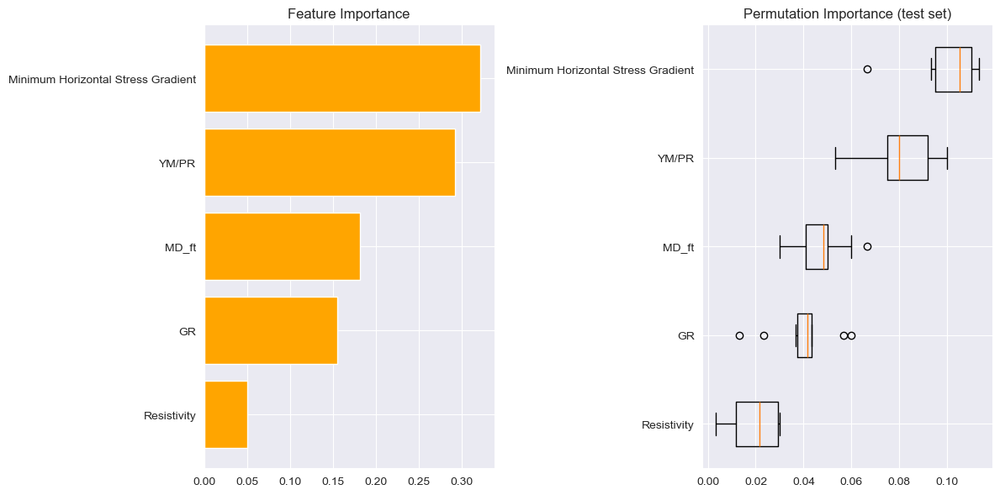

In [29]:
from sklearn.inspection import permutation_importance

feature_importance = gb.feature_importances_
sorted_features = np.argsort(feature_importance)

pos = np.arange(sorted_features.shape[0]) + .5
fig = plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center',
color = 'orange')
plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')

result = permutation_importance(gb, x_test, y_test, n_repeats = 10,
                                random_state = seed)

sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False,
labels = np.array(df.columns)[sorted_idx])
plt.title("Permutation Importance (test set)")
fig.tight_layout()

In [30]:
np.random.seed(seed)
scores = cross_val_score(gb, x_scaled, y,cv = 10,scoring = 'accuracy')

print("Cross-validation scores: {}". format(scores))
print("Average cross-validation score: {}". format(scores.mean()))

Cross-validation scores: [0.96 0.89 0.9  0.91 0.89 0.92 0.9  0.94 0.96 0.95]
Average cross-validation score: 0.9219999999999999


# Extreme gradient boosting classification model

Accuracy Score: 0.93
Confusion Matrix:
[[135  17]
 [  4 144]]
              precision    recall  f1-score   support

           0       0.97      0.89      0.93       152
           1       0.89      0.97      0.93       148

    accuracy                           0.93       300
   macro avg       0.93      0.93      0.93       300
weighted avg       0.93      0.93      0.93       300



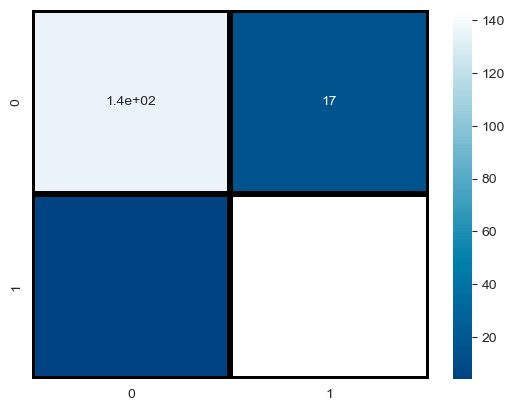

In [31]:
from xgboost import XGBClassifier
np.random.seed(seed)

xgb = XGBClassifier(objective = 'binary:logistic', n_estimators = 5000,
                    reg_lambda = 1, gamma = 0, max_depth = 3,
                    learning_rate = 0.1, alpha = 0.5)

xgb.fit(x_train, y_train)

y_pred = xgb.predict(x_test)
cm = confusion_matrix(y_test, y_pred)

print('Accuracy Score:',accuracy_score(y_test, y_pred))
print('Confusion Matrix:')
print(cm)
print(classification_report(y_test, y_pred))
sns.heatmap(cm, center = True, annot = True, cmap = 'ocean',
            linewidths = 3, linecolor = 'black')

plt.show()

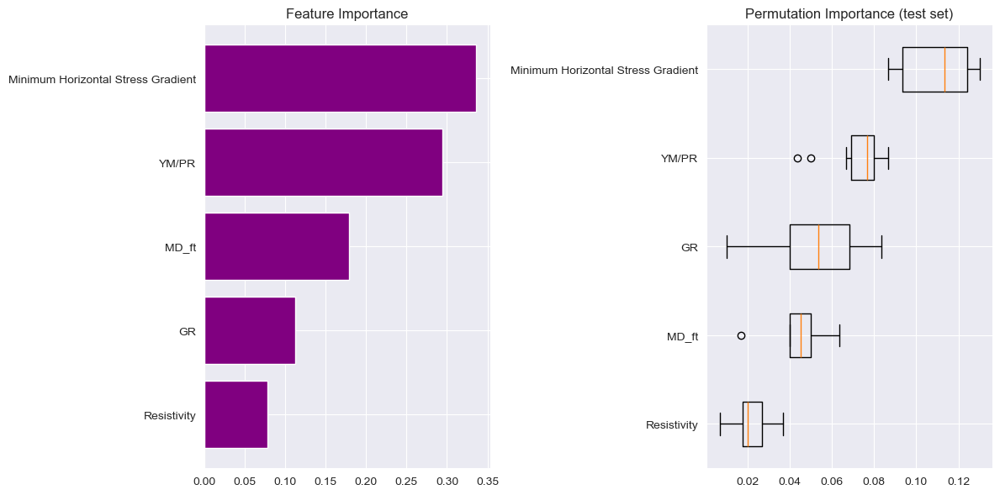

In [32]:
from sklearn.inspection import permutation_importance

feature_importance = xgb.feature_importances_
sorted_features = np.argsort(feature_importance)

pos = np.arange(sorted_features.shape[0]) + .5

fig = plt.figure(figsize = (12, 6))

plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_features], align = 'center',
         color = 'purple')

plt.yticks(pos, np.array(df.columns)[sorted_features])
plt.title('Feature Importance')

result = permutation_importance(xgb, x_test, y_test, n_repeats = 10,
                                random_state = seed)

sorted_idx = result.importances_mean.argsort()

plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T, vert = False,
            labels = np.array(df.columns)[sorted_idx])

plt.title("Permutation Importance (test set)")
fig.tight_layout()

In [33]:
np.random.seed(seed)

scores = cross_val_score(xgb, x_scaled, y,cv = 10, scoring = 'accuracy')

print("Cross-validation scores: {}". format(scores))
print("Average cross-validation score: {}". format(scores.mean()))

Cross-validation scores: [0.92 0.91 0.92 0.9  0.9  0.92 0.92 0.93 0.97 0.95]
Average cross-validation score: 0.924


# Handling Missing Data (Imputation Techniques)

This chapter primarily focuses on supervised algorithms, but an essential aspect of data preprocessing is handling missing data. Below are some common approaches:

1. **Removing Samples with Missing Values:**  
   This is the simplest method, where any samples containing missing values are removed. The downside is a potential drastic reduction in the number of samples, which may negatively impact the model's performance. For example, if 1000 out of 2000 samples are missing an important feature, removing them would cut the data set in half, reducing valuable information.

2. **Replacing Missing Values with Summary Statistics:**  
   Missing values can be replaced with the mean, median, most frequent value, first value after the missing one, or the last value before the missing one. While this method is easy, it is generally not recommended due to the availability of more advanced imputation techniques.

3. **Using Algorithms Like K-Nearest Neighbors (KNN) and MICE:**  
   These algorithms perform well when:
   - There is a relationship between the missing parameters and the existing ones (e.g., if "sand per foot" is missing but "water per foot" is available).
   - Most features with inherent relationships are present.
   
   A challenge is that missing one feature often correlates with missing other important ones, such as "sand loading" and "water loading" in competitor data. For datasets where only a few parameters are missing, **fancyimpute** is a useful Python package, but it is less effective when most features are absent.

   **K-Nearest Neighbors (KNN)** works by assigning a new value based on feature similarity. It is more accurate than simple imputation methods but is computationally expensive as it requires the entire dataset to be stored in memory. KNN is also sensitive to outliers, so it is crucial to standardize the data and remove outliers before use.

   **Key Note:** Always normalize or standardize the data before applying algorithms like KNN and MICE.


# Multivariate Imputation by Chained Equations (MICE)

Multivariate imputation fills in missing values multiple times to create several "complete" datasets. This technique, detailed by Schafer and Graham (2002), bases its imputations on the observed data for individuals and the relationships among variables in the dataset.

MICE is a flexible method that can be applied in a wide variety of situations. Below are the steps involved:

1. **Initial Imputation:**  
   A simple imputation method, such as mean imputation, is used for every missing value. These initial values act as "placeholders" (Azur et al., 2011).

2. **Reintroducing Missing Values:**  
   The placeholder imputation for one variable (denoted as "var") is set back to missing (Azur et al., 2011).

3. **Regression Model Setup:**  
   The variable "var" becomes the dependent variable in a regression model, with all other variables as independent variables (Azur et al., 2011).

4. **Imputation Predictions:**  
   The missing values for "var" are then filled in using predictions from the regression model (Azur et al., 2011).

5. **Cycle Repetition:**  
   Steps 2–4 are repeated for each variable with missing data. This constitutes one iteration or "cycle." By the end of the cycle, all missing values are replaced with predictions that reflect the observed data relationships (Azur et al., 2011).

6. **Final Cycles:**  
   Steps 2–4 are repeated for several cycles, with imputations being updated during each cycle. The number of cycles is user-specified. After the final cycle, the imputed dataset is completed (Azur et al., 2011).


# Fancy impute implementation in Python

# Step 1 - Data Import

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline

df = pd.read_excel('Chapter5_Imputation_DataSet.xlsx')
df.describe()

,Surface Treating Pressure,Slurry Rate,Proppant Concentration
count,4588.000000,4752.000000,4752.000000
mean,8142.469922,99.710795,1.422033
std,85.671249,3.308136,0.703032
min,7913.000000,64.400000,0.000000
25%,8088.000000,99.900000,1.000000
50%,8116.000000,100.300000,1.500000
75%,8193.000000,100.700000,2.000000
max,8708.000000,101.600000,3.500000


# Step 2 - Missing Data Visualization

#### It is important to visualize the missing data in each feature as follows:

<Axes: >

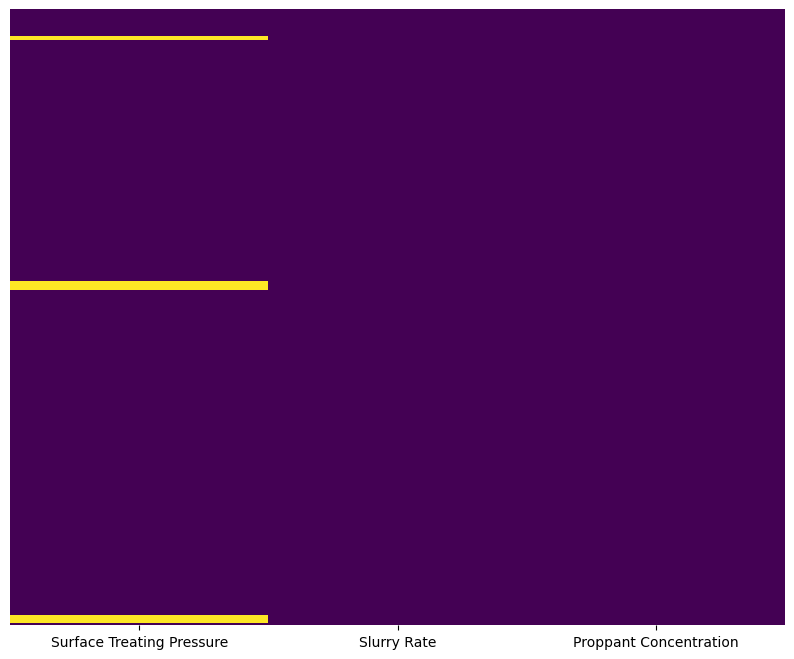

In [3]:
plt.figure(figsize = (10,8))

sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap = 'viridis')

#### Next, let’s visualize the missing data using a slightly different approach using "missingno" library as follows. Please note that this library is used for exploratory visualization of missing data.

<Axes: >

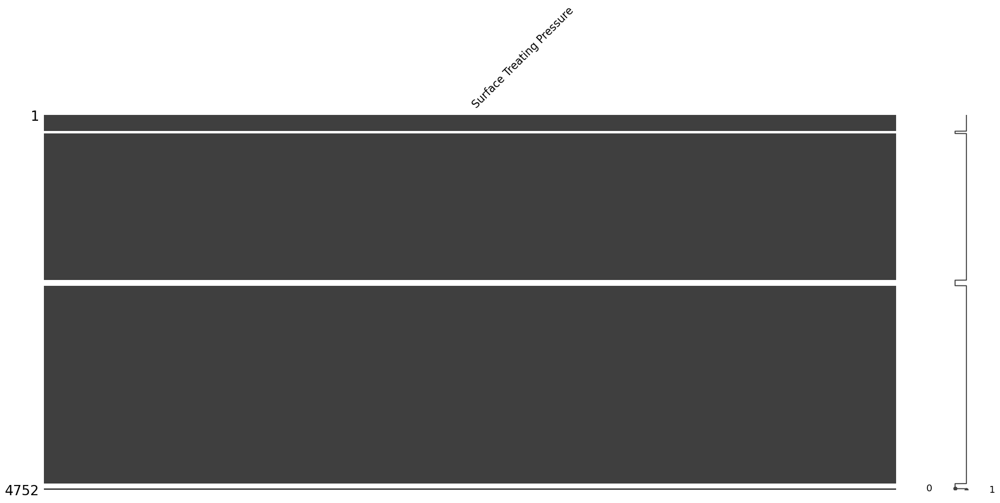

In [6]:
missingdata_df = df.columns[df.isnull().any()].tolist()

msno.matrix(df[missingdata_df])

# Continuation
* Next, `obtain the number of missing values` for each feature (in this exercise, `only surface treating pressure` has missing data) as follows:

In [8]:
missing_val_count_by_column = (df.isnull().sum())

print(missing_val_count_by_column)#[missing_val_count_by_column > 0])

Surface Treating Pressure    164
Slurry Rate                    0
Proppant Concentration         0
dtype: int64


In [9]:
missing_val_count_by_column = (df.isnull().sum())

print(missing_val_count_by_column[missing_val_count_by_column > 0])

Surface Treating Pressure    164
dtype: int64


# Step 3 - Data Standardization

In [10]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df)

df_scaled = pd.DataFrame(df_scaled, columns = ['Surface Treating Pressure',
                         'Slurry Rate', 'Proppant Concentration'])

# Step 4 - Filling the missing data with KNN

In [11]:
from fancyimpute import KNN

X_filled_knn = KNN(k = 2).fit_transform(df_scaled)
X_filled_knn = pd.DataFrame(X_filled_knn, columns = ['Surface Treating Pressure',
                                                     'Slurry Rate',
                                                     'Proppant Concentration'])

X_filled_knn

Imputing row 1/4752 with 0 missing, elapsed time: 1.491
Imputing row 101/4752 with 0 missing, elapsed time: 1.491
Imputing row 201/4752 with 0 missing, elapsed time: 1.491
Imputing row 301/4752 with 0 missing, elapsed time: 1.492
Imputing row 401/4752 with 0 missing, elapsed time: 1.492
Imputing row 501/4752 with 0 missing, elapsed time: 1.492
Imputing row 601/4752 with 0 missing, elapsed time: 1.492
Imputing row 701/4752 with 0 missing, elapsed time: 1.492
Imputing row 801/4752 with 0 missing, elapsed time: 1.493
Imputing row 901/4752 with 0 missing, elapsed time: 1.493
Imputing row 1001/4752 with 0 missing, elapsed time: 1.493
Imputing row 1101/4752 with 0 missing, elapsed time: 1.493
Imputing row 1201/4752 with 0 missing, elapsed time: 1.493
Imputing row 1301/4752 with 0 missing, elapsed time: 1.493
Imputing row 1401/4752 with 0 missing, elapsed time: 1.493
Imputing row 1501/4752 with 0 missing, elapsed time: 1.494
Imputing row 1601/4752 with 0 missing, elapsed time: 1.494
Imputing 

,Surface Treating Pressure,Slurry Rate,Proppant Concentration
0,-2.678786,-10.675047,-2.022926
1,-1.663165,-10.554120,-2.022926
2,-1.091149,-10.433193,-2.022926
3,-0.717588,-10.282035,-2.022926
4,-0.122224,-10.070413,-2.022926
...,...,...,...
4747,-0.682566,-0.003264,-2.022926
4748,-0.659219,0.026968,-2.022926
4749,-0.495785,0.057200,-2.022926
4750,-0.554154,0.057200,-2.022926


# Step 5 - Exporting Data
* Next, since the data were standardized prior to feeding the data into the
KNN imputation algorithm, convert back to its original form and export into a
csv file.

In [15]:
X_filled_knn['Surface Treating Pressure'] =\
(X_filled_knn['Surface Treating Pressure']*df['Surface \
Treating Pressure'].std()) + df['Surface Treating Pressure'].mean()

X_filled_knn['Slurry Rate'] =\
(X_filled_knn['Slurry Rate']*df['Slurry Rate'].std())+df['Slurry Rate'].mean()

X_filled_knn['Proppant Concentration'] =\
(X_filled_knn['Proppant Concentration']*df['Proppant Concentration'].std())+\
df['Proppant Concentration'].mean()

X_filled_knn.to_csv('KNN_Imputation.csv', index = False)

# Step 4 - Filling Missing Data with MICE Algorithm

In [18]:
from impyute.imputation.cs import mice

imputed_training = mice(df_scaled.values)
imputed_training = pd.DataFrame(imputed_training,columns = \
    ['Surface Treating Pressure', 'Slurry Rate', 'Proppant Concentration'])

AttributeError: module 'numpy' has no attribute 'float'.
`np.float` was a deprecated alias for the builtin `float`. To avoid this error in existing code, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

In [22]:
# Patching the Error
np.float = float

In [20]:
from impyute.imputation.cs import mice

imputed_training = mice(df_scaled.values)
imputed_training = pd.DataFrame(imputed_training,columns = \
    ['Surface Treating Pressure', 'Slurry Rate', 'Proppant Concentration'])

# Step 5 - Data Export
* Next, `convert` the data back to its `original form` and `export into an excel` as
follows:

In [21]:
imputed_training['Surface Treating Pressure'] =\
(imputed_training['Surface Treating Pressure']*df['Surface Treating Pressure'].std())\
+ df['Surface Treating Pressure'].mean()

imputed_training['Slurry Rate'] = (imputed_training['Slurry Rate']*\
df['Slurry Rate'].std()) + df['Slurry Rate'].mean()

imputed_training['Proppant Concentration'] =\
(imputed_training['Proppant Concentration']*df['Proppant Concentration'].std())+\
df['Proppant Concentration'].mean()

imputed_training.to_csv('MICE_Imputation.csv', index = False)

## Step 4 - Filling Missing Data with Iterative Imputer

**Iterative Imputer**

* The Iterative Imputer fills in missing values in a **round-robin manner**.

* At each step, one feature column is chosen as the model output, while the remaining columns are treated as inputs.

* A regression model is then trained on the available data (X and Y variables), and the trained model is used to predict the missing values for the output column. 

* This process is repeated for each feature column iteratively and continues for the number of rounds specified by `max_iter`.
                                                                          
* Below is an example of applying the Iterative Imputer to a standardized dataset:
:


In [25]:
from fancyimpute import IterativeImputer

X_filled_ii = IterativeImputer(max_iter = 10).fit_transform(df_scaled)

X_filled_ii = pd.DataFrame(X_filled_ii,columns = ['Surface Treating Pressure',
                                                  'Slurry Rate',
                                                  'Proppant Concentration'])


X_filled_ii['Surface Treating Pressure'] =\
(X_filled_ii['Surface Treating Pressure']*df['Surface Treating Pressure'].std())\
+ df['Surface Treating Pressure'].mean()


X_filled_ii['Slurry Rate'] =\
(X_filled_ii['Slurry Rate']*df['Slurry Rate'].std())+df['Slurry Rate'].mean()


X_filled_ii['Proppant Concentration'] =\
(X_filled_ii['Proppant Concentration']*df['Proppant Concentration'].std())+\
df['Proppant Concentration'].mean()


X_filled_ii.to_csv('Iterative_Imputer_Imputation.csv', index=False)

Let’s use the `iterative imputer` with the exception that it will `run 5 times`
and the `average imputation` will be used as the `final output`.

In [26]:
from fancyimpute import IterativeImputer
XY_incomplete = df_scaled
n_imputations = 5
XY_completed = []


for i in range(n_imputations):
    imputer = IterativeImputer(sample_posterior = True, random_state = i)
    XY_completed.append(imputer.fit_transform(XY_incomplete))


XY_completed_mean = np.mean(XY_completed, 0)
XY_completed_std = np.std(XY_completed, 0)
XY_completed = np.array(XY_completed)

XY_completed_mean = pd.DataFrame(XY_completed_mean,columns =\
                                 ['Surface Treating Pressure', 'Slurry Rate',
                                  'Proppant Concentration'])


XY_completed_mean['Surface Treating Pressure'] =\
(XY_completed_mean['Surface Treating Pressure']*df['Surface \
Treating Pressure'].std()) + df['Surface Treating Pressure'].mean()


XY_completed_mean['Slurry Rate'] = (XY_completed_mean['Slurry Rate']*
df['Slurry Rate'].std()) + df['Slurry Rate'].mean()


XY_completed_mean['Proppant Concentration'] =\
(XY_completed_mean['Proppant Concentration']*df['Proppant Concentration'].std())\
+ df['Proppant Concentration'].mean()


XY_completed_mean.to_csv('Mean_Iterative_Imputer.csv', index = False)

# Regression applications in O&G Industry

**Rate of Penetration (ROP) Optimization Example**

Rate of Penetration (ROP) prediction and optimization is a common regression task in drilling operations. Important features measured while drilling include **hook load**, **RPM**, **torque**, **weight on bit (WOB)**, **differential pressure**, **gamma**, and **ROP**. The primary goal is to maximize ROP, making it the key output feature to predict or optimize.

To achieve this, a supervised regression machine learning model is built with **ROP** as the target output. Once the model is trained, it can predict **ROP** for new wells. Additionally, evolutionary optimization techniques (covered in the last chapter) can be applied to discover the set of input features that maximize ROP.

In this example, data from the **MIP3H** and **5H** wells from the **MSEEL** project is used.

One well was used as the **training dataset**, while the other well was used as a **blind set** to test the model's accuracy and capabilities. **Depth-based data** from the **curve** and **lateral portions** of each well were analyzed, as the focus was on optimizing ROP in these portions. It is highly recommended to use all the drilling data (from **10s or 100s of wells**) across a field of interest to build a more comprehensive model. This example is for **workflow illustration purposes**, and model accuracy can be improved by incorporating more wells and data.

In this example, the curve and lateral portions were combined. However, for larger datasets with multiple wells, a better approach would be to build two separate models for the **curve** and **lateral** portions individually.

### Input Features Used:
- **Hole depth** (measured depth, MD in ft)
- **Hook load** (Klbs)
- **Rotary rpm**
- **Rotary torque** (Klbs-ft)
- **Weight on bit (WOB)** (Klbs)
- **Differential pressure** (psi)
- **Gamma ray at bit** (gAPI)

The **output** of the model is **ROP**, with units in **ft/hr**.


# Step 1 - Data Import
* The first step is to import the necessary libraries and the training data set as
follows:

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

df = pd.read_csv('Chapter5_ROP_DataSet.csv')

In [29]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Hole Depth,7934.0,10487.930804,2289.973781,6524.000,8500.250,10487.500,12469.750,14454.00
Hook Load,7934.0,129.672107,7.724432,107.200,123.800,129.500,134.400,156.40
Rotary RPM,7934.0,65.961054,24.280720,9.000,49.000,70.000,90.000,101.00
Rotary Torque,7934.0,11.459822,3.386672,2.701,9.096,11.373,14.198,20.05
Weight on Bit,7934.0,19.826758,5.611785,0.000,16.300,20.400,23.900,39.40
Differential Pressure,7934.0,520.255067,142.477894,2.900,429.350,565.900,627.700,783.30
Gamma at Bit,7934.0,211.783237,81.536917,54.120,148.240,204.710,235.290,600.00
Rate Of Penetration,7934.0,143.107280,55.738087,1.610,100.160,161.160,185.240,259.29


C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Emmanuel Nkrumah\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

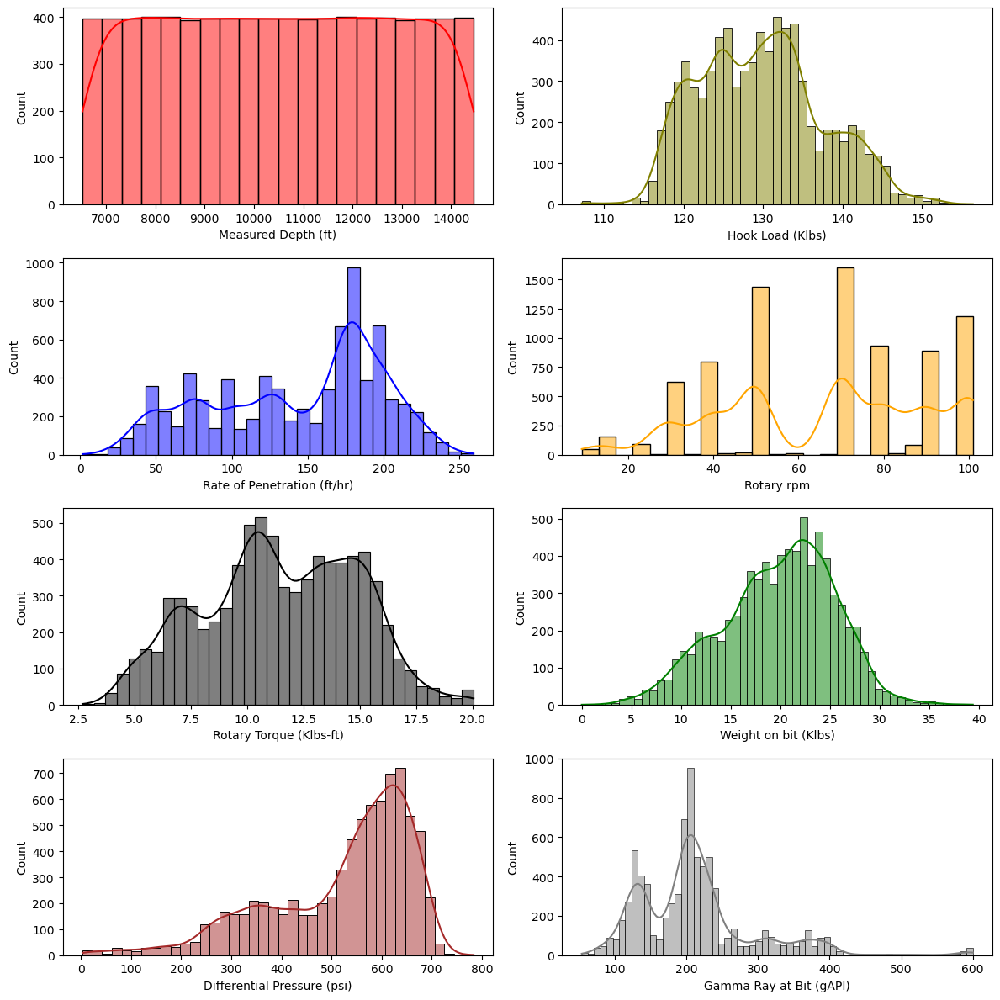

In [31]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.histplot(df['Hole Depth'], color = "red", ax = axes[0, 0], kde = True)
sns.histplot(df['Hook Load'], color = "olive", ax = axes[0, 1], kde = True)
sns.histplot(df['Rate Of Penetration'], color = "blue", ax = axes[1, 0], kde = True)
sns.histplot(df['Rotary RPM'], color = "orange", ax = axes[1, 1], kde = True)
sns.histplot(df['Rotary Torque'], color = "black", ax = axes[2, 0], kde = True)
sns.histplot(df['Weight on Bit'], color = "green", ax = axes[2, 1], kde = True)
sns.histplot(df['Differential Pressure'], color = "brown", ax = axes[3, 0], kde = True)
sns.histplot(df['Gamma at Bit'], color = "gray", ax = axes[3, 1], kde = True)


axes[0, 0].set_xlabel('Measured Depth (ft)')
axes[0, 1].set_xlabel('Hook Load (Klbs)')
axes[1, 0].set_xlabel('Rate of Penetration (ft/hr)')
axes[1, 1].set_xlabel('Rotary rpm')
axes[2, 0].set_xlabel('Rotary Torque (Klbs-ft)')
axes[2, 1].set_xlabel('Weight on bit (Klbs)')
axes[3, 0].set_xlabel('Differential Pressure (psi)')
axes[3, 1].set_xlabel('Gamma Ray at Bit (gAPI)')

plt.tight_layout()

* As observed, each parameter has a good distribution, and this is simply
based on the training data for one well and the distribution of each feature can
be improved by including more wells.

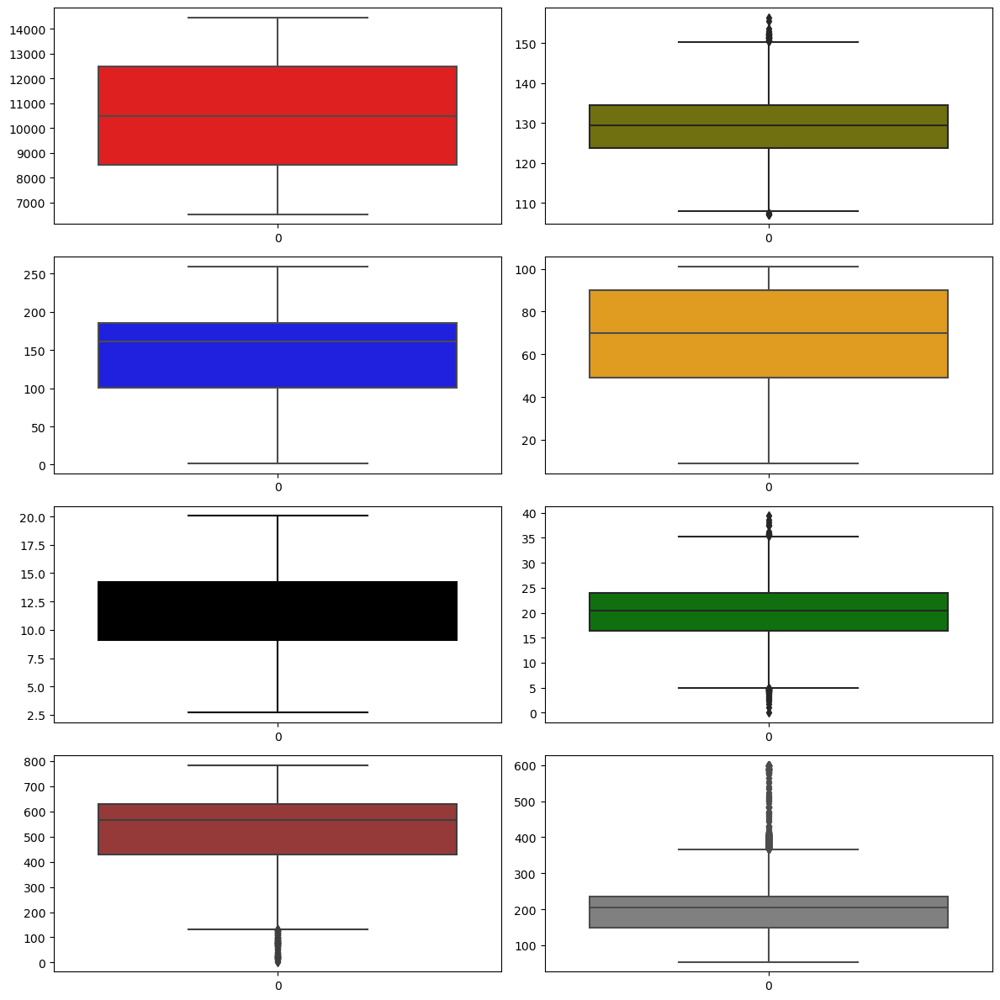

In [32]:
f, axes = plt.subplots(4, 2, figsize = (12, 12))

sns.boxplot(df['Hole Depth'], color = "red", ax = axes[0, 0])
sns.boxplot(df['Hook Load'], color = "olive", ax = axes[0, 1])
sns.boxplot(df['Rate Of Penetration'], color = "blue", ax = axes[1, 0])
sns.boxplot(df['Rotary RPM'], color = "orange", ax = axes[1, 1])
sns.boxplot(df['Rotary Torque'], color = "black", ax = axes[2, 0])
sns.boxplot(df['Weight on Bit'], color = "green", ax = axes[2, 1])
sns.boxplot(df['Differential Pressure'], color = "brown", ax = axes[3, 0])
sns.boxplot(df['Gamma at Bit'], color = "gray", ax = axes[3, 1])

plt.tight_layout()

<Axes: >

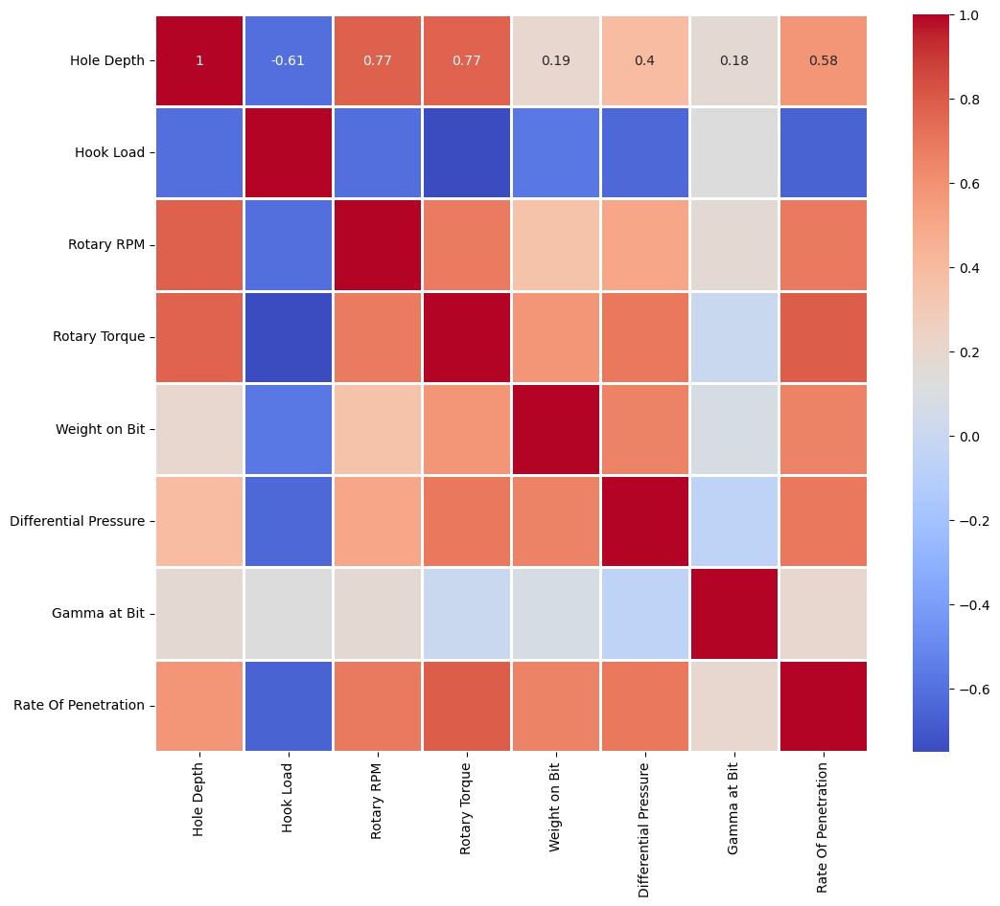

In [33]:
plt.figure(figsize = (12,10))

sns.heatmap(df.corr(), annot = True, linecolor = 'white',
            linewidths = 2, cmap = 'coolwarm')

* As illustrated, the majority of the features such as `rpm, torque, WOB, differential pressure, etc.`, have a **strong correlation** with `ROP`.

* This is very ***encouraging*** to see as this could potentially indicate that these features are `important in
relation to ROP`.

* Next, let’s use the MinMax scaler to normalize the data as
follows:

# Step 3 - Data Normalization

In [34]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler(feature_range = (0,1))
scaler.fit(df)

df_scaled = scaler.transform(df)

In [35]:
df_scaled = pd.DataFrame(df_scaled, columns = ['Hole Depth', 'Hook Load', 
                                               'Rotary RPM', 'Rotary Torque', 
                                               'Weight on Bit',
                                               'Differential Pressure', 
                                               'Gamma at Bit', 
                                               'Rate Of Penetration'])


y_scaled = df_scaled[['Rate Of Penetration']]
x_scaled = df_scaled.drop(['Rate Of Penetration'], axis = 1)

# Step 4 - Training the Model

In [36]:
from sklearn.model_selection import train_test_split
seed = 1000
np.random.seed(seed)

X_train, X_test,y_train, y_test = train_test_split(x_scaled, y_scaled, 
                                                 test_size = 0.30)

* Let’s start off by using a support vector machine model to examine the
model’s performance:

In [37]:
from sklearn.svm import SVR
np.random.seed(seed)
 
SVM = SVR(kernel = 'rbf', gamma = 1.5, C = 5)
SVM.fit(X_train,np.ravel(y_train))

SVR(C=5, gamma=1.5)

In [38]:
y_pred_train = SVM.predict(X_train)
y_pred_test = SVM.predict(X_test)

corr_train = np.corrcoef(y_train['Rate Of Penetration'],
                         y_pred_train) [0,1]

print('ROP Train Data r^2 = ', round(corr_train**2,4),
      ', r = ', round(corr_train,4))

ROP Train Data r^2 =  0.8967 , r =  0.947


## Important Notice
* The result looks reasonable considering that only one well was used for
train_test_split.

* Please note that the fine-tuning parameters such as gamma, C, etc., have not been optimized in this model and chapter 7 can be used to
perform this step.

* Next, plot the ROP testing actual versus prediction as
follows:

Text(0.5, 1.0, 'ROP Testing Actual vs. Prediction')

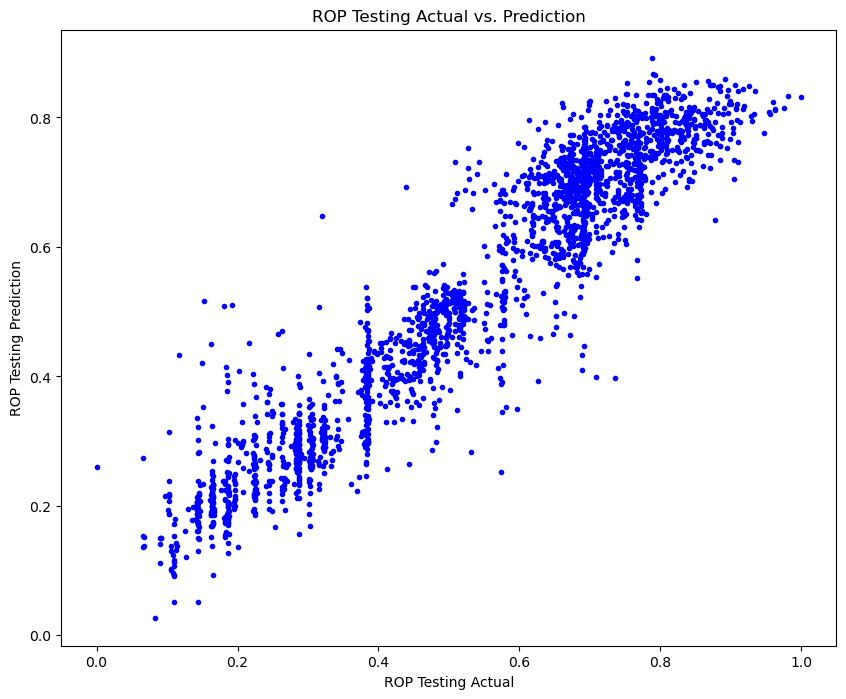

In [39]:
plt.figure(figsize = (10,8))

plt.plot(y_test['Rate Of Penetration'], y_pred_test, 'b.')
plt.xlabel('ROP Testing Actual')
plt.ylabel('ROP Testing Prediction')
plt.title('ROP Testing Actual vs. Prediction')

In [40]:
from sklearn import metrics
print('Testing ROP MAE:', round(metrics.mean_absolute_error(y_test
['Rate Of Penetration'], y_pred_test),4))
print('Testing ROP MSE:', round(metrics.mean_squared_error(y_test
['Rate Of Penetration'], y_pred_test),4))
print('Testing ROP RMSE:', round(np.sqrt
(metrics.mean_squared_error(y_test['Rate Of Penetration'],
y_pred_test)),4))

Testing ROP MAE: 0.0514
Testing ROP MSE: 0.0048
Testing ROP RMSE: 0.0689


# Step 5 - Testing the Model on a Blind Data

In [41]:
df_blind = pd.read_csv('Chapter5_ROP_Blind_DataSet.csv')

In [42]:
scaled_blind = scaler.transform(df_blind)

In [43]:
scaled_blind = pd.DataFrame(scaled_blind, columns = ['Hole Depth',
'Hook Load', 'Rotary RPM', 'Rotary Torque','Weight on Bit',
'Differential Pressure', 'Gamma at Bit','Rate Of Penetration'])


y_scaled_blind = scaled_blind['Rate Of Penetration']

x_scaled_blind = scaled_blind.drop(['Rate Of Penetration'], axis = 1)

In [44]:
y_pred_blind = SVM.predict(x_scaled_blind)

* Also obtain the R2 for the blind data set as follows:

In [45]:
corr_test = np.corrcoef(y_scaled_blind, y_pred_blind) [0,1]

print('ROP Blind Data r^2 = ',round(corr_test**2,4),
      ', r = ', round(corr_test,4))

ROP Blind Data r^2 =  0.6823 , r =  0.826


# Importance Notice
* As illustrated, the R^2 value for the blind set is low (as expected).

* This is
simply due to the size of the training and lack of training variations during the
training process.

* This example illustrates the importance of testing various
blind sets to make sure the model remains accurate prior to productionizing or commercializing a model.

* Next, let’s plot ROP blind actual versus prediction
as follows:

Text(0.5, 1.0, 'ROP Blind Actual vs. Prediction')

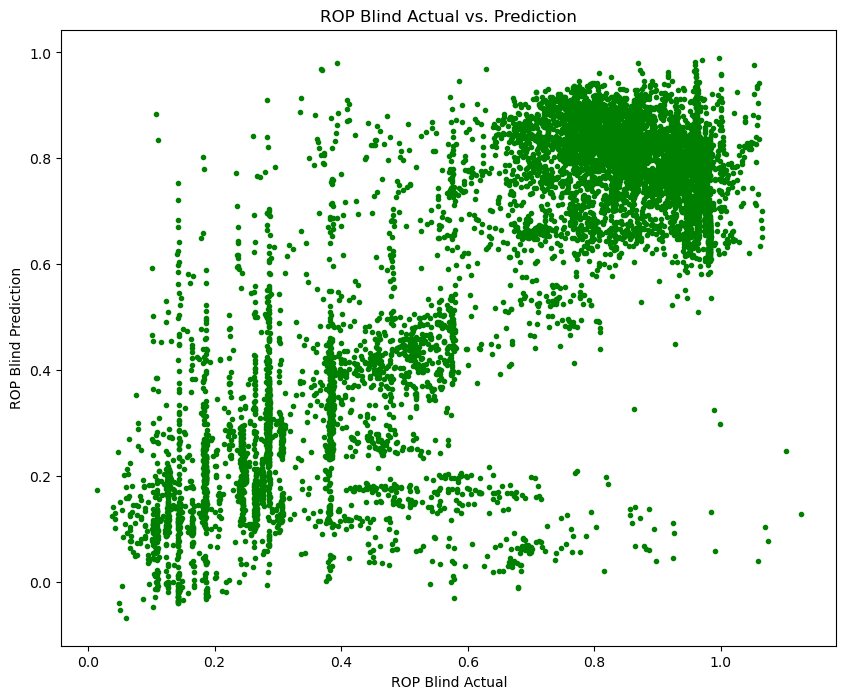

In [46]:
plt.figure(figsize = (10,8))

plt.plot(y_scaled_blind, y_pred_blind, 'g.')
plt.xlabel('ROP Blind Actual')
plt.ylabel('ROP Blind Prediction')
plt.title('ROP Blind Actual vs. Prediction')

* Next, to visualize the actual blind and predicted ROP data set, the
following lines of codes can be written:

<Axes: xlabel='Rate Of Penetration', ylabel='Hole Depth'>

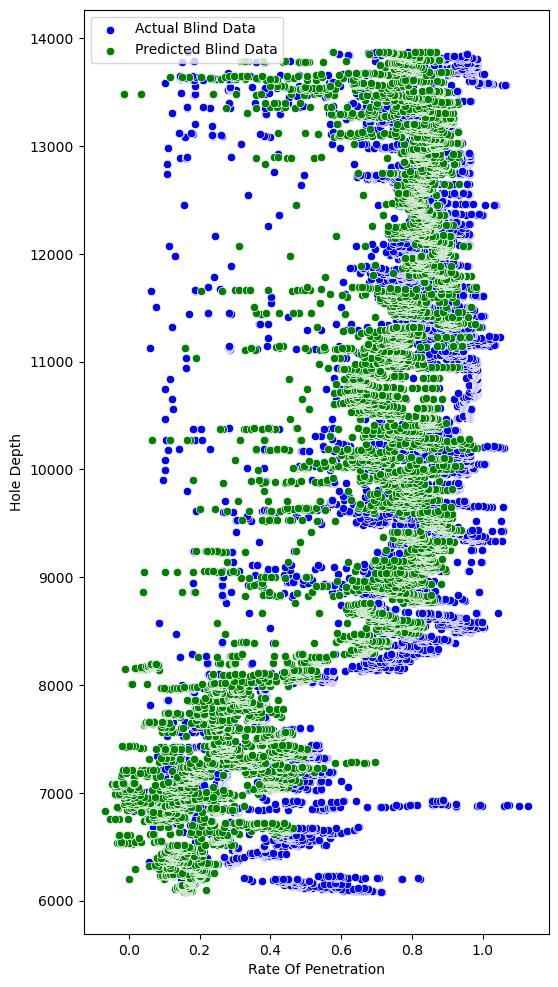

In [49]:
plt.figure(figsize = (6,12))

sns.scatterplot(x = y_scaled_blind, y = df_blind['Hole Depth'], label = 'Actual Blind Data', color = 'blue')
sns.scatterplot(x = y_pred_blind, y = df_blind['Hole Depth'], label = 'Predicted Blind Data', color = 'green')

# Important Notice
* As illustrated in this figure, the overall trend appears to be ok and other
algorithms should be tested to see their performances versus SVM.

* Let’s also
train an `extra tree model` in the same Jupyter Notebook file to see how it
performs as follows:

In [51]:
from sklearn.ensemble import ExtraTreesRegressor
np.random.seed(seed)

ET = ExtraTreesRegressor(n_estimators = 100, criterion = 'squared_error',
                         max_depth = None, min_samples_split = 2,
                         min_samples_leaf = 1)

ET.fit(X_train, np.ravel(y_train))

y_pred_train = ET.predict(X_train)
y_pred_test = ET.predict(X_test)

# Finding correlation coefficient between y_train and y_train_predicted
corr_train = np.corrcoef(y_train['Rate Of Penetration'], y_pred_train) [0,1]

print('ROP Train Data r^2 = ', round(corr_train**2,4),
      ', r = ',round(corr_train,4))

ROP Train Data r^2 =  1.0 , r =  1.0


In [53]:
corr_test = np.corrcoef(y_test['Rate Of Penetration'], y_pred_test)[0,1]
print('ROP Test Data r^2 = ', round(corr_test**2,4),
      ', r = ', round(corr_test,4))

ROP Test Data r^2 =  0.9509 , r =  0.9751


* Let’s also visualize the resulting scatter plot of ROP testing actual and
prediction using the extra trees model as follows:

Text(0.5, 1.0, 'ROP Testing Actual vs. Prediction Using Extra Trees Model')

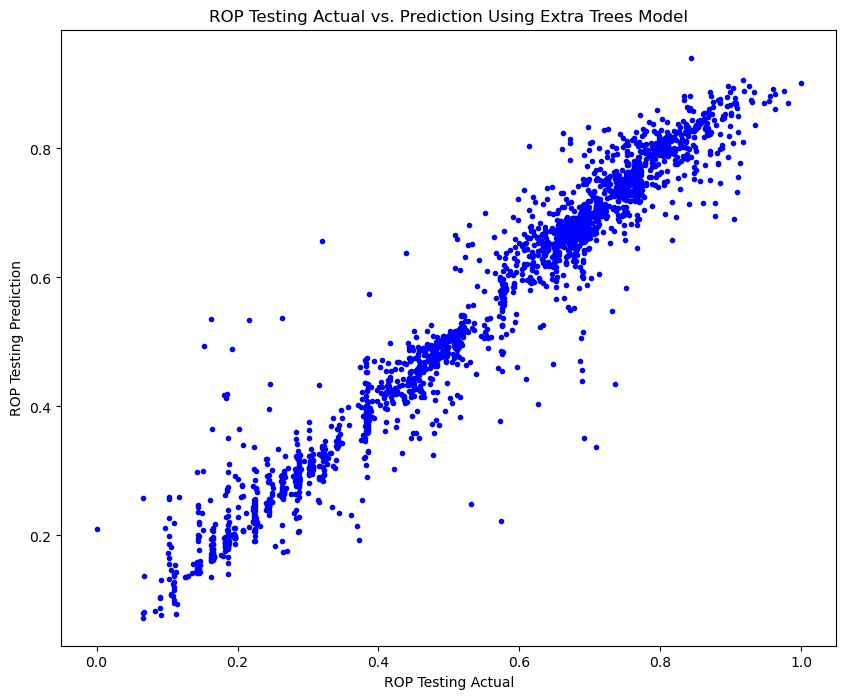

In [54]:
plt.figure(figsize = (10,8))

plt.plot(y_test['Rate Of Penetration'], y_pred_test, 'b.')
plt.xlabel('ROP Testing Actual')
plt.ylabel('ROP Testing Prediction')
plt.title('ROP Testing Actual vs. Prediction Using Extra Trees Model')

# Important Notice
* As illustrated, the **testing accuracy** when using `extra trees` is **higher than** the
`previous model (SVM)`.

* Let’s also apply this `trained extra trees model` to the blind data set that was previously imported as follows:

In [55]:
y_pred_blind = ET.predict(x_scaled_blind)

In [56]:
corr_test = np.corrcoef(y_scaled_blind, y_pred_blind) [0,1]

print('ROP Test Data r^2 = ', round(corr_test**2,4),
      ', r = ', round(corr_test,4))

ROP Test Data r^2 =  0.757 , r =  0.8701


# Important Notice
* As shown above, the blind set accuracy is also higher than the blind set
accuracy of the SVM model.

* Next, plot the ROP blind actual versus prediction as follows:

Text(0.5, 1.0, 'ROP Blind Actual vs. Prediction Using Extra Trees Model')

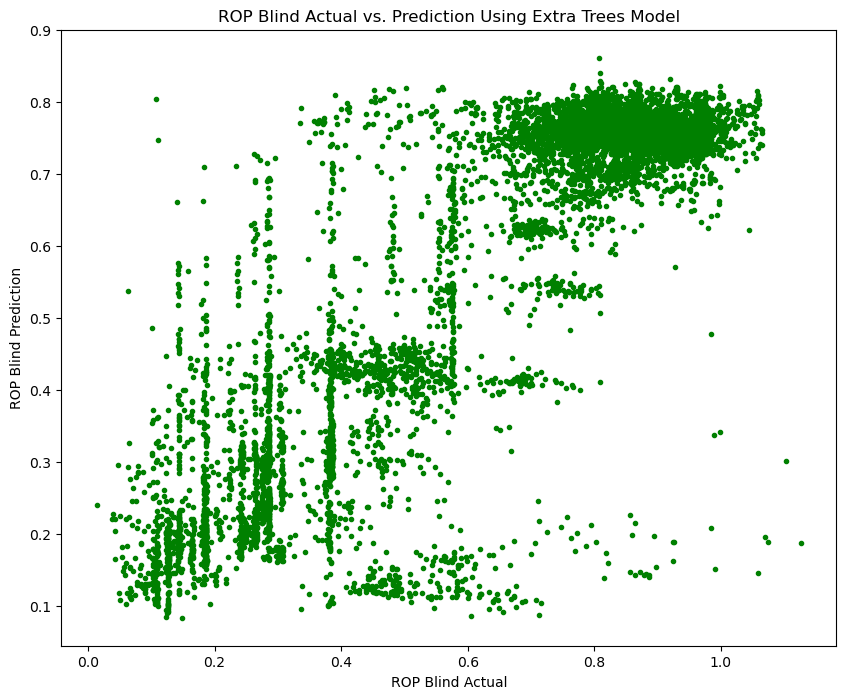

In [57]:
plt.figure(figsize = (10,8))
plt.plot(y_scaled_blind, y_pred_blind, 'g.')
plt.xlabel('ROP Blind Actual')
plt.ylabel('ROP Blind Prediction')
plt.title('ROP Blind Actual vs. Prediction Using Extra Trees Model')

# Finally
* Finally, let’s also plot this as a function of depth as follows:

<Axes: xlabel='Rate Of Penetration', ylabel='Hole Depth'>

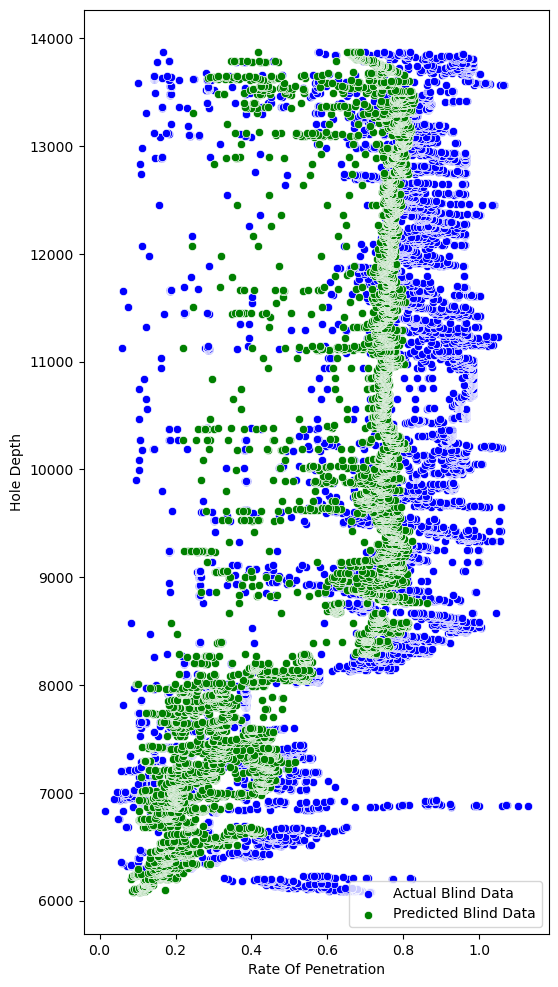

In [59]:
plt.figure(figsize = (6,12))

sns.scatterplot(x = y_scaled_blind, y = df_blind['Hole Depth'], label = 'Actual Blind Data', color = 'blue')
sns.scatterplot(x = y_pred_blind, y = df_blind['Hole Depth'], label = 'Predicted Blind Data', color = 'green')

## Extra Trees Model Performance and Next Steps

The Extra Trees model appears to be underperforming when applied to the **blind dataset**, suggesting that other algorithms should be explored to potentially improve accuracy over **SVM** or **Extra Trees**. The purpose of this example is to demonstrate the **proof of concept** of training a model to predict **ROP** based on data from one well and testing it on another well on the same pad. However, the current results are likely **suboptimal** due to the limited amount of training data.

### Next Steps:
The next phase involves building a model using data from **10s or 100s of wells**. Testing the accuracy of the model will help ensure that predictive capabilities are robust. While the selected features seem to be correct for this problem, this doesn't imply that other important features should be excluded. 

Due to the **limited availability of public data**, it is crucial to use **domain expertise** to incorporate all relevant features, thereby building a more comprehensive and powerful machine learning model. Training a model with data from **multiple wells** is recommended to improve its performance.

### Feature Importance Using Extra Trees:
Next, let's evaluate the **feature importance** using the **Extra Trees algorithm** as follows:


Text(0.5, 1.0, 'Feature Importance Ranking')

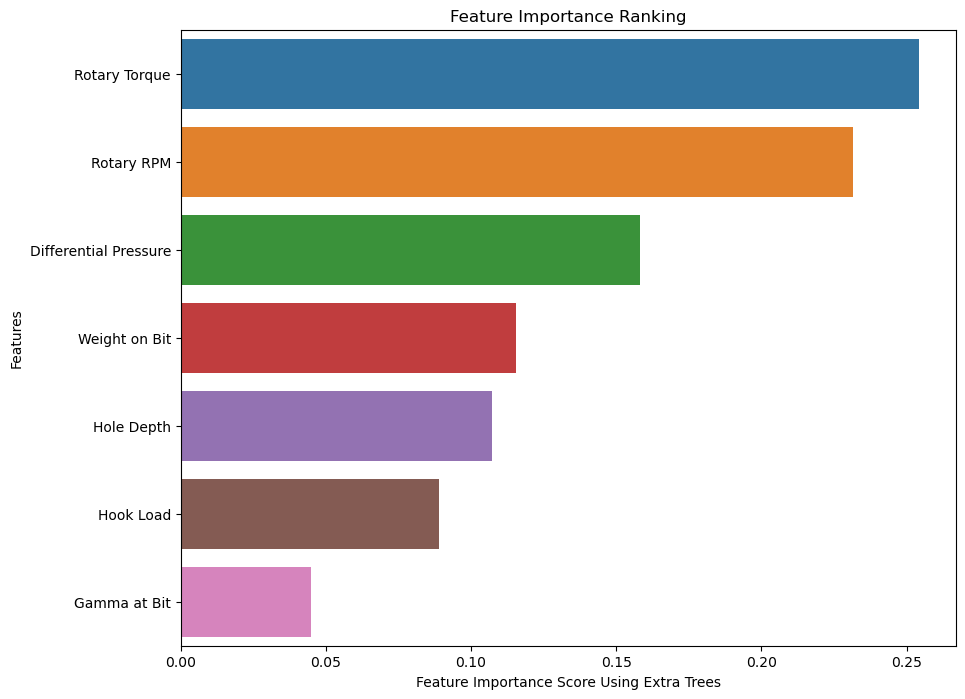

In [60]:
feature_names = df.columns[:-1]
plt.figure(figsize = (10,8))

feature_imp = pd.Series(ET.feature_importances_, index = feature_names).sort_values(ascending = False)
sns.barplot(x = feature_imp, y = feature_imp.index)
plt.xlabel('Feature Importance Score Using Extra Trees')
plt.ylabel('Features')
plt.title("Feature Importance Ranking")